In [1]:
from discrete_methods import *
import numpy as np
import matplotlib.pyplot as plt
import pickle
import pandas as pd
from IPython.display import Audio
import itertools
import multiprocessing 

# 2 stock returns simulated as Markov Chain

Given some $\delta$, the states are denoted by $\{0,1,\ldots,5\}$ correspond to $\{1-2\delta, 1-\delta, 1,1+\delta,1+2\delta,1+3\delta\}$. Each return is simulated as a MarkovChain each with its transition probabilities. Those transitions can either be chosen or randomly generated by a uniform random variable transformed with a softmax for each line to get a true distribution.

The action space corresponds to the weight invested in the first stock $a \in \{0.0,0.1,\ldots,0.9,1.0\}$ the remaining percentage $1-a$ is invested in second stock.


Transition probabilities can be chosen or randomly generated by 
Actions don't influence the return, this corresponds to the zero market impact assumption in finance. The actor investments are really small and thus don't influence the following returns.

The reward function only depends on the action taken $w_t$ and the next state $r_{t+1}$, it corresponds to: $r(r_t,w_t,r_{t+1}) = w_t\cdot \log(r_{t+1})$

The optimal policy depends uniquely on the transition probabilities. At each state, if the next immediate return has a positive expected return we should invest in it. If from a state, we can only go to positive return the weight in the stock is equal to one without a question.

## Learning rate specification
We define the learning rate of the Q-Learning as follow for a decay rate $\lambda$, a constant $\beta$ and another constant as power $\tau$, for $t\geq 1$:

\begin{equation*}
    \alpha_t = \beta + \frac{1}{1+(\lambda \cdot t)^\tau}
\end{equation*}
If not specified, $\beta=0$ and $\tau = 1$.

A variation of this specification is defined as an adaptive learning rate corresponding to a unique learning rate for each state as:
\begin{equation*}
    \alpha_t(s) = \frac{1}{1+(\lambda \cdot n_t(s))^\tau}, \quad \forall s\in \mathcal{S}
\end{equation*}
where $n_t(s)$ denotes the number of visits to state $s$ at time-step $t$.

In [2]:
diag_plus=np.array([1,.1,.5,.8,.6])
diag_minus=np.array([.9,.5,.2, .4,1])
p=np.diag(diag_plus,1)+np.diag(diag_minus,-1)
delta=0.01
MC=MarkovChain(delta,p)

### Random transition matrix

In [3]:
np.random.seed(1938)
p_rand = np.random.uniform(size=(7,7))
for i in range(p_rand.shape[0]):
    p_rand[i]=np.exp(p_rand[i])/np.sum(np.exp(p_rand[i]))
np.sum(p_rand)

p_rand

array([[0.13443502, 0.12469754, 0.10854038, 0.18684744, 0.17709221,
        0.18074162, 0.08764581],
       [0.15224023, 0.18814718, 0.09046379, 0.19744641, 0.08160903,
        0.20936404, 0.08072933],
       [0.10389576, 0.11596896, 0.26270914, 0.1621662 , 0.10222242,
        0.12329355, 0.12974395],
       [0.10388417, 0.18970026, 0.18150075, 0.08377724, 0.12832688,
        0.13142454, 0.18138615],
       [0.15227981, 0.19122316, 0.15758913, 0.10570085, 0.21661366,
        0.09416448, 0.08242891],
       [0.11249305, 0.12261177, 0.18880872, 0.1267546 , 0.11327839,
        0.15668251, 0.17937095],
       [0.11450142, 0.11604503, 0.20074177, 0.15331954, 0.21591508,
        0.08334483, 0.11613235]])

## First analysis: stock 1 has transition probability $p$ and stock 2 follows $p_{rand}$

In [4]:
delta=0.01
MC2d=MarkovChain_2D(delta,p,p_rand)


In [5]:
true_qval=MC2d.true_qval(delta=1e-8)

Time needed to converge with delta =  1e-08  :  687


In [6]:
for k in true_qval.keys():
    print(k, ' : Optimal action : ', np.argmax(true_qval[k]))

[0.98, 0.97]  : Optimal action :  0
[0.98, 0.98]  : Optimal action :  0
[0.98, 0.99]  : Optimal action :  0
[0.98, 1.0]  : Optimal action :  0
[0.98, 1.01]  : Optimal action :  0
[0.98, 1.02]  : Optimal action :  0
[0.98, 1.03]  : Optimal action :  0
[0.99, 0.97]  : Optimal action :  0
[0.99, 0.98]  : Optimal action :  0
[0.99, 0.99]  : Optimal action :  0
[0.99, 1.0]  : Optimal action :  0
[0.99, 1.01]  : Optimal action :  0
[0.99, 1.02]  : Optimal action :  0
[0.99, 1.03]  : Optimal action :  0
[1.0, 0.97]  : Optimal action :  0
[1.0, 0.98]  : Optimal action :  10
[1.0, 0.99]  : Optimal action :  10
[1.0, 1.0]  : Optimal action :  0
[1.0, 1.01]  : Optimal action :  10
[1.0, 1.02]  : Optimal action :  0
[1.0, 1.03]  : Optimal action :  10
[1.01, 0.97]  : Optimal action :  10
[1.01, 0.98]  : Optimal action :  10
[1.01, 0.99]  : Optimal action :  10
[1.01, 1.0]  : Optimal action :  10
[1.01, 1.01]  : Optimal action :  10
[1.01, 1.02]  : Optimal action :  10
[1.01, 1.03]  : Optimal actio

In [7]:
for k in true_qval.keys():
    if k.startswith('[1.0,'):
        print(k, ' True optimal action : ',np.argmax(true_qval[k]))
print('\n',' Expected log-return of second stock : ')
for i in range(p_rand.shape[0]):
    print('State ',i,' : ',np.dot(p_rand[i,:],(np.log([1 + delta* (np.arange(7) - int(np.ceil(7 / 2)) + 1)])).reshape(-1,1))[0])

[1.0, 0.97]  True optimal action :  0
[1.0, 0.98]  True optimal action :  10
[1.0, 0.99]  True optimal action :  10
[1.0, 1.0]  True optimal action :  0
[1.0, 1.01]  True optimal action :  10
[1.0, 1.02]  True optimal action :  0
[1.0, 1.03]  True optimal action :  10

  Expected log-return of second stock : 
State  0  :  0.00022711077660320295
State  1  :  -0.00200313347317789
State  2  :  -0.0008540257245426639
State  3  :  0.0004201715794783789
State  4  :  -0.0036287901839411733
State  5  :  0.0017307434544325513
State  6  :  -0.0006179622121533993


#### Clearly, if return in stock 1 is strictly greater than 1.0 we should invest in first stock as its next log-return will be positive. On the contrary, if return in stock is strictly smaller than 1.0.
Hence, only uncertainty if first return is 1.0, in this case it depends if expected log-return of the next return of second stock is positive or not. We can see it in the output of last cell that this is in fact verified.

In [8]:
N=1000000
training=pd.DataFrame(MC2d.simulate(N),index=['S1','S2'])

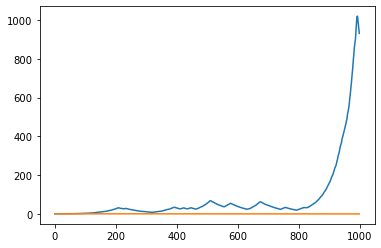

In [9]:
N_test=1000
testing=pd.DataFrame(MC2d.simulate(N_test),index=['S1','S2'])
plt.plot(np.cumprod(testing.iloc[0,:]))
plt.plot(np.cumprod(testing.iloc[1,:]))
plt.show()

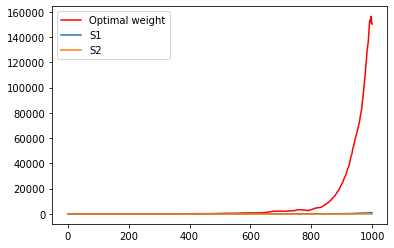

In [43]:
w_opt=exploit_optimal(true_qval, testing,window=1)
ret_opt = np.sum(w_opt * testing.iloc[:, 1:], axis=0)
plt.plot(np.cumprod(ret_opt),'red')
plt.plot(np.cumprod(testing.iloc[0,1:]))
plt.plot(np.cumprod(testing.iloc[1,:]))
plt.legend(['Optimal weight', 'S1','S2'])
plt.show()

In [18]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01]:
        for tau in [1,0.8]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval)])
            
    res_MCrand = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


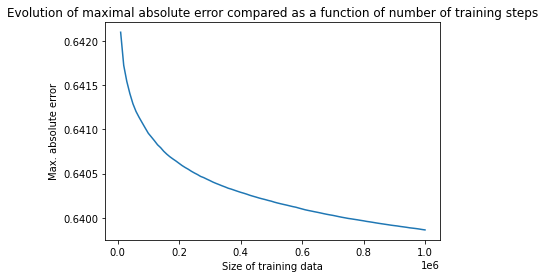

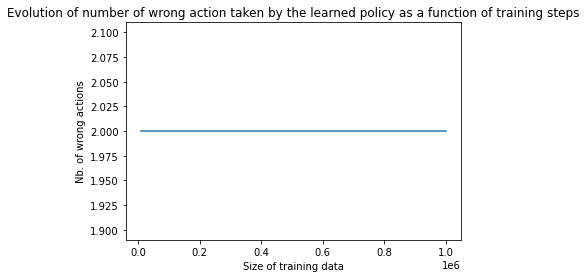


 Wrong actions : 
[1.0, 0.99] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


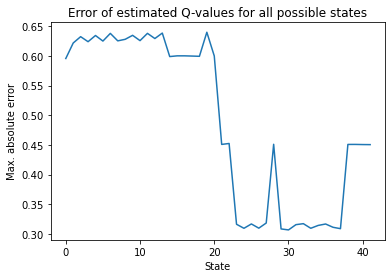


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


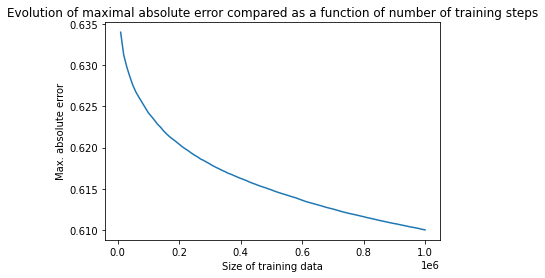

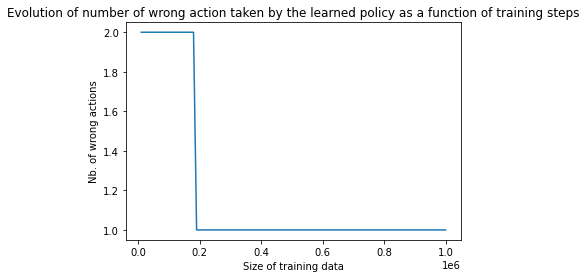


 Wrong actions : 
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


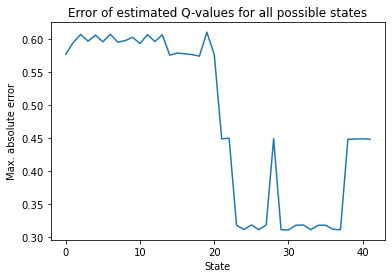


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


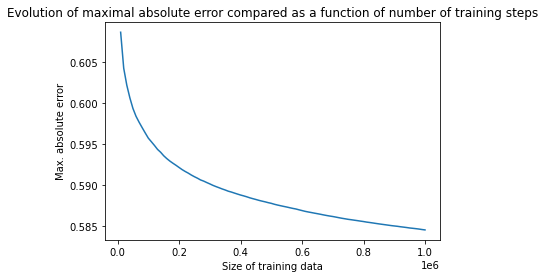

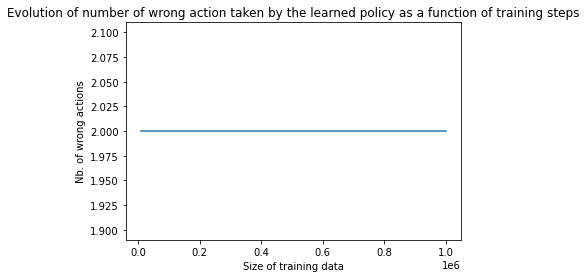


 Wrong actions : 
[1.0, 0.99] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


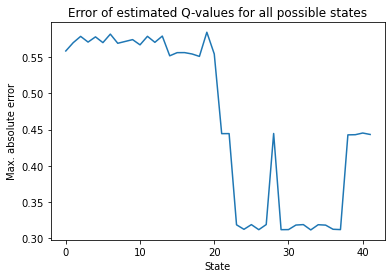


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


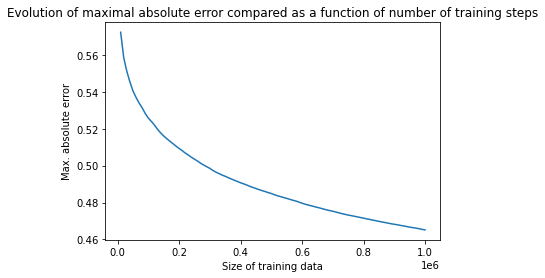

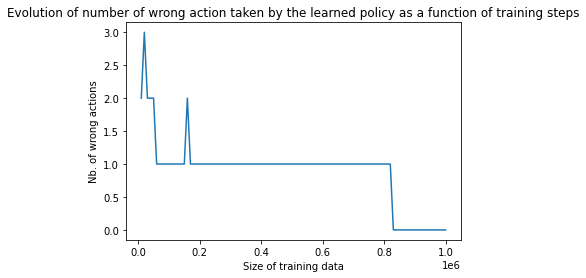


 Wrong actions : 
Optimal policy derived !!


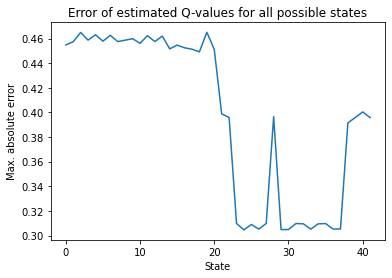


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


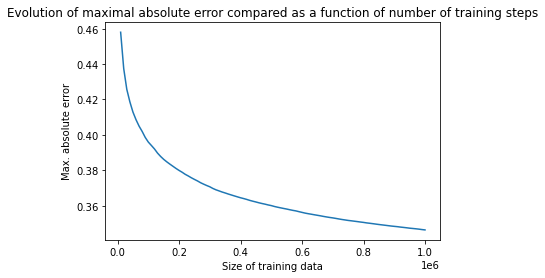

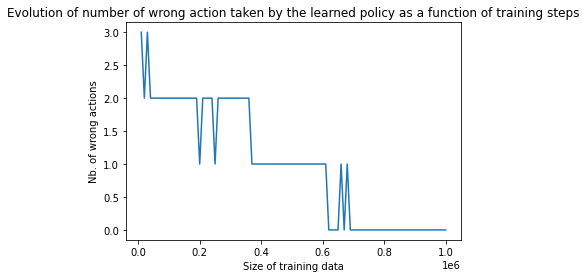


 Wrong actions : 
Optimal policy derived !!


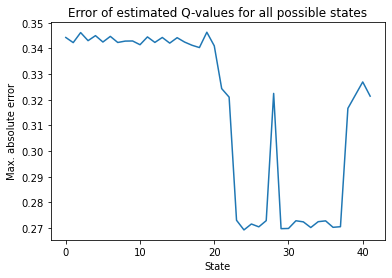


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


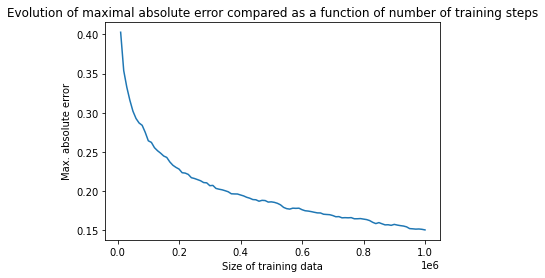

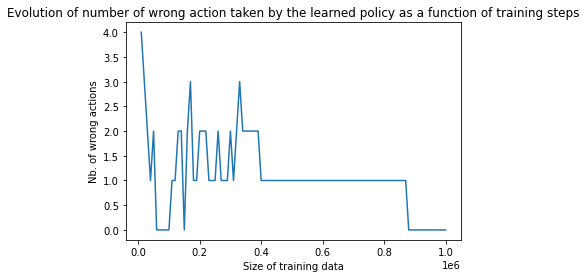


 Wrong actions : 
Optimal policy derived !!


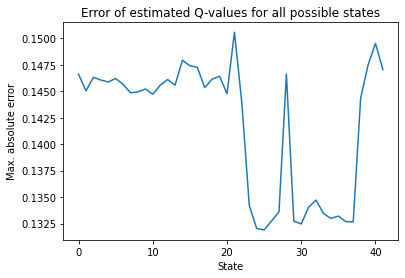

In [19]:
for x in res_MCrand:
    plot_res_multi_QLearning(x,true_qval)

In [36]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval,adaptive_lr=True)])
            
    res_MCrand_adaptlr = pool.map(multi_train_QLearning, params)



 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


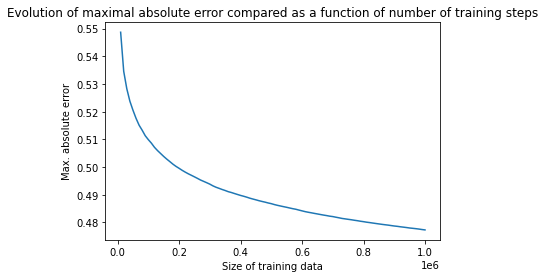

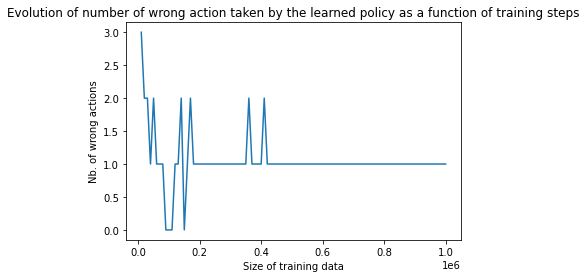


 Wrong actions : 
[1.0, 0.97] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1


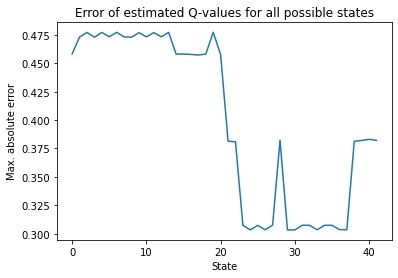


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


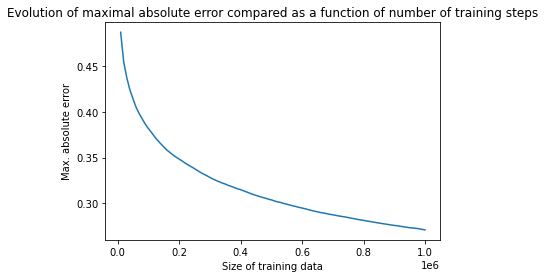

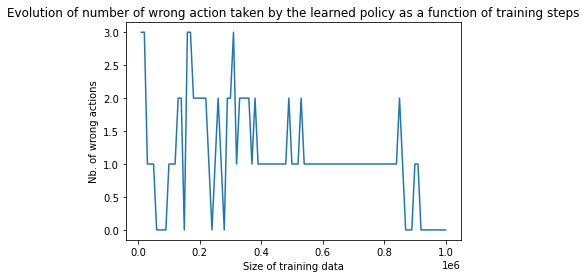


 Wrong actions : 
Optimal policy derived !!


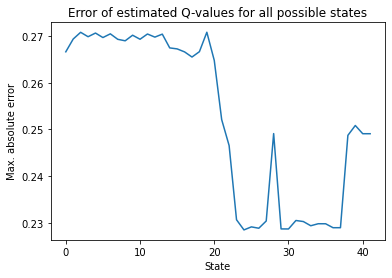


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


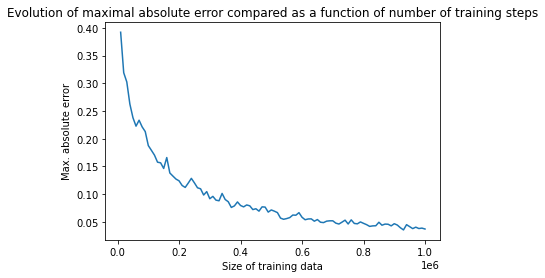

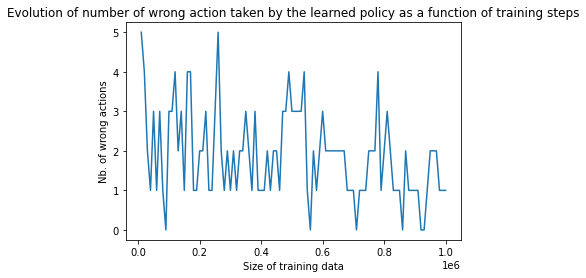


 Wrong actions : 
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


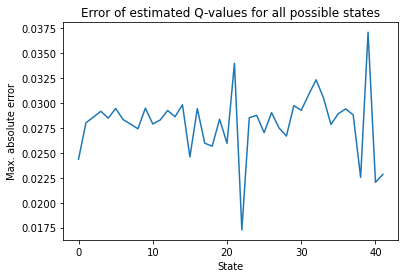


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


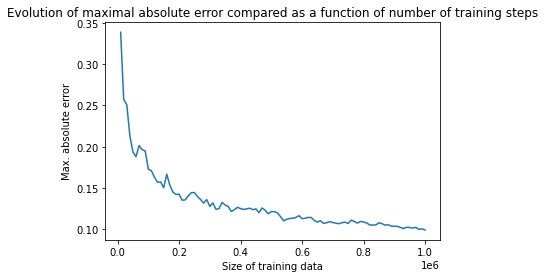

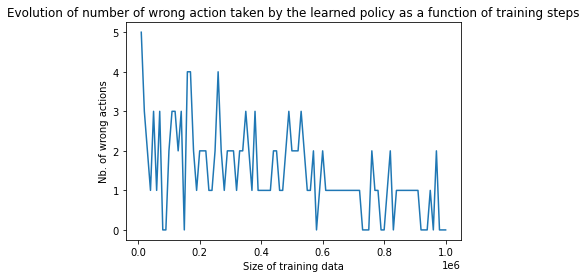


 Wrong actions : 
Optimal policy derived !!


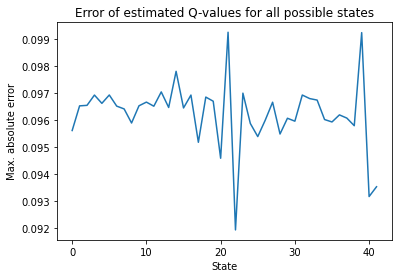


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


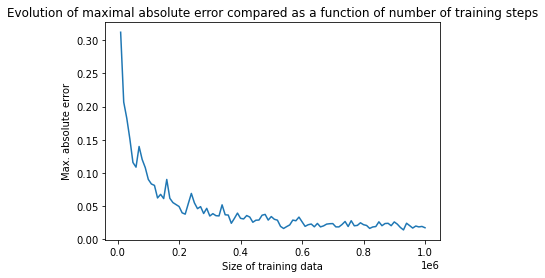

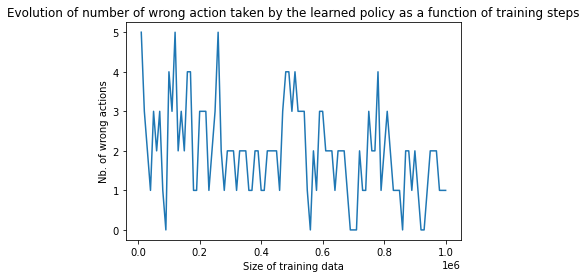


 Wrong actions : 
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


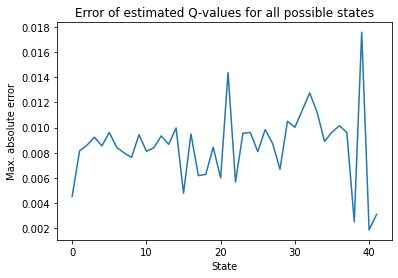


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


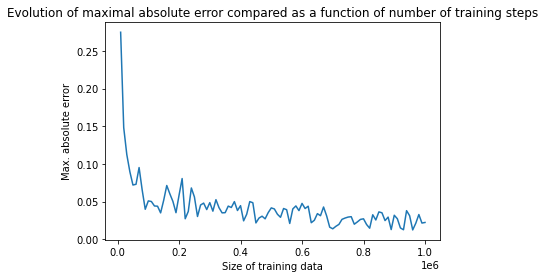

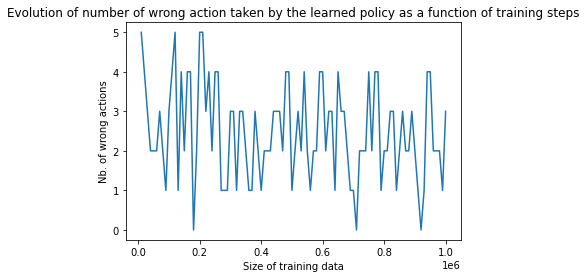


 Wrong actions : 
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.0] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


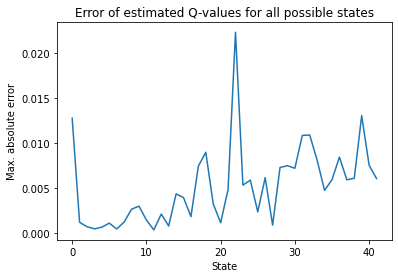


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


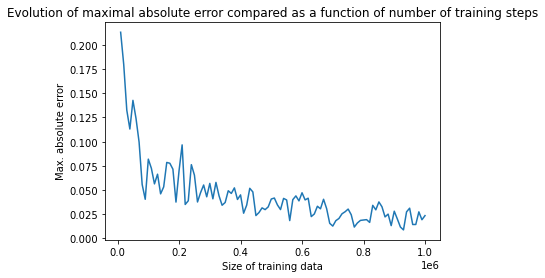

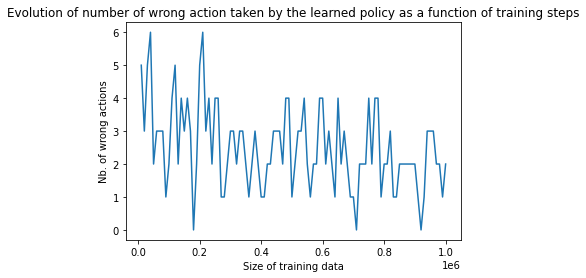


 Wrong actions : 
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


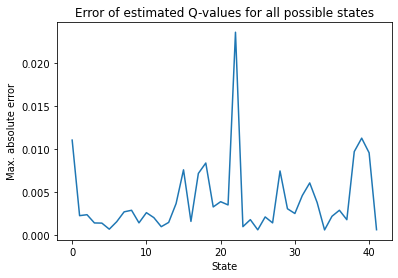


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


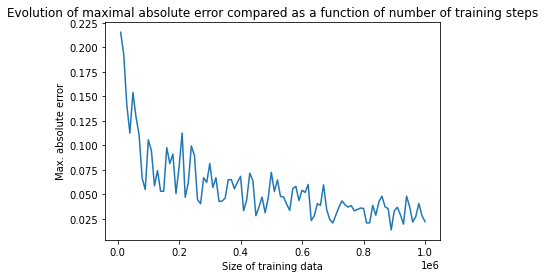

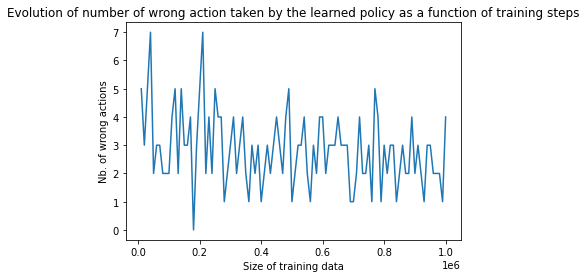


 Wrong actions : 
[1.0, 0.97] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.0] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


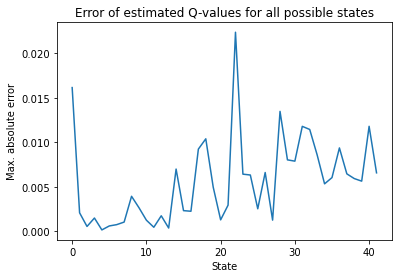


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


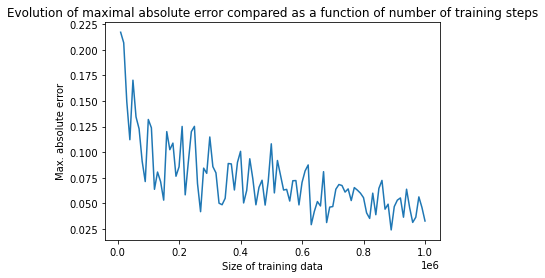

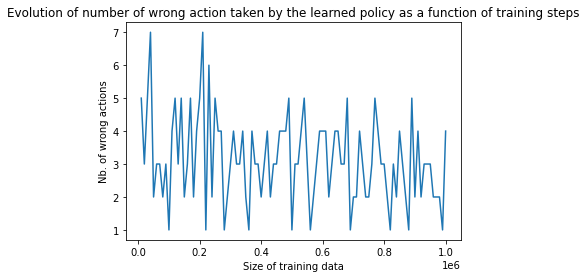


 Wrong actions : 
[1.0, 0.97] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1
[1.0, 1.0] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


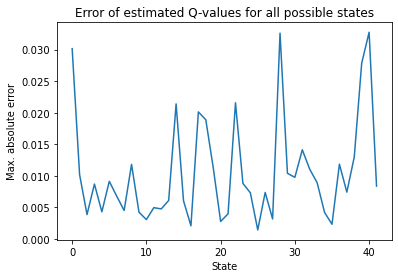

In [37]:
for x in res_MCrand_adaptlr:
    plot_res_multi_QLearning(x,true_qval)

In [20]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [100,50,10]:
        for tau in [1,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval,adaptive_lr=True)])
            
    res_MCrand_adaptlr_2 = pool.map(multi_train_QLearning, params)



 

Learning rate dependent on states: Decay rate : 100, Beta : 0, Tau : 1


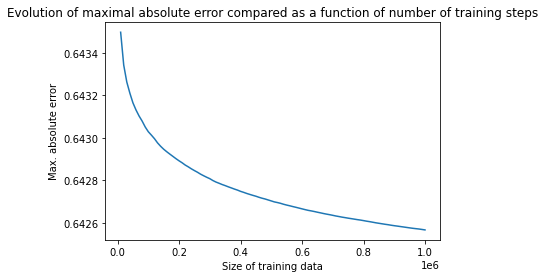

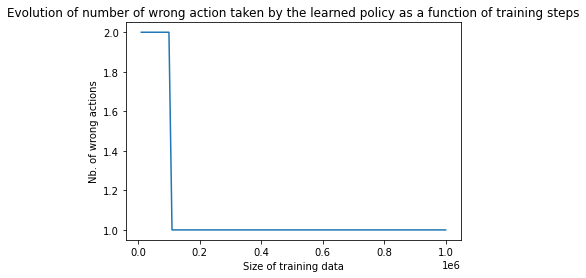


 Wrong actions : 
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


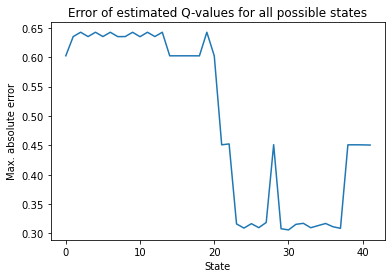


 

Learning rate dependent on states: Decay rate : 100, Beta : 0, Tau : 0.6


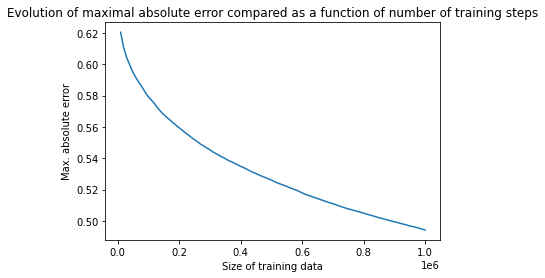

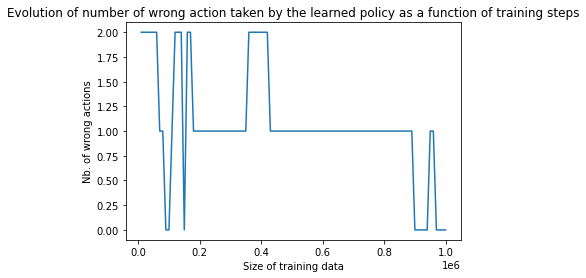


 Wrong actions : 
Optimal policy derived !!


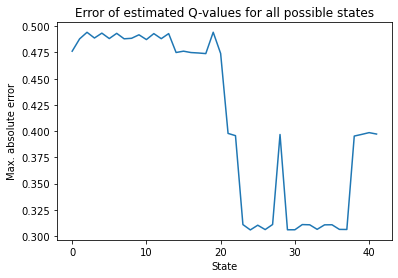


 

Learning rate dependent on states: Decay rate : 50, Beta : 0, Tau : 1


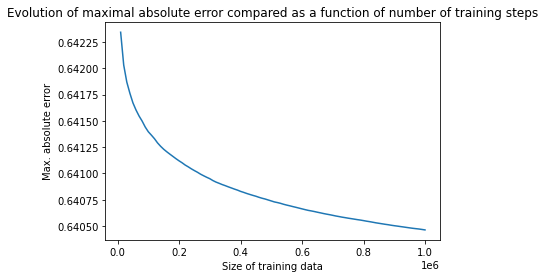

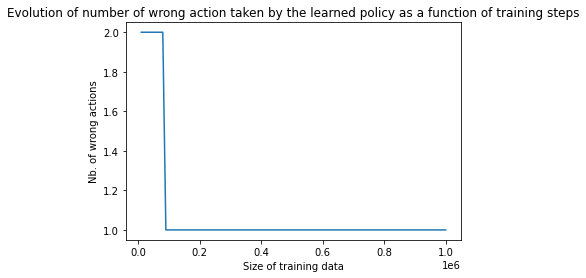


 Wrong actions : 
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


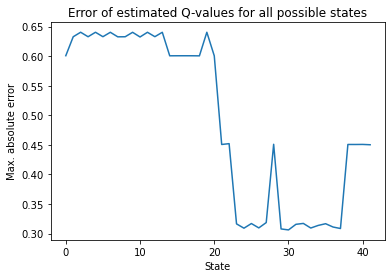


 

Learning rate dependent on states: Decay rate : 50, Beta : 0, Tau : 0.6


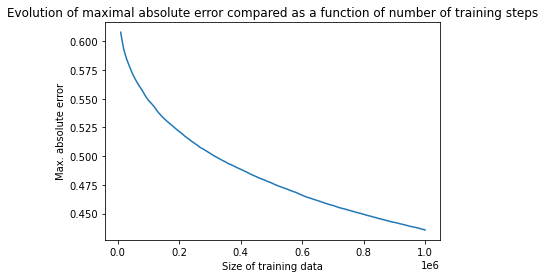

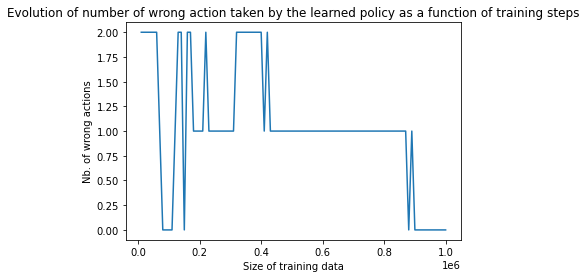


 Wrong actions : 
Optimal policy derived !!


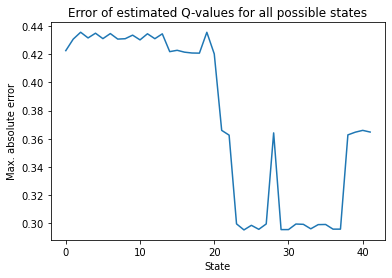


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 1


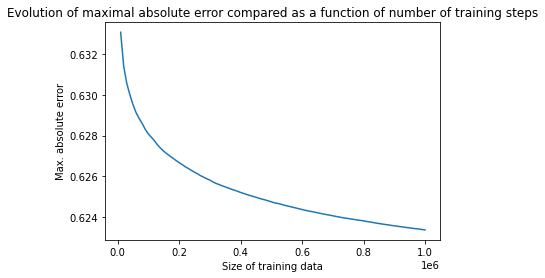

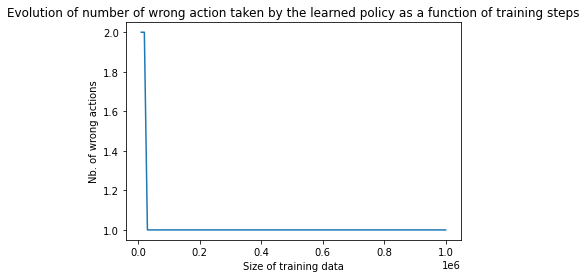


 Wrong actions : 
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


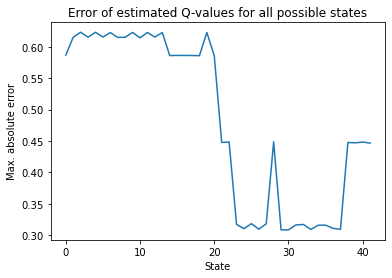


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.6


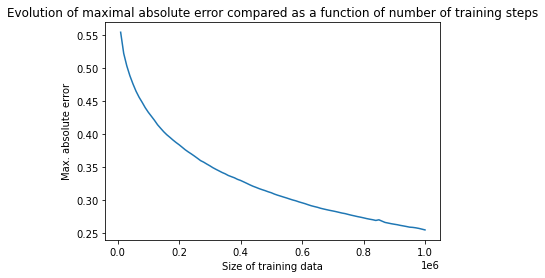

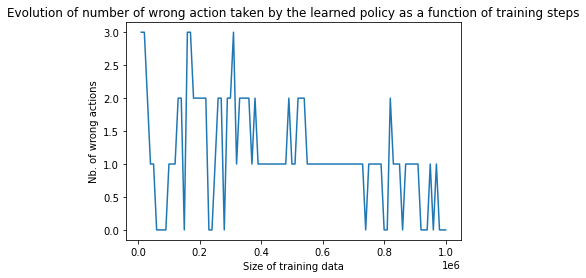


 Wrong actions : 
Optimal policy derived !!


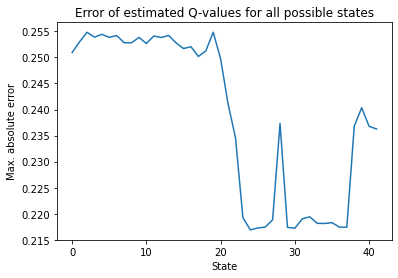

In [21]:
for x in res_MCrand_adaptlr_2:
    plot_res_multi_QLearning(x,true_qval)

In [22]:
PROCESSES = 3
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [0.001]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval)])
            
    res_MCrand_decay_rate001 = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


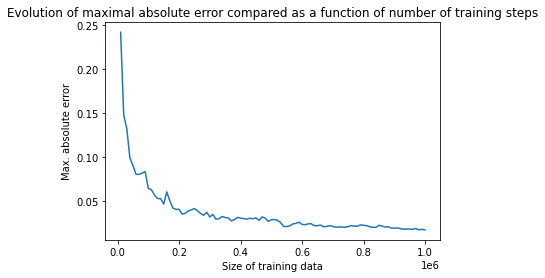

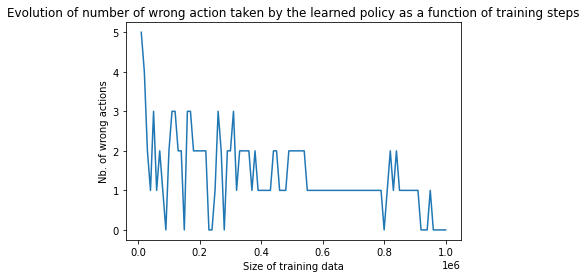


 Wrong actions : 
Optimal policy derived !!


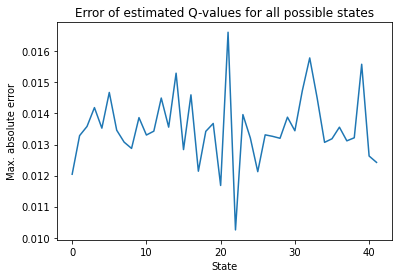


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


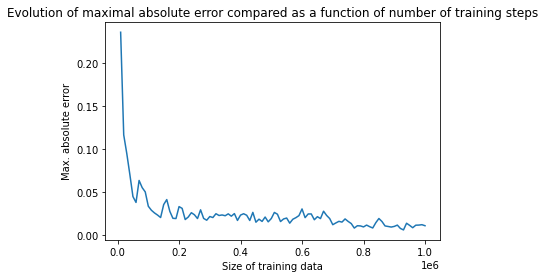

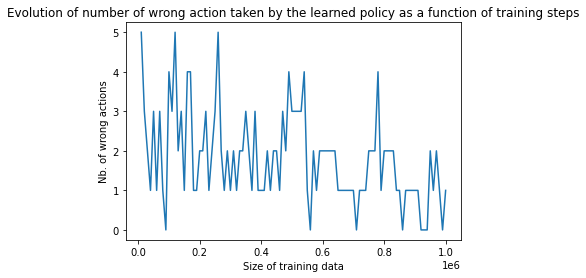


 Wrong actions : 
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  6


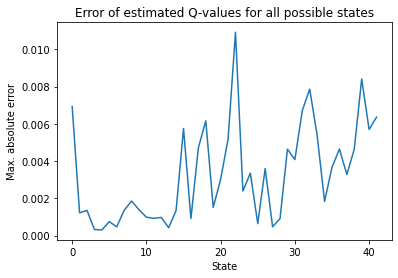


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


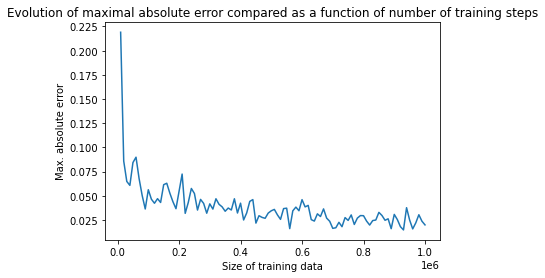

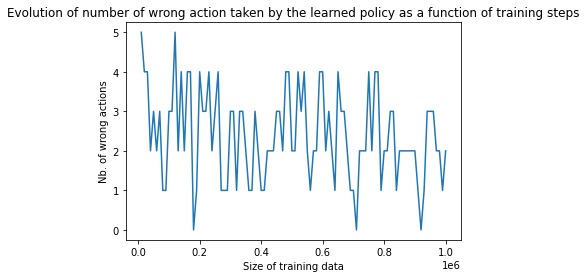


 Wrong actions : 
[1.0, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.0, 1.03] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2


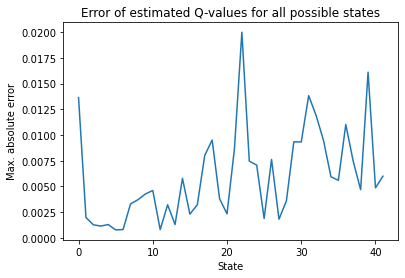

In [23]:
for x in res_MCrand_decay_rate001:
    plot_res_multi_QLearning(x,true_qval)

### Q-Learning could learn most of the time the optimal policy when window size equal to one. However, maximal absolute errors remain quite high. For the adaptive learning rate, performance is better for higher values of $\lambda$.

## Window = 2

In [24]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.01]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtableMC(MC2d,true_qval))])
            
    res_MCrand_w2 = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


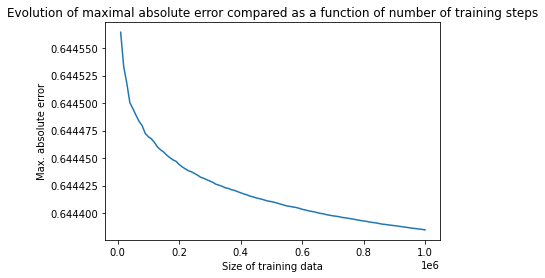

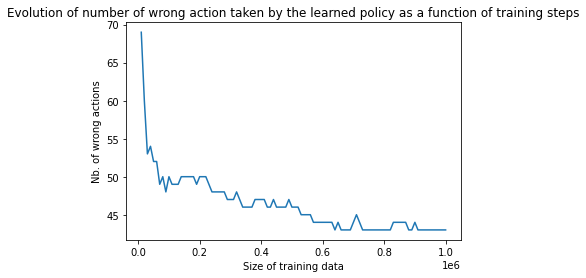


 Wrong actions : 
There are a lot of wrong actions :  43


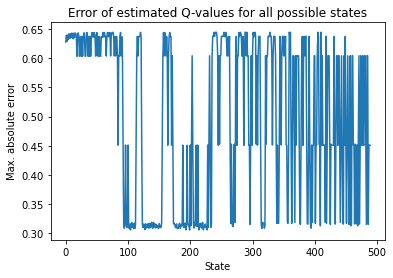


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


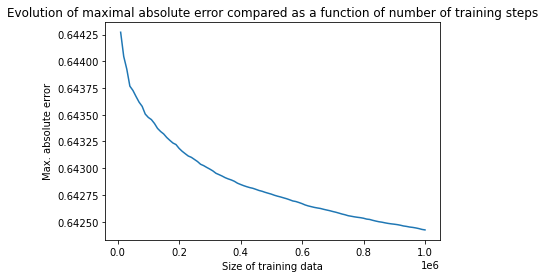

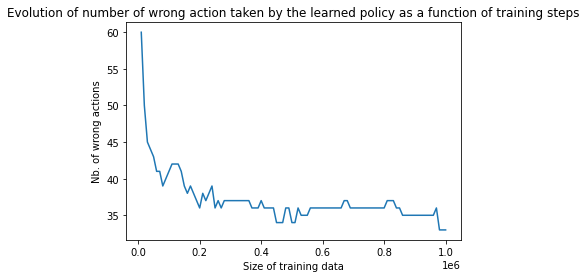


 Wrong actions : 
There are a lot of wrong actions :  33


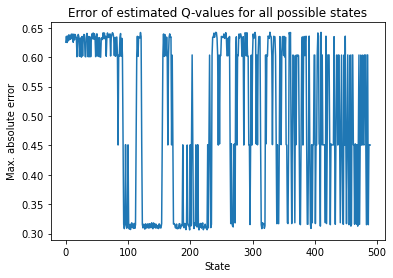


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


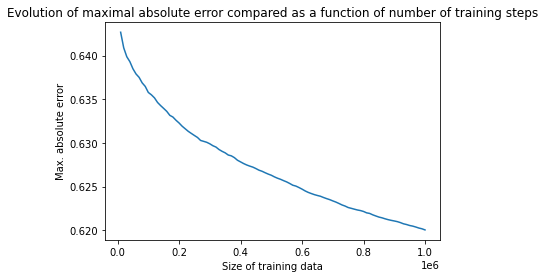

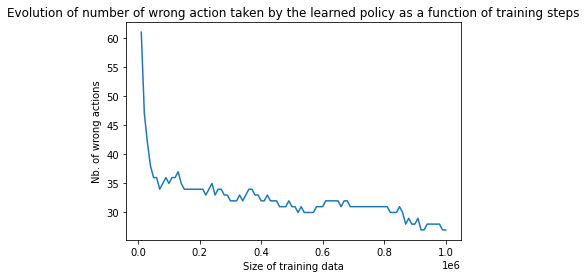


 Wrong actions : 
There are a lot of wrong actions :  27


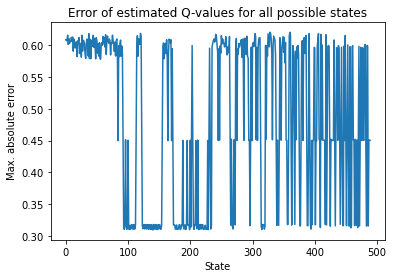


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


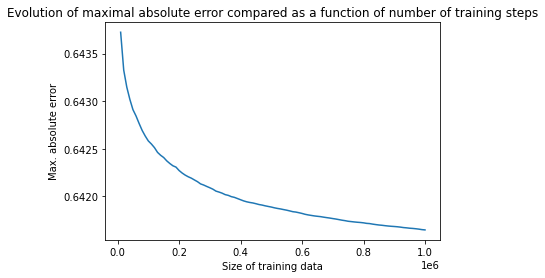

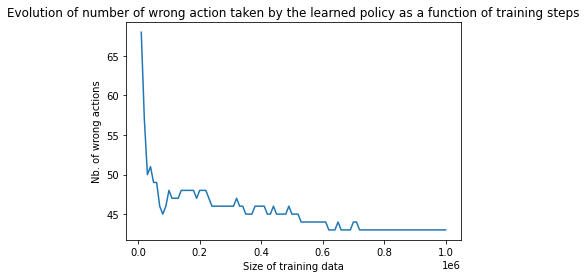


 Wrong actions : 
There are a lot of wrong actions :  43


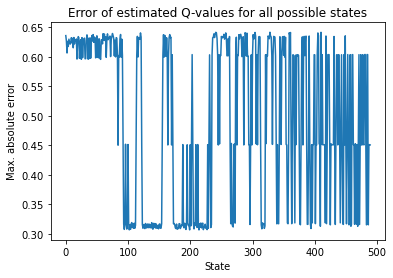


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


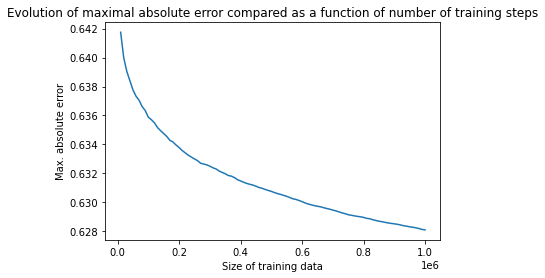

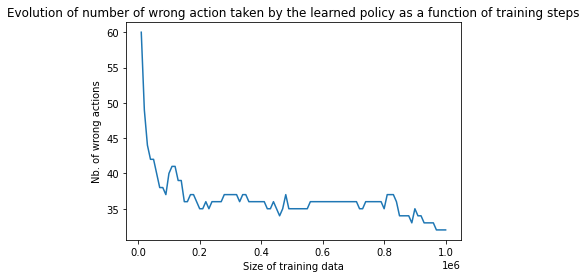


 Wrong actions : 
There are a lot of wrong actions :  32


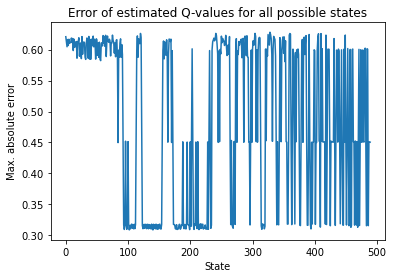


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


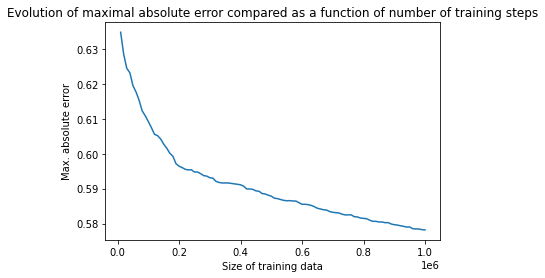

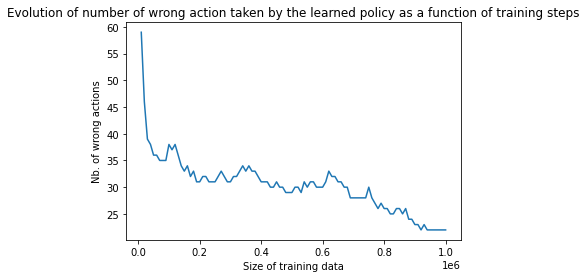


 Wrong actions : 
There are a lot of wrong actions :  22


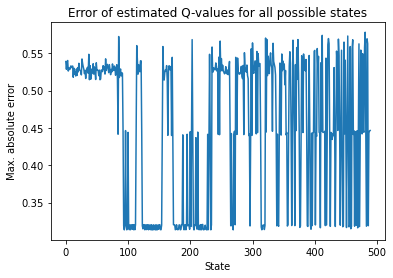


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


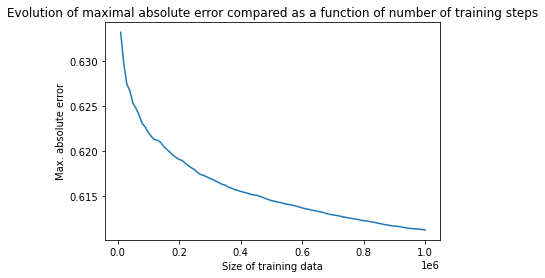

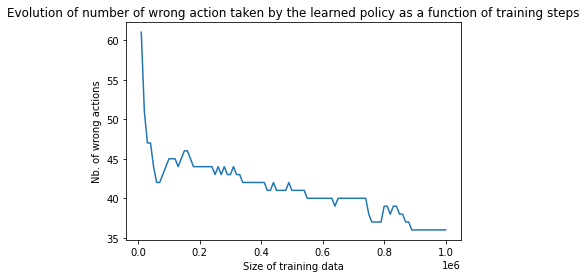


 Wrong actions : 
There are a lot of wrong actions :  36


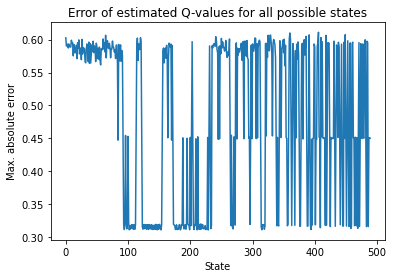


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


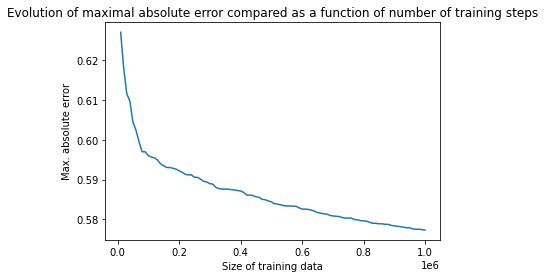

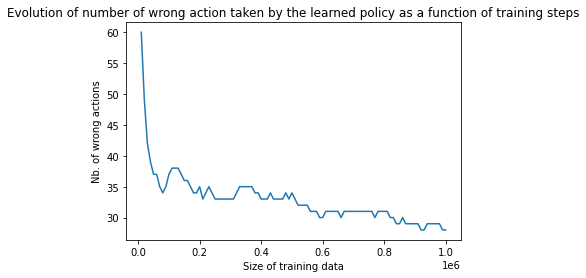


 Wrong actions : 
There are a lot of wrong actions :  28


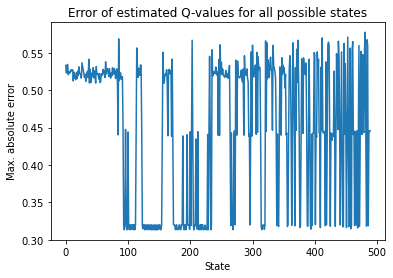


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


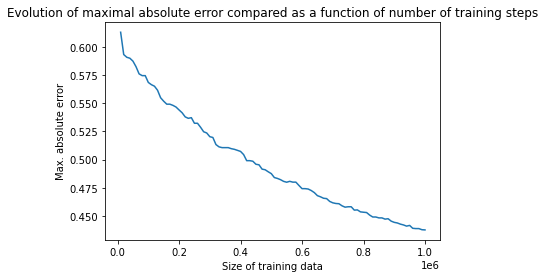

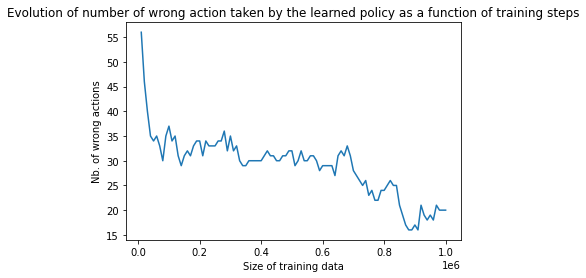


 Wrong actions : 
There are a lot of wrong actions :  20


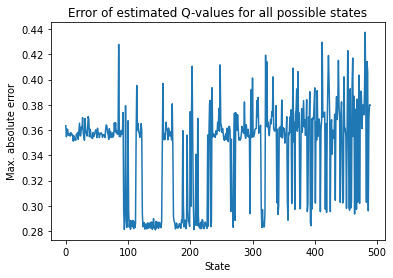


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


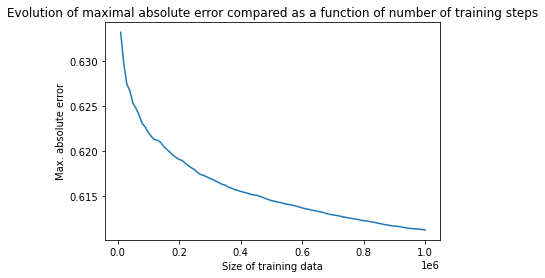

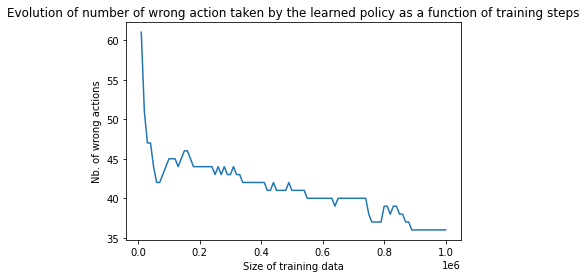


 Wrong actions : 
There are a lot of wrong actions :  36


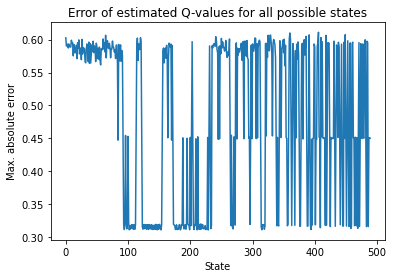


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


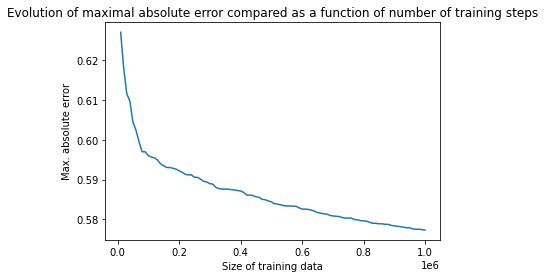

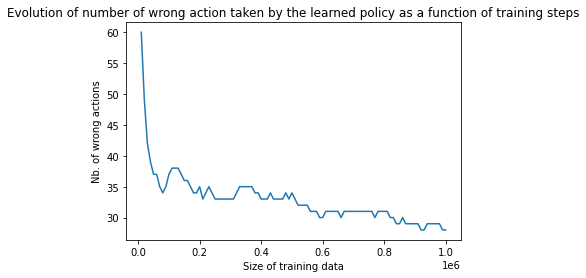


 Wrong actions : 
There are a lot of wrong actions :  28


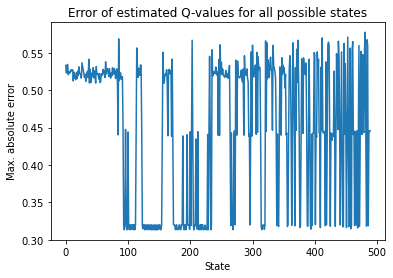


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


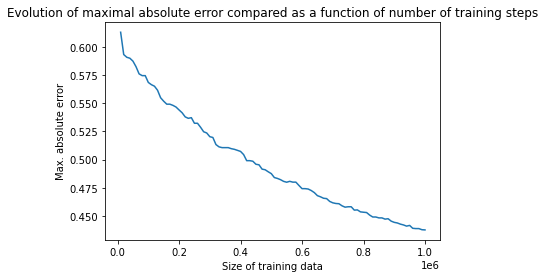

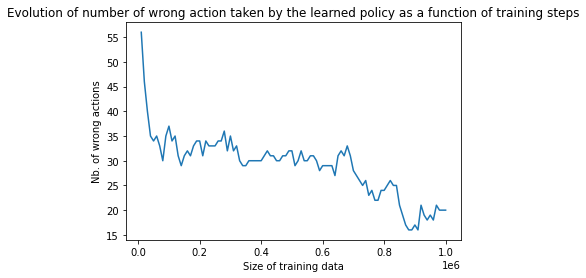


 Wrong actions : 
There are a lot of wrong actions :  20


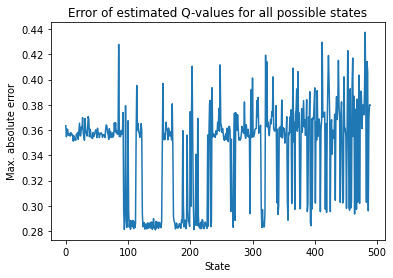

In [25]:
for x in res_MCrand_w2:
    plot_res_multi_QLearning(x,extend_qtableMC(MC2d,true_qval))

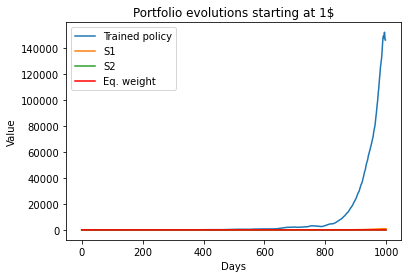

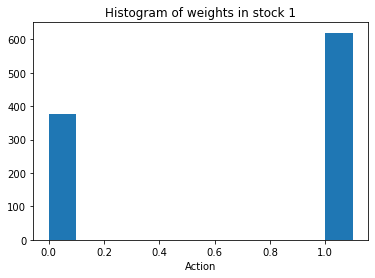

In [26]:
plot_result(res_MCrand_w2[8]['exploit_test'])

In [27]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.01]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtableMC(MC2d,true_qval),adaptive_lr=True)])
            
    res_MCrand_w2_adaptlr = pool.map(multi_train_QLearning, params)



 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


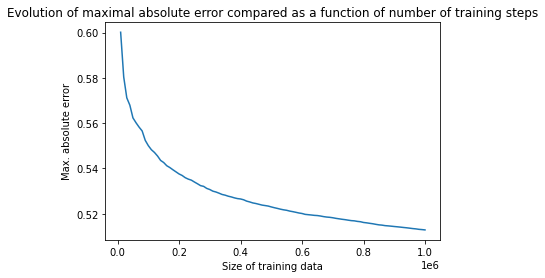

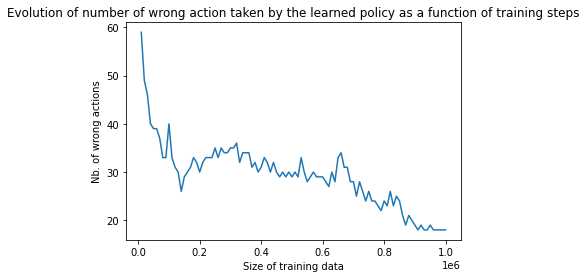


 Wrong actions : 
There are a lot of wrong actions :  18


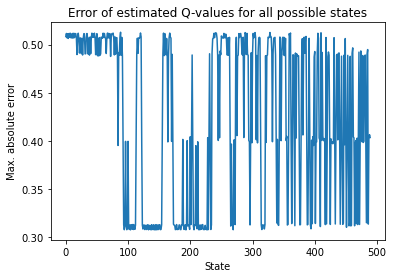


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


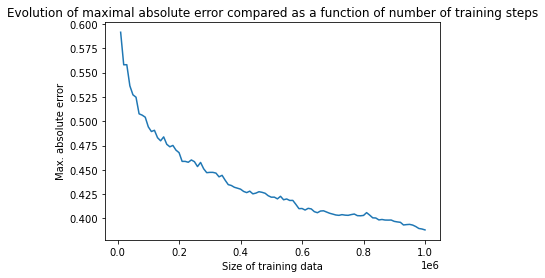

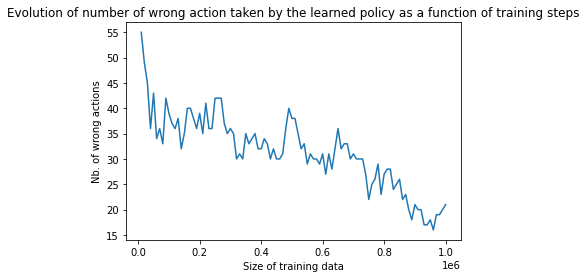


 Wrong actions : 
There are a lot of wrong actions :  21


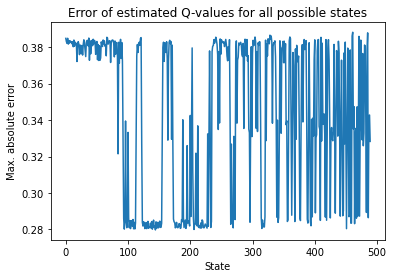


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


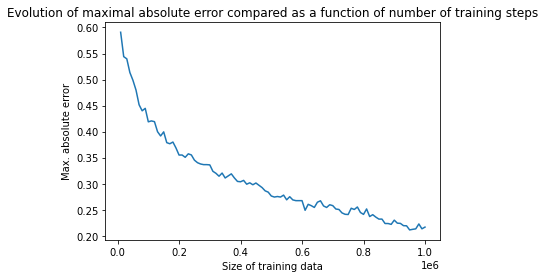

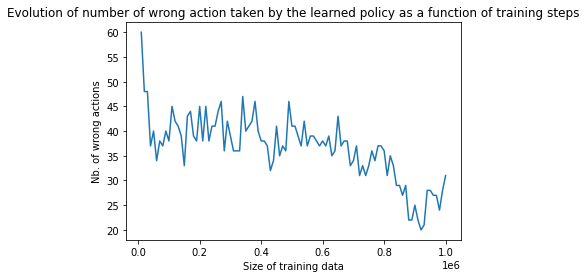


 Wrong actions : 
There are a lot of wrong actions :  31


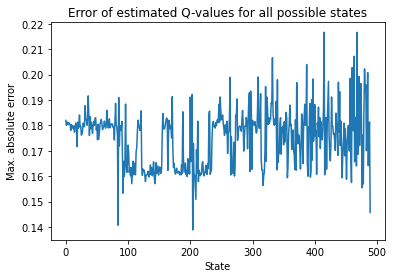


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


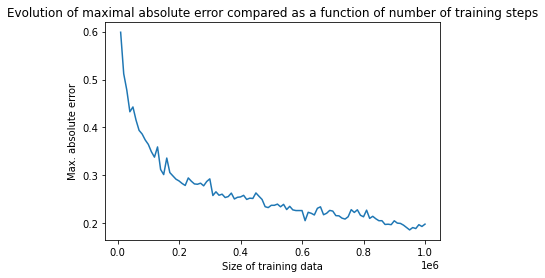

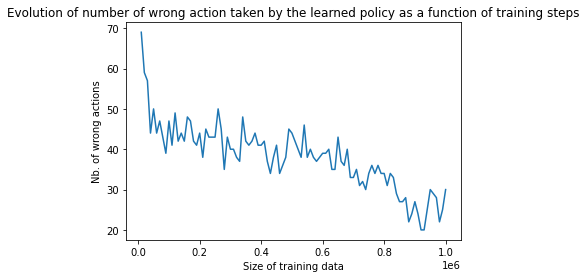


 Wrong actions : 
There are a lot of wrong actions :  30


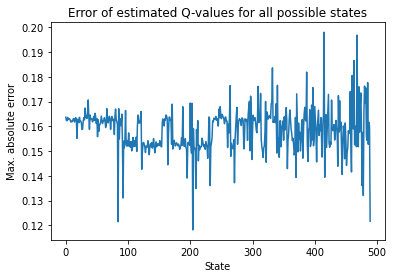


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


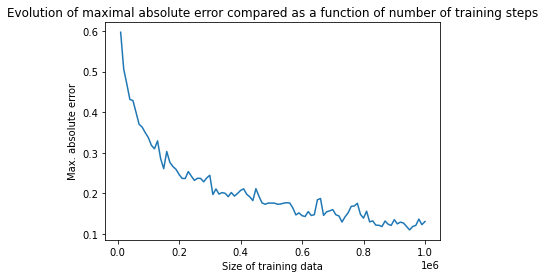

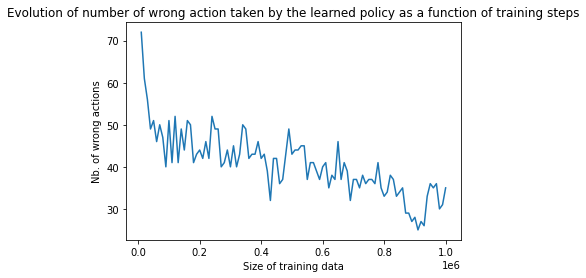


 Wrong actions : 
There are a lot of wrong actions :  35


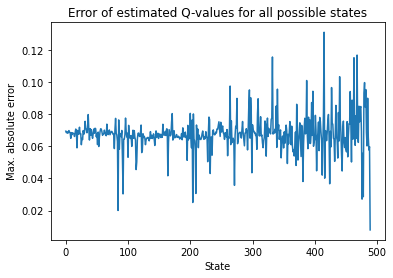


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


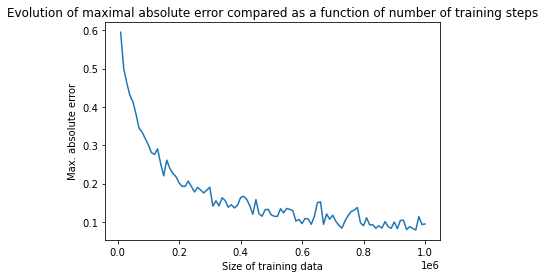

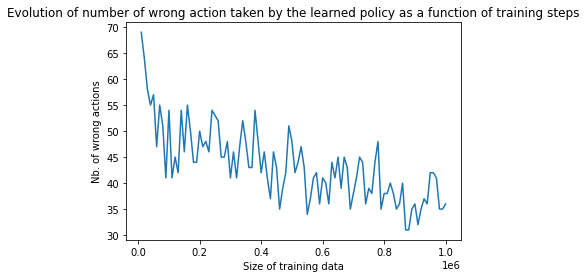


 Wrong actions : 
There are a lot of wrong actions :  36


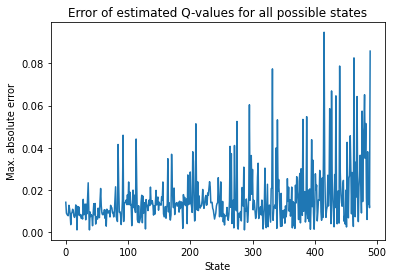


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


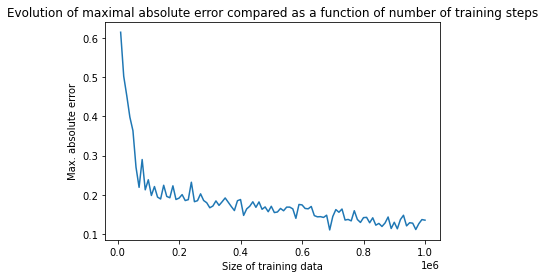

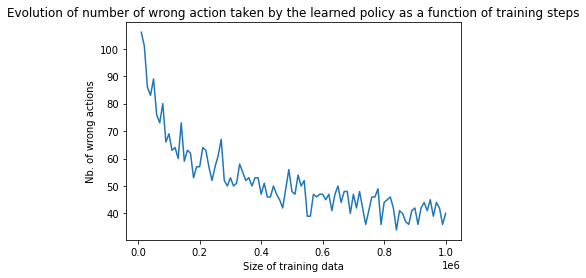


 Wrong actions : 
There are a lot of wrong actions :  40


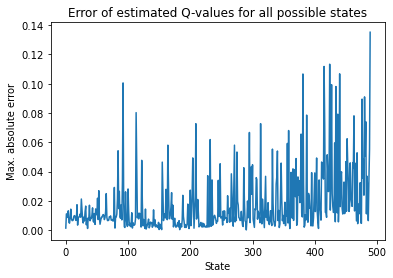


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


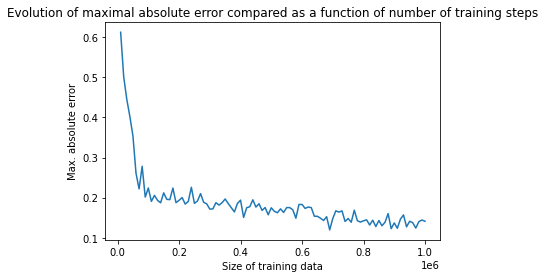

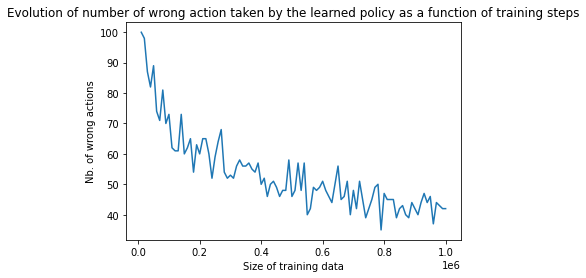


 Wrong actions : 
There are a lot of wrong actions :  42


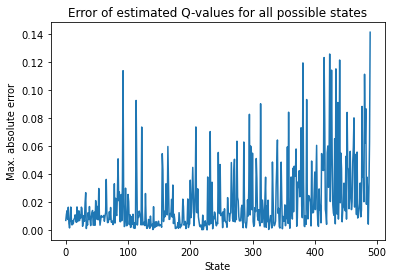


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


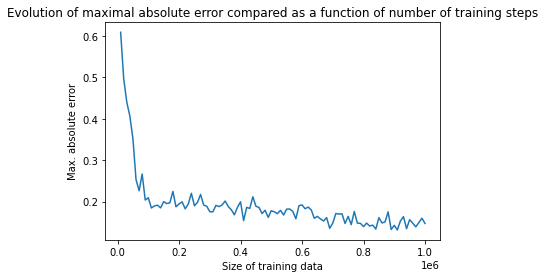

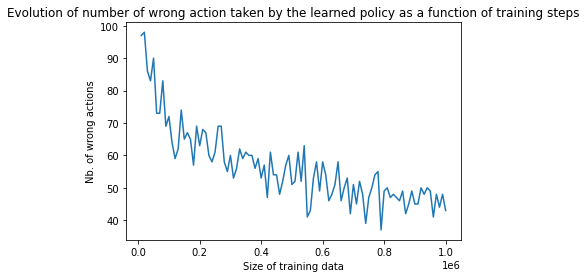


 Wrong actions : 
There are a lot of wrong actions :  43


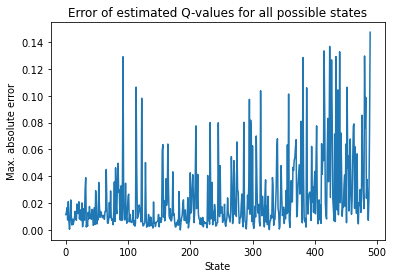


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


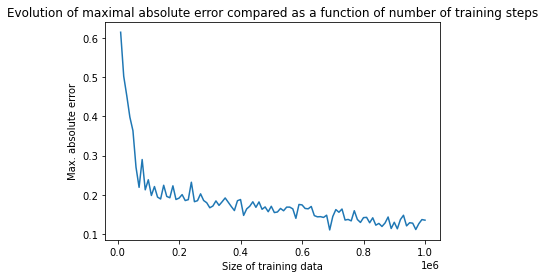

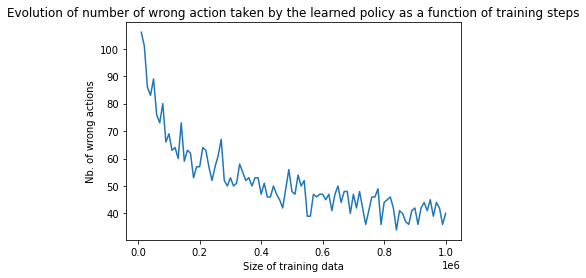


 Wrong actions : 
There are a lot of wrong actions :  40


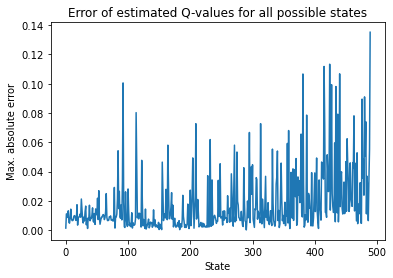


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


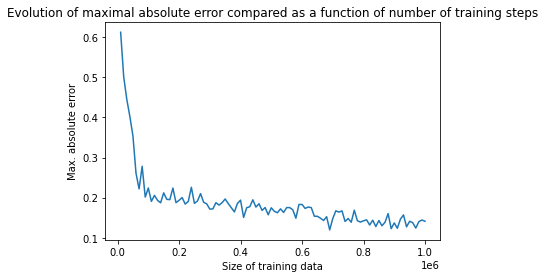

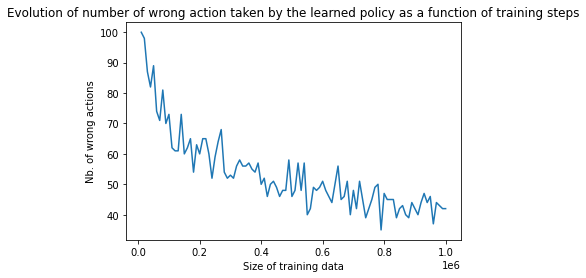


 Wrong actions : 
There are a lot of wrong actions :  42


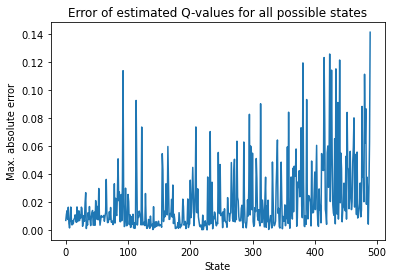


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


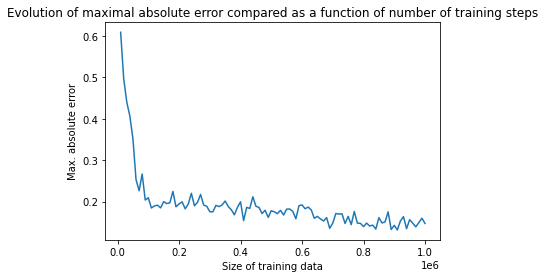

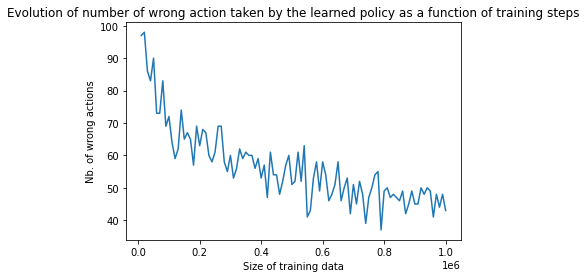


 Wrong actions : 
There are a lot of wrong actions :  43


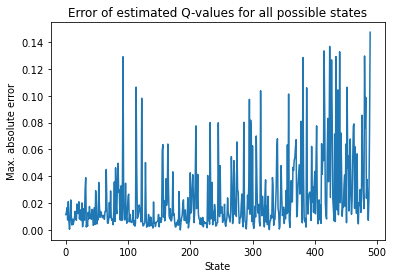

In [28]:
for x in res_MCrand_w2_adaptlr:
    plot_res_multi_QLearning(x,extend_qtableMC(MC2d,true_qval))

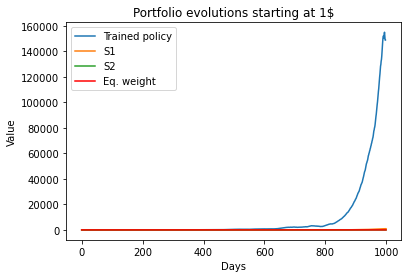

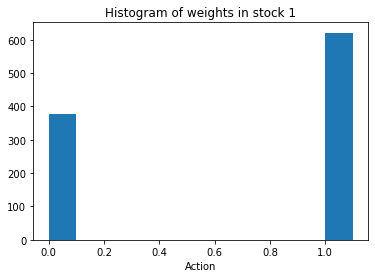

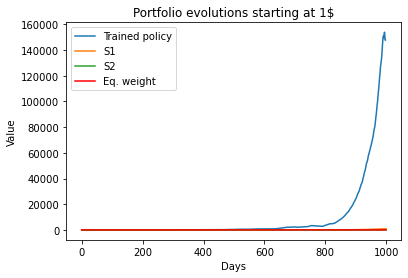

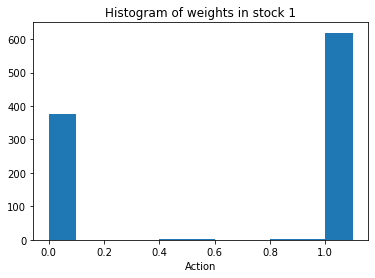

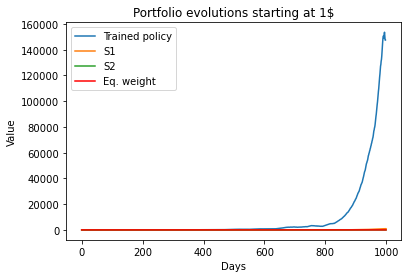

...

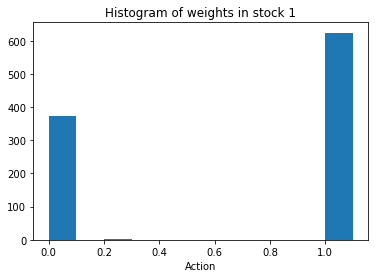

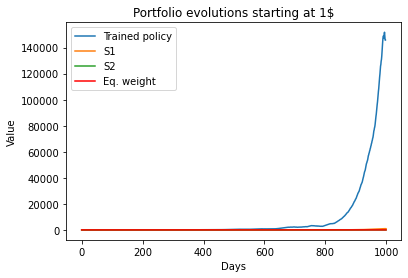

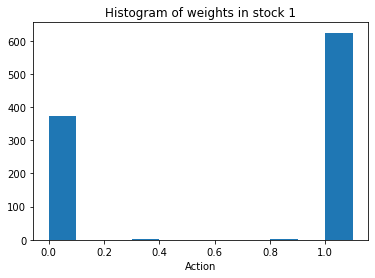

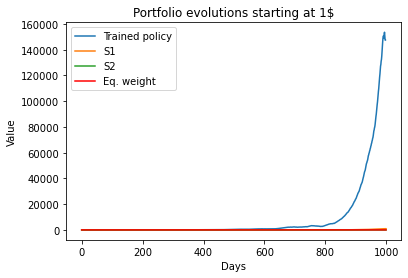

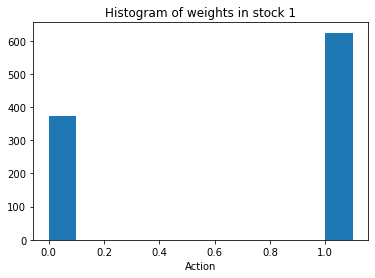

In [39]:
for x in res_MCrand_w2_adaptlr:
    plot_result(x['exploit_test'])

In [40]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [5,1]:
        for tau in [1,0.95,0.9,0.85,0.8,0.75]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtableMC(MC2d,true_qval),adaptive_lr=True)])
            
    res_MCrand_w2_adaptlr = pool.map(multi_train_QLearning, params)



 

Learning rate dependent on states: Decay rate : 5, Beta : 0, Tau : 1


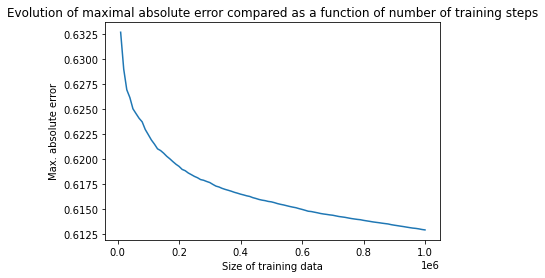

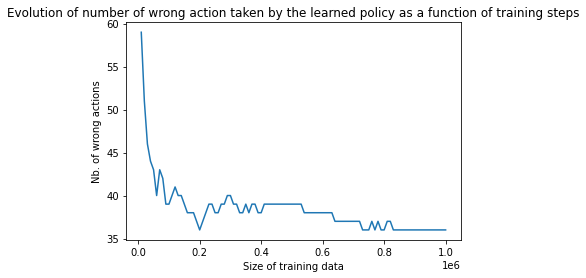


 Wrong actions : 
There are a lot of wrong actions :  36


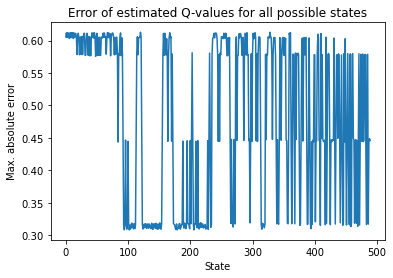


 

Learning rate dependent on states: Decay rate : 5, Beta : 0, Tau : 0.95


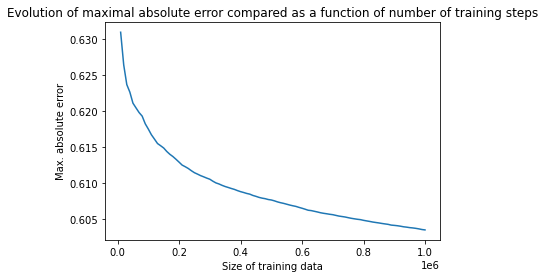

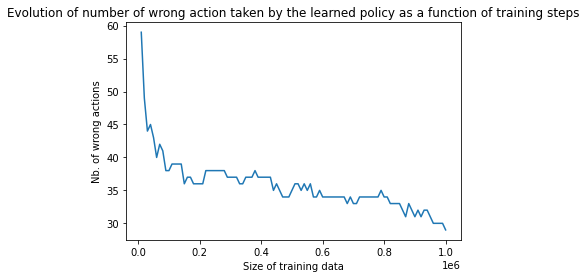


 Wrong actions : 
There are a lot of wrong actions :  29


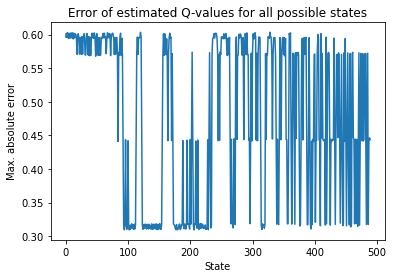


 

Learning rate dependent on states: Decay rate : 5, Beta : 0, Tau : 0.9


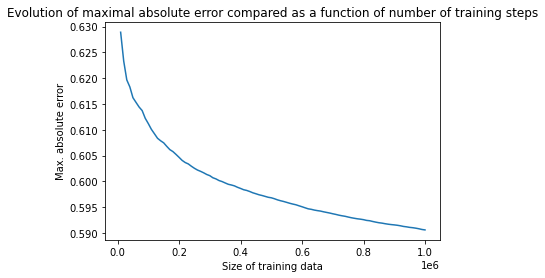

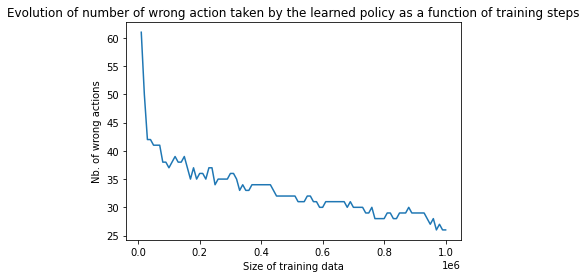


 Wrong actions : 
There are a lot of wrong actions :  26


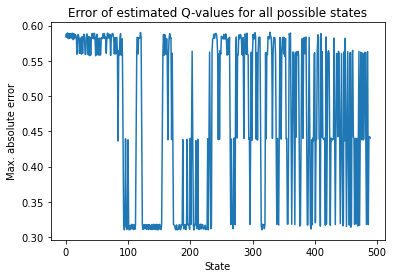


 

Learning rate dependent on states: Decay rate : 5, Beta : 0, Tau : 0.85


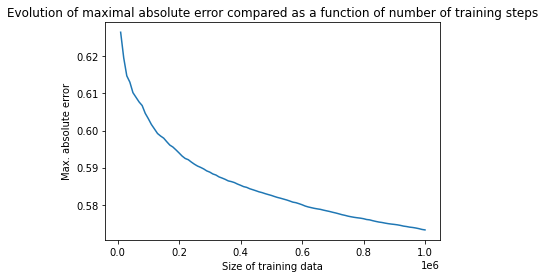

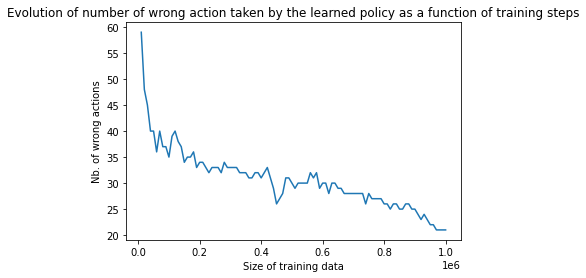


 Wrong actions : 
There are a lot of wrong actions :  21


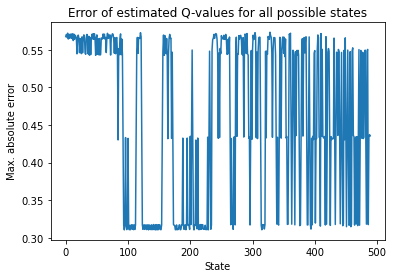


 

Learning rate dependent on states: Decay rate : 5, Beta : 0, Tau : 0.8


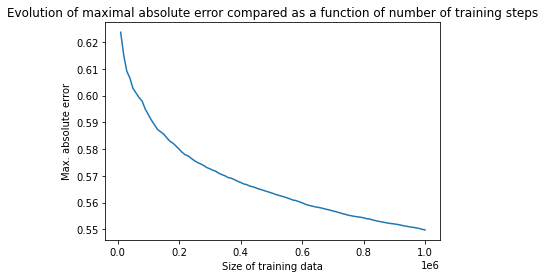

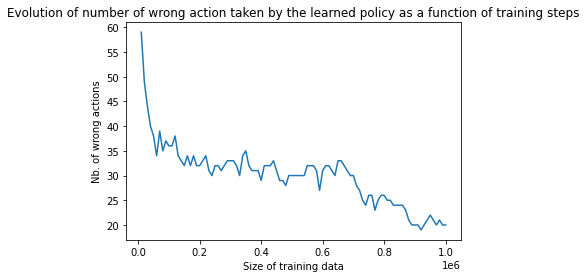


 Wrong actions : 
There are a lot of wrong actions :  20


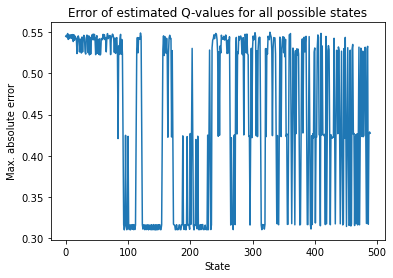


 

Learning rate dependent on states: Decay rate : 5, Beta : 0, Tau : 0.75


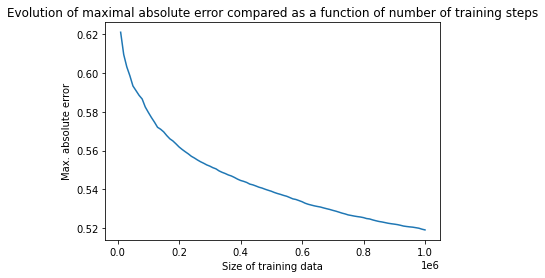

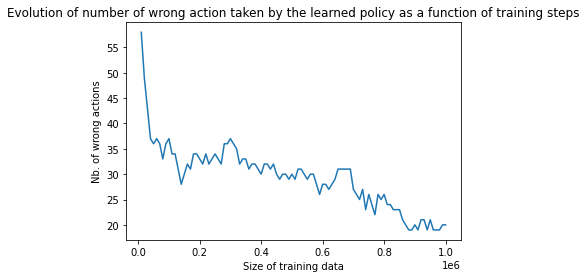


 Wrong actions : 
There are a lot of wrong actions :  20


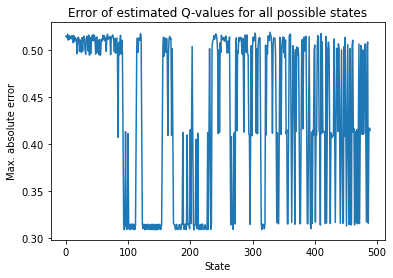


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


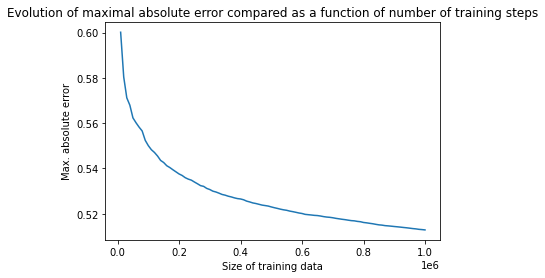

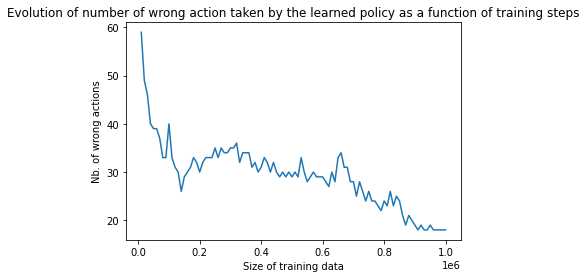


 Wrong actions : 
There are a lot of wrong actions :  18


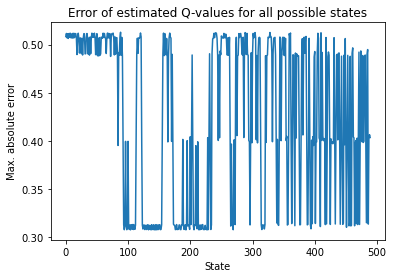


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.95


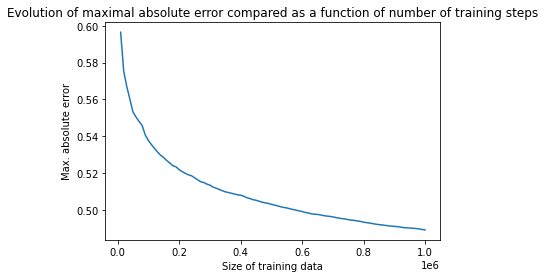

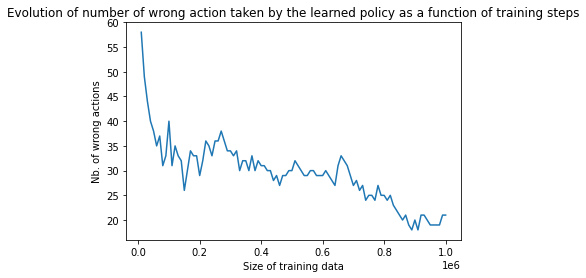


 Wrong actions : 
There are a lot of wrong actions :  21


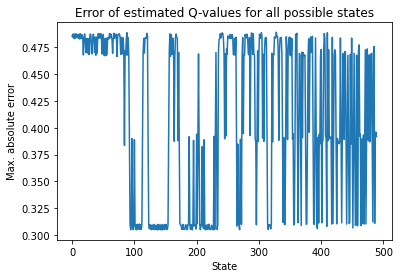


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


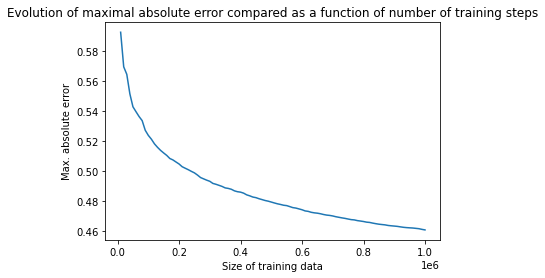

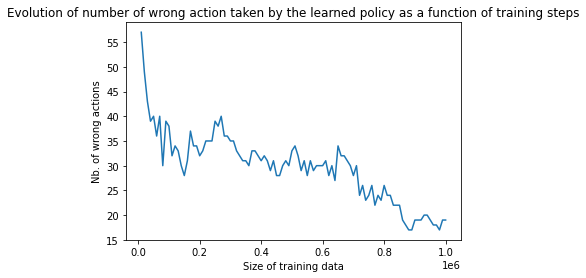


 Wrong actions : 
There are a lot of wrong actions :  19


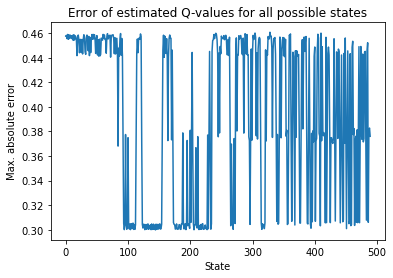


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.85


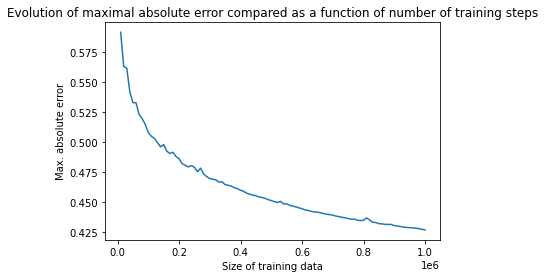

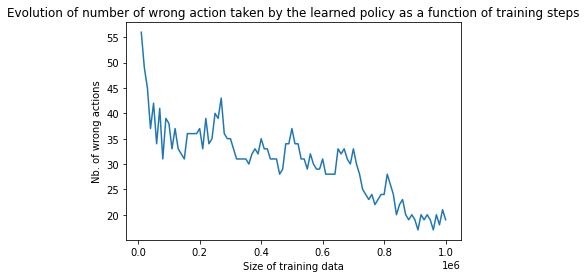


 Wrong actions : 
There are a lot of wrong actions :  19


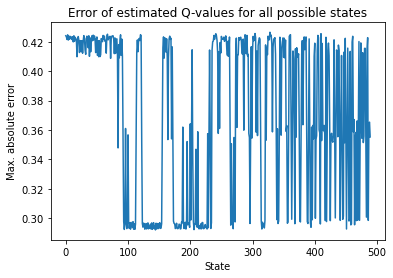


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


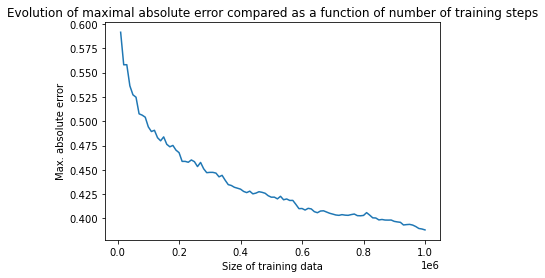

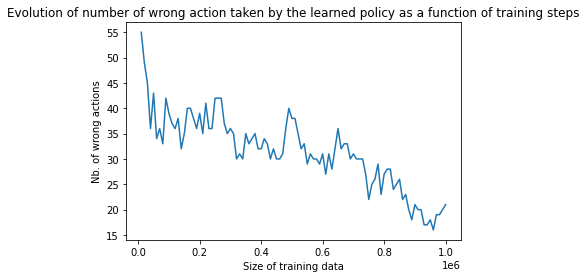


 Wrong actions : 
There are a lot of wrong actions :  21


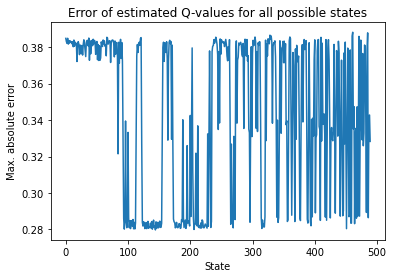


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.75


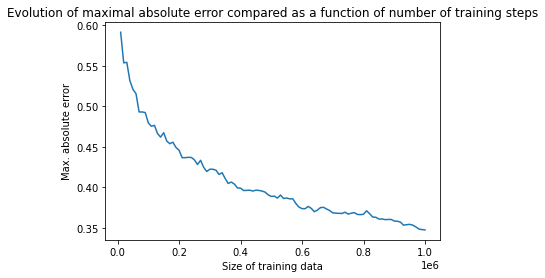

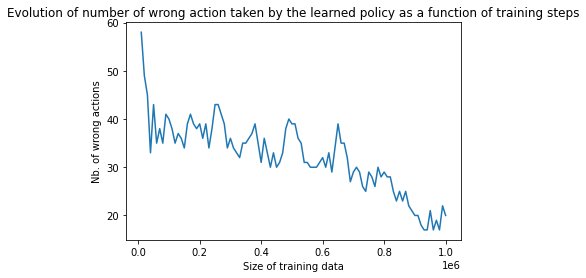


 Wrong actions : 
There are a lot of wrong actions :  20


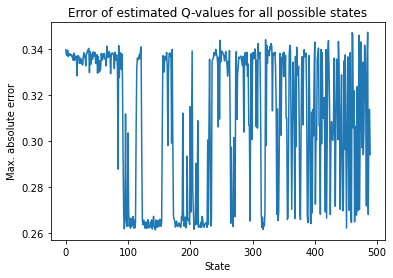

In [41]:
for x in res_MCrand_w2_adaptlr:
    plot_res_multi_QLearning(x,extend_qtableMC(MC2d,true_qval))

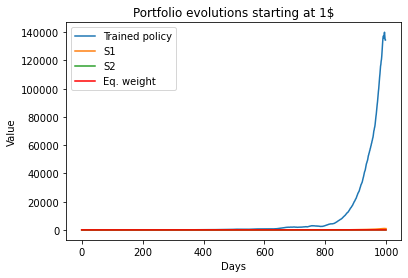

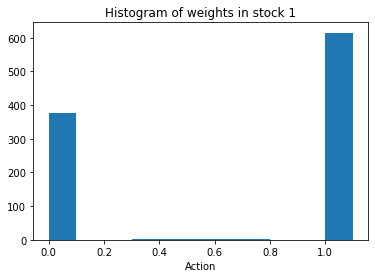

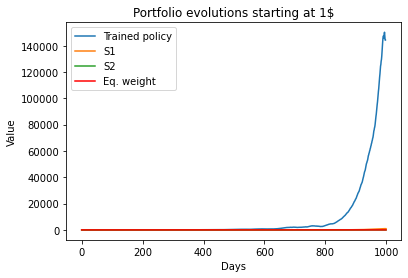

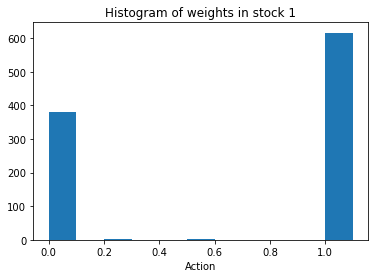

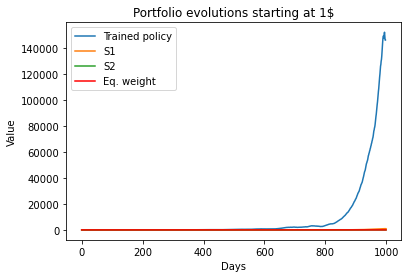

...

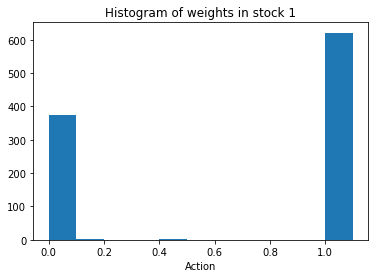

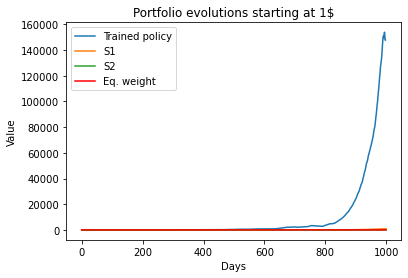

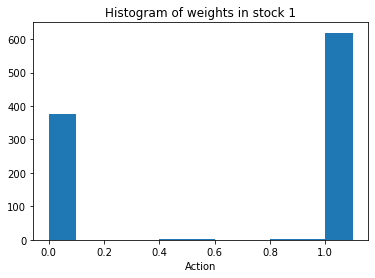

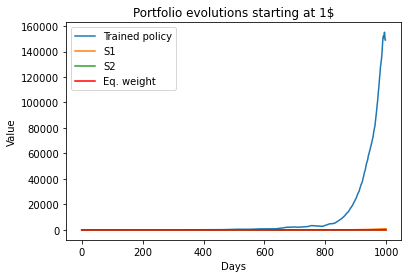

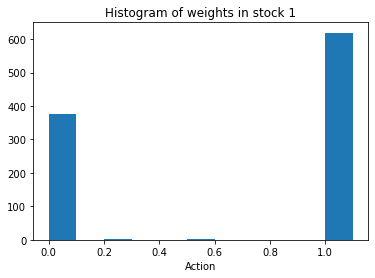

In [42]:
for x in res_MCrand_w2_adaptlr:
    plot_result(x['exploit_test'])

In [29]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [0.001,0.0001]:
        for tau in [1,0.9,0.7]:
            params.extend([create_param_QLearning(pd.DataFrame(training,index=['S1','S2']) ,np.array(testing),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtableMC(MC2d,true_qval))])
            
    res_MCrand_smaller_w2 = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


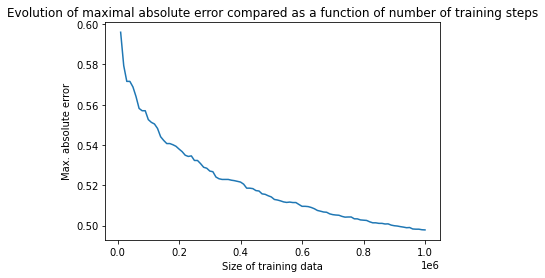

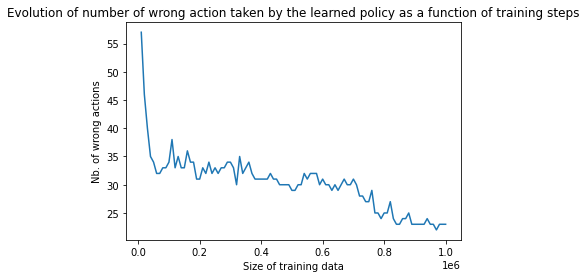


 Wrong actions : 
There are a lot of wrong actions :  23


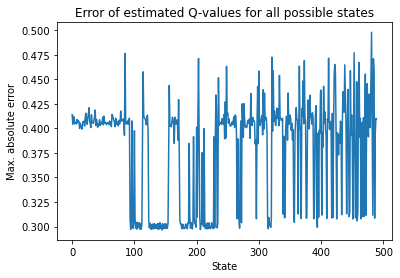


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


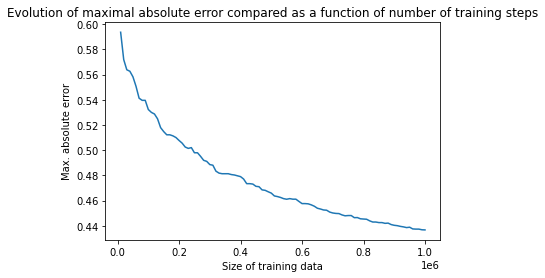

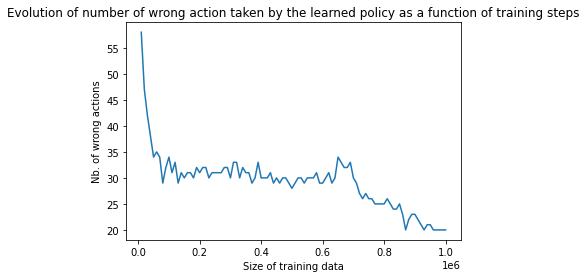


 Wrong actions : 
There are a lot of wrong actions :  20


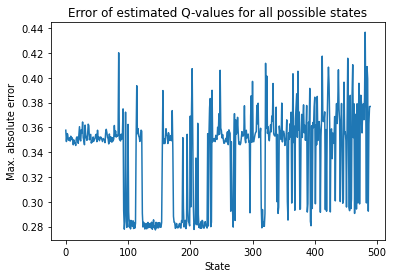


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.7


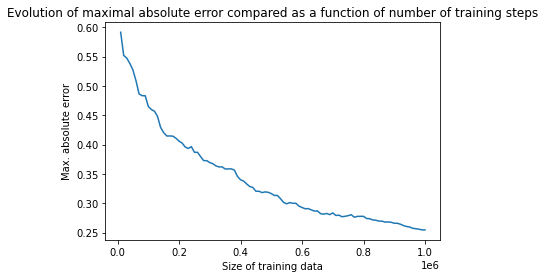

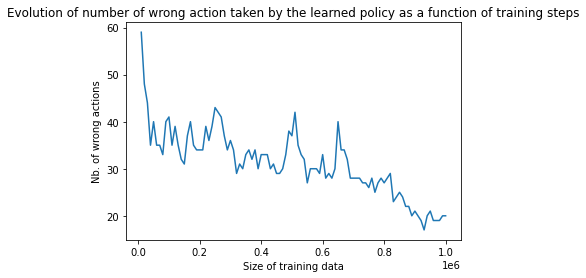


 Wrong actions : 
There are a lot of wrong actions :  20


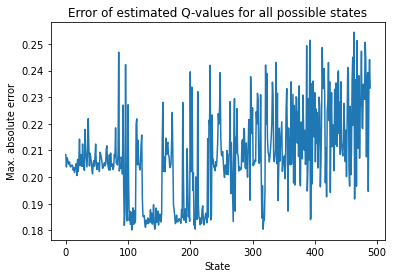


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 1


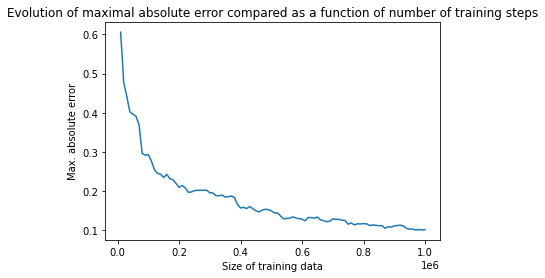

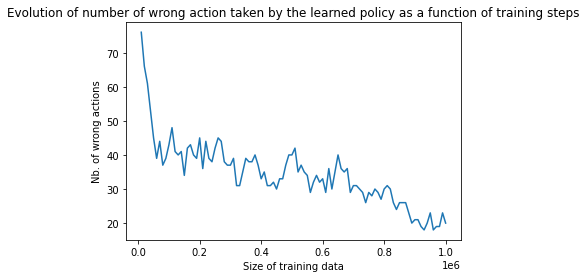


 Wrong actions : 
There are a lot of wrong actions :  20


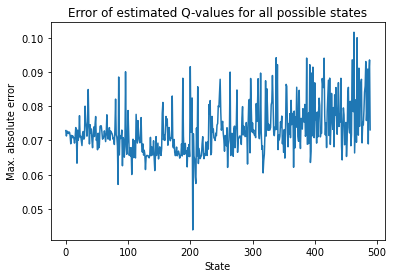


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 0.9


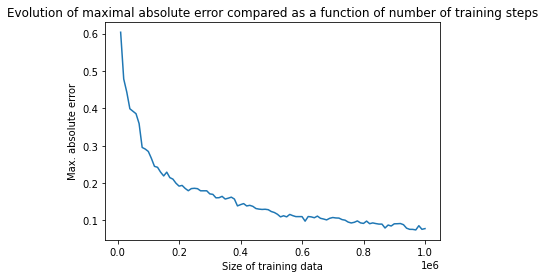

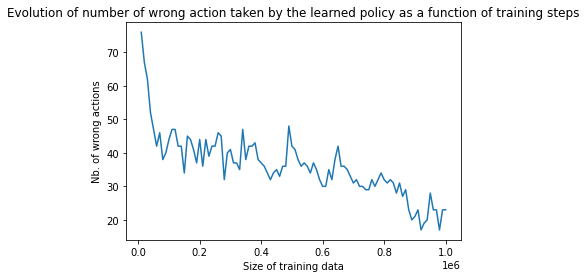


 Wrong actions : 
There are a lot of wrong actions :  23


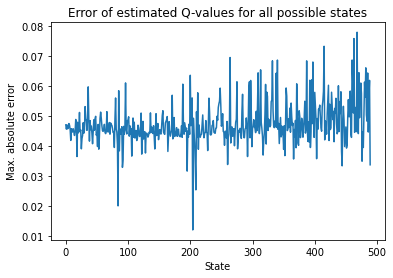


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 0.7


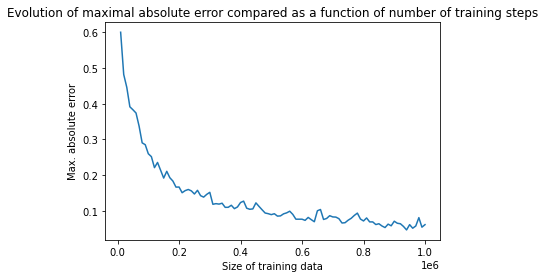

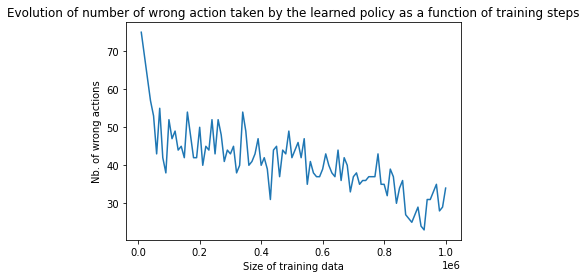


 Wrong actions : 
There are a lot of wrong actions :  34


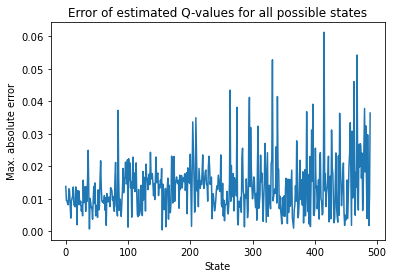

In [30]:
for x in res_MCrand_smaller_w2:
    plot_res_multi_QLearning(x,extend_qtableMC(MC2d,true_qval))

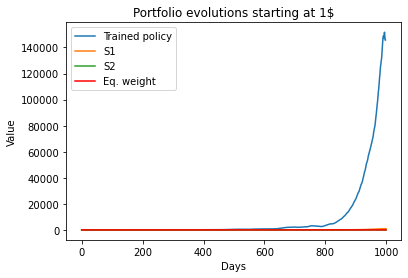

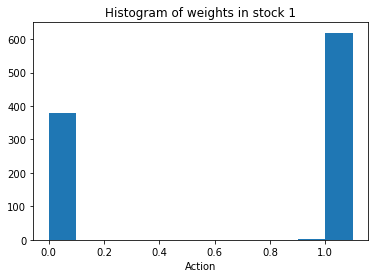

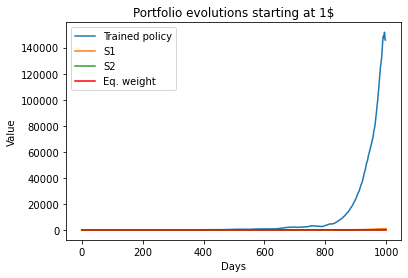

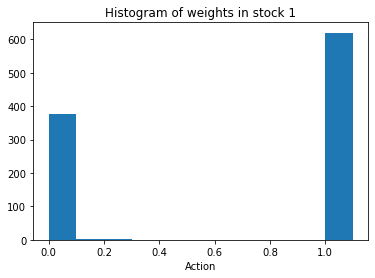

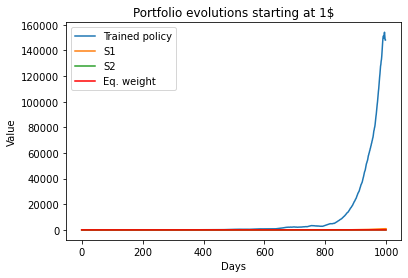

...

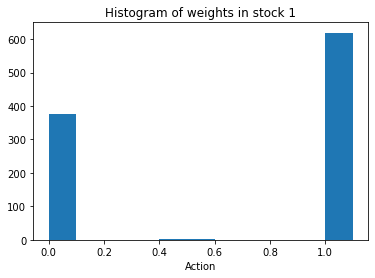

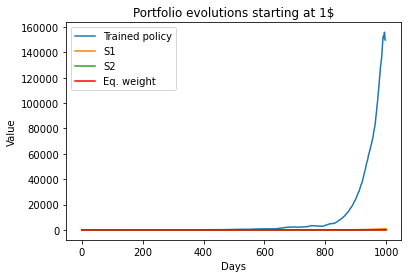

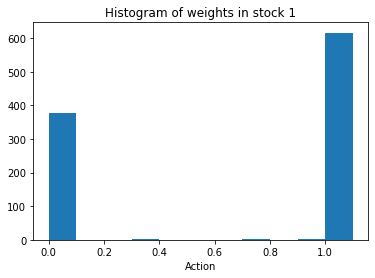

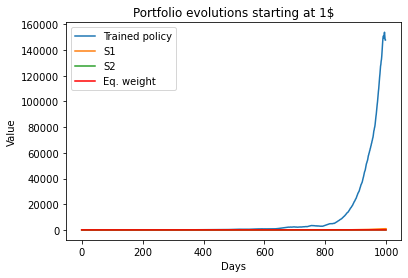

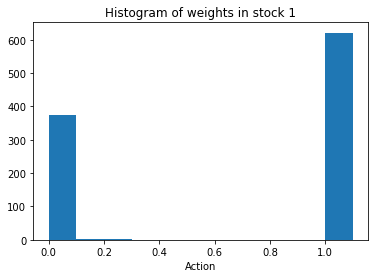

In [38]:
for x in res_MCrand_smaller_w2:
    plot_result(x['exploit_test'])

In [35]:
for k in res_MCrand_smaller_w2[4]['q_val'].keys():
    if np.argmax(res_MCrand_smaller_w2[4]['q_val'][k]) != np.argmax(extend_qtableMC(MC2d,true_qval)[k]):
        print(k, ' Optimal : ',np.argmax(extend_qtableMC(MC2d,true_qval)[k]),' Learned action : ',np.argmax(res_MCrand_smaller_w2[4]['q_val'][k]))

[1.01, 1.0, 1.01, 0.97]  Optimal :  0  Learned action :  3
[0.99, 1.0, 0.99, 0.99]  Optimal :  10  Learned action :  0
[0.99, 1.0, 1.0, 1.03]  Optimal :  10  Learned action :  0
[0.99, 1.0, 1.01, 1.0]  Optimal :  0  Learned action :  10
[0.99, 1.0, 0.98, 1.0]  Optimal :  0  Learned action :  10
[1.01, 1.0, 0.98, 0.98]  Optimal :  10  Learned action :  7
[0.99, 1.0, 0.99, 1.02]  Optimal :  0  Learned action :  10
[1.01, 1.0, 1.0, 0.99]  Optimal :  10  Learned action :  0
[0.99, 1.0, 1.0, 0.97]  Optimal :  0  Learned action :  10
[1.01, 1.0, 1.01, 1.0]  Optimal :  0  Learned action :  10
[0.99, 1.0, 0.99, 1.03]  Optimal :  10  Learned action :  0
[0.99, 1.0, 0.97, 1.0]  Optimal :  0  Learned action :  7
[0.99, 1.0, 1.01, 0.97]  Optimal :  0  Learned action :  7
[1.01, 1.0, 1.0, 0.97]  Optimal :  0  Learned action :  2
[1.01, 1.0, 0.98, 0.99]  Optimal :  10  Learned action :  0
[1.01, 1.0, 0.98, 0.97]  Optimal :  0  Learned action :  10
[1.01, 1.0, 1.02, 1.0]  Optimal :  0  Learned action

# Markov chain delayed by two time steps

Here, we simulate the first stock's returns as a Markov chains with transition matrix $p_{rand}$ and set the second stock's returns as:

$r_{2,t}=r_{1,t+2}, \quad \forall t\geq 0$

Hence, we will only consider a window of length $2$.


In [56]:
w2=2

delay=2
MC_rand_del2=MarkovChain_delayed(delta, p_rand,delay)
np.random.seed(2473205729)
train_del2=pd.DataFrame(MC_rand_del2.simulate(1000000+1),index=['S1','S2'])


In [57]:
Ntest=1000
test_delay2=pd.DataFrame(pd.DataFrame(MC_rand_del2.simulate(Ntest),index=['S1','S2']),index=['S1','S2'])

In [45]:
true_qval_delay2=MC_rand_del2.true_qval(delta=1e-3)

Time needed to converge with delta =  0.001  :  103


In [50]:
for k in true_qval_delay2.keys():
    print(k, ' Optimal action : ',np.argmax(true_qval_delay2[k]))

[0.97, 0.97, 0.97, 0.97]  Optimal action :  0
[0.97, 0.97, 0.97, 0.98]  Optimal action :  0
[0.97, 0.97, 0.97, 0.99]  Optimal action :  0
[0.97, 0.97, 0.97, 1.0]  Optimal action :  0
[0.97, 0.97, 0.97, 1.01]  Optimal action :  0
[0.97, 0.97, 0.97, 1.02]  Optimal action :  0
[0.97, 0.97, 0.97, 1.03]  Optimal action :  0
[0.97, 0.97, 0.98, 0.97]  Optimal action :  0
[0.97, 0.97, 0.98, 0.98]  Optimal action :  0
[0.97, 0.97, 0.98, 0.99]  Optimal action :  0
[0.97, 0.97, 0.98, 1.0]  Optimal action :  0
[0.97, 0.97, 0.98, 1.01]  Optimal action :  0
[0.97, 0.97, 0.98, 1.02]  Optimal action :  0
[0.97, 0.97, 0.98, 1.03]  Optimal action :  0
[0.97, 0.97, 0.99, 0.97]  Optimal action :  0
[0.97, 0.97, 0.99, 0.98]  Optimal action :  0
[0.97, 0.97, 0.99, 0.99]  Optimal action :  0
[0.97, 0.97, 0.99, 1.0]  Optimal action :  0
[0.97, 0.97, 0.99, 1.01]  Optimal action :  0
[0.97, 0.97, 0.99, 1.02]  Optimal action :  0
[0.97, 0.97, 0.99, 1.03]  Optimal action :  0
[0.97, 0.97, 1.0, 0.97]  Optimal acti

[0.97, 1.02, 1.02, 0.98]  Optimal action :  10
[0.97, 1.02, 1.02, 0.99]  Optimal action :  10
[0.97, 1.02, 1.02, 1.0]  Optimal action :  10
[0.97, 1.02, 1.02, 1.01]  Optimal action :  10
[0.97, 1.02, 1.02, 1.02]  Optimal action :  10
[0.97, 1.02, 1.02, 1.03]  Optimal action :  10
[0.97, 1.02, 1.03, 0.97]  Optimal action :  10
[0.97, 1.02, 1.03, 0.98]  Optimal action :  10
[0.97, 1.02, 1.03, 0.99]  Optimal action :  10
[0.97, 1.02, 1.03, 1.0]  Optimal action :  10
[0.97, 1.02, 1.03, 1.01]  Optimal action :  10
[0.97, 1.02, 1.03, 1.02]  Optimal action :  10
[0.97, 1.02, 1.03, 1.03]  Optimal action :  10
[0.97, 1.03, 0.97, 0.97]  Optimal action :  0
[0.97, 1.03, 0.97, 0.98]  Optimal action :  0
[0.97, 1.03, 0.97, 0.99]  Optimal action :  0
[0.97, 1.03, 0.97, 1.0]  Optimal action :  0
[0.97, 1.03, 0.97, 1.01]  Optimal action :  0
[0.97, 1.03, 0.97, 1.02]  Optimal action :  0
[0.97, 1.03, 0.97, 1.03]  Optimal action :  0
[0.97, 1.03, 0.98, 0.97]  Optimal action :  0
[0.97, 1.03, 0.98, 0.98]

[0.98, 0.99, 1.0, 0.99]  Optimal action :  10
[0.98, 0.99, 1.0, 1.0]  Optimal action :  0
[0.98, 0.99, 1.0, 1.01]  Optimal action :  10
[0.98, 0.99, 1.0, 1.02]  Optimal action :  0
[0.98, 0.99, 1.0, 1.03]  Optimal action :  10
[0.98, 0.99, 1.01, 0.97]  Optimal action :  10
[0.98, 0.99, 1.01, 0.98]  Optimal action :  10
[0.98, 0.99, 1.01, 0.99]  Optimal action :  10
[0.98, 0.99, 1.01, 1.0]  Optimal action :  10
[0.98, 0.99, 1.01, 1.01]  Optimal action :  10
[0.98, 0.99, 1.01, 1.02]  Optimal action :  10
[0.98, 0.99, 1.01, 1.03]  Optimal action :  10
[0.98, 0.99, 1.02, 0.97]  Optimal action :  10
[0.98, 0.99, 1.02, 0.98]  Optimal action :  10
[0.98, 0.99, 1.02, 0.99]  Optimal action :  10
[0.98, 0.99, 1.02, 1.0]  Optimal action :  10
[0.98, 0.99, 1.02, 1.01]  Optimal action :  10
[0.98, 0.99, 1.02, 1.02]  Optimal action :  10
[0.98, 0.99, 1.02, 1.03]  Optimal action :  10
[0.98, 0.99, 1.03, 0.97]  Optimal action :  10
[0.98, 0.99, 1.03, 0.98]  Optimal action :  10
[0.98, 0.99, 1.03, 0.99

[0.98, 1.03, 0.98, 1.03]  Optimal action :  0
[0.98, 1.03, 0.99, 0.97]  Optimal action :  0
[0.98, 1.03, 0.99, 0.98]  Optimal action :  0
[0.98, 1.03, 0.99, 0.99]  Optimal action :  0
[0.98, 1.03, 0.99, 1.0]  Optimal action :  0
[0.98, 1.03, 0.99, 1.01]  Optimal action :  0
[0.98, 1.03, 0.99, 1.02]  Optimal action :  0
[0.98, 1.03, 0.99, 1.03]  Optimal action :  0
[0.98, 1.03, 1.0, 0.97]  Optimal action :  0
[0.98, 1.03, 1.0, 0.98]  Optimal action :  10
[0.98, 1.03, 1.0, 0.99]  Optimal action :  10
[0.98, 1.03, 1.0, 1.0]  Optimal action :  0
[0.98, 1.03, 1.0, 1.01]  Optimal action :  10
[0.98, 1.03, 1.0, 1.02]  Optimal action :  0
[0.98, 1.03, 1.0, 1.03]  Optimal action :  10
[0.98, 1.03, 1.01, 0.97]  Optimal action :  10
[0.98, 1.03, 1.01, 0.98]  Optimal action :  10
[0.98, 1.03, 1.01, 0.99]  Optimal action :  10
[0.98, 1.03, 1.01, 1.0]  Optimal action :  10
[0.98, 1.03, 1.01, 1.01]  Optimal action :  10
[0.98, 1.03, 1.01, 1.02]  Optimal action :  10
[0.98, 1.03, 1.01, 1.03]  Optimal 

[0.99, 1.02, 1.02, 0.98]  Optimal action :  10
[0.99, 1.02, 1.02, 0.99]  Optimal action :  10
[0.99, 1.02, 1.02, 1.0]  Optimal action :  10
[0.99, 1.02, 1.02, 1.01]  Optimal action :  10
[0.99, 1.02, 1.02, 1.02]  Optimal action :  10
[0.99, 1.02, 1.02, 1.03]  Optimal action :  10
[0.99, 1.02, 1.03, 0.97]  Optimal action :  10
[0.99, 1.02, 1.03, 0.98]  Optimal action :  10
[0.99, 1.02, 1.03, 0.99]  Optimal action :  10
[0.99, 1.02, 1.03, 1.0]  Optimal action :  10
[0.99, 1.02, 1.03, 1.01]  Optimal action :  10
[0.99, 1.02, 1.03, 1.02]  Optimal action :  10
[0.99, 1.02, 1.03, 1.03]  Optimal action :  10
[0.99, 1.03, 0.97, 0.97]  Optimal action :  0
[0.99, 1.03, 0.97, 0.98]  Optimal action :  0
[0.99, 1.03, 0.97, 0.99]  Optimal action :  0
[0.99, 1.03, 0.97, 1.0]  Optimal action :  0
[0.99, 1.03, 0.97, 1.01]  Optimal action :  0
[0.99, 1.03, 0.97, 1.02]  Optimal action :  0
[0.99, 1.03, 0.97, 1.03]  Optimal action :  0
[0.99, 1.03, 0.98, 0.97]  Optimal action :  0
[0.99, 1.03, 0.98, 0.98]

[1.0, 0.99, 1.01, 1.02]  Optimal action :  10
[1.0, 0.99, 1.01, 1.03]  Optimal action :  10
[1.0, 0.99, 1.02, 0.97]  Optimal action :  10
[1.0, 0.99, 1.02, 0.98]  Optimal action :  10
[1.0, 0.99, 1.02, 0.99]  Optimal action :  10
[1.0, 0.99, 1.02, 1.0]  Optimal action :  10
[1.0, 0.99, 1.02, 1.01]  Optimal action :  10
[1.0, 0.99, 1.02, 1.02]  Optimal action :  10
[1.0, 0.99, 1.02, 1.03]  Optimal action :  10
[1.0, 0.99, 1.03, 0.97]  Optimal action :  10
[1.0, 0.99, 1.03, 0.98]  Optimal action :  10
[1.0, 0.99, 1.03, 0.99]  Optimal action :  10
[1.0, 0.99, 1.03, 1.0]  Optimal action :  10
[1.0, 0.99, 1.03, 1.01]  Optimal action :  10
[1.0, 0.99, 1.03, 1.02]  Optimal action :  10
[1.0, 0.99, 1.03, 1.03]  Optimal action :  10
[1.0, 1.0, 0.97, 0.97]  Optimal action :  0
[1.0, 1.0, 0.97, 0.98]  Optimal action :  0
[1.0, 1.0, 0.97, 0.99]  Optimal action :  0
[1.0, 1.0, 0.97, 1.0]  Optimal action :  0
[1.0, 1.0, 0.97, 1.01]  Optimal action :  0
[1.0, 1.0, 0.97, 1.02]  Optimal action :  0
[1.

[1.01, 0.97, 1.02, 1.0]  Optimal action :  10
[1.01, 0.97, 1.02, 1.01]  Optimal action :  10
[1.01, 0.97, 1.02, 1.02]  Optimal action :  10
[1.01, 0.97, 1.02, 1.03]  Optimal action :  10
[1.01, 0.97, 1.03, 0.97]  Optimal action :  10
[1.01, 0.97, 1.03, 0.98]  Optimal action :  10
[1.01, 0.97, 1.03, 0.99]  Optimal action :  10
[1.01, 0.97, 1.03, 1.0]  Optimal action :  10
[1.01, 0.97, 1.03, 1.01]  Optimal action :  10
[1.01, 0.97, 1.03, 1.02]  Optimal action :  10
[1.01, 0.97, 1.03, 1.03]  Optimal action :  10
[1.01, 0.98, 0.97, 0.97]  Optimal action :  0
[1.01, 0.98, 0.97, 0.98]  Optimal action :  0
[1.01, 0.98, 0.97, 0.99]  Optimal action :  0
[1.01, 0.98, 0.97, 1.0]  Optimal action :  0
[1.01, 0.98, 0.97, 1.01]  Optimal action :  0
[1.01, 0.98, 0.97, 1.02]  Optimal action :  0
[1.01, 0.98, 0.97, 1.03]  Optimal action :  0
[1.01, 0.98, 0.98, 0.97]  Optimal action :  0
[1.01, 0.98, 0.98, 0.98]  Optimal action :  0
[1.01, 0.98, 0.98, 0.99]  Optimal action :  0
[1.01, 0.98, 0.98, 1.0]  O

[1.01, 1.03, 1.02, 1.0]  Optimal action :  10
[1.01, 1.03, 1.02, 1.01]  Optimal action :  10
[1.01, 1.03, 1.02, 1.02]  Optimal action :  10
[1.01, 1.03, 1.02, 1.03]  Optimal action :  10
[1.01, 1.03, 1.03, 0.97]  Optimal action :  10
[1.01, 1.03, 1.03, 0.98]  Optimal action :  10
[1.01, 1.03, 1.03, 0.99]  Optimal action :  10
[1.01, 1.03, 1.03, 1.0]  Optimal action :  10
[1.01, 1.03, 1.03, 1.01]  Optimal action :  10
[1.01, 1.03, 1.03, 1.02]  Optimal action :  10
[1.01, 1.03, 1.03, 1.03]  Optimal action :  10
[1.02, 0.97, 0.97, 0.97]  Optimal action :  0
[1.02, 0.97, 0.97, 0.98]  Optimal action :  0
[1.02, 0.97, 0.97, 0.99]  Optimal action :  0
[1.02, 0.97, 0.97, 1.0]  Optimal action :  0
[1.02, 0.97, 0.97, 1.01]  Optimal action :  0
[1.02, 0.97, 0.97, 1.02]  Optimal action :  0
[1.02, 0.97, 0.97, 1.03]  Optimal action :  0
[1.02, 0.97, 0.98, 0.97]  Optimal action :  0
[1.02, 0.97, 0.98, 0.98]  Optimal action :  0
[1.02, 0.97, 0.98, 0.99]  Optimal action :  0
[1.02, 0.97, 0.98, 1.0]  O

[1.02, 1.0, 1.0, 0.99]  Optimal action :  10
[1.02, 1.0, 1.0, 1.0]  Optimal action :  0
[1.02, 1.0, 1.0, 1.01]  Optimal action :  10
[1.02, 1.0, 1.0, 1.02]  Optimal action :  0
[1.02, 1.0, 1.0, 1.03]  Optimal action :  10
[1.02, 1.0, 1.01, 0.97]  Optimal action :  10
[1.02, 1.0, 1.01, 0.98]  Optimal action :  10
[1.02, 1.0, 1.01, 0.99]  Optimal action :  10
[1.02, 1.0, 1.01, 1.0]  Optimal action :  10
[1.02, 1.0, 1.01, 1.01]  Optimal action :  10
[1.02, 1.0, 1.01, 1.02]  Optimal action :  10
[1.02, 1.0, 1.01, 1.03]  Optimal action :  10
[1.02, 1.0, 1.02, 0.97]  Optimal action :  10
[1.02, 1.0, 1.02, 0.98]  Optimal action :  10
[1.02, 1.0, 1.02, 0.99]  Optimal action :  10
[1.02, 1.0, 1.02, 1.0]  Optimal action :  10
[1.02, 1.0, 1.02, 1.01]  Optimal action :  10
[1.02, 1.0, 1.02, 1.02]  Optimal action :  10
[1.02, 1.0, 1.02, 1.03]  Optimal action :  10
[1.02, 1.0, 1.03, 0.97]  Optimal action :  10
[1.02, 1.0, 1.03, 0.98]  Optimal action :  10
[1.02, 1.0, 1.03, 0.99]  Optimal action :  1

[1.03, 0.98, 0.97, 1.03]  Optimal action :  0
[1.03, 0.98, 0.98, 0.97]  Optimal action :  0
[1.03, 0.98, 0.98, 0.98]  Optimal action :  0
[1.03, 0.98, 0.98, 0.99]  Optimal action :  0
[1.03, 0.98, 0.98, 1.0]  Optimal action :  0
[1.03, 0.98, 0.98, 1.01]  Optimal action :  0
[1.03, 0.98, 0.98, 1.02]  Optimal action :  0
[1.03, 0.98, 0.98, 1.03]  Optimal action :  0
[1.03, 0.98, 0.99, 0.97]  Optimal action :  0
[1.03, 0.98, 0.99, 0.98]  Optimal action :  0
[1.03, 0.98, 0.99, 0.99]  Optimal action :  0
[1.03, 0.98, 0.99, 1.0]  Optimal action :  0
[1.03, 0.98, 0.99, 1.01]  Optimal action :  0
[1.03, 0.98, 0.99, 1.02]  Optimal action :  0
[1.03, 0.98, 0.99, 1.03]  Optimal action :  0
[1.03, 0.98, 1.0, 0.97]  Optimal action :  0
[1.03, 0.98, 1.0, 0.98]  Optimal action :  10
[1.03, 0.98, 1.0, 0.99]  Optimal action :  10
[1.03, 0.98, 1.0, 1.0]  Optimal action :  0
[1.03, 0.98, 1.0, 1.01]  Optimal action :  10
[1.03, 0.98, 1.0, 1.02]  Optimal action :  0
[1.03, 0.98, 1.0, 1.03]  Optimal action 

[1.03, 1.01, 1.02, 1.02]  Optimal action :  10
[1.03, 1.01, 1.02, 1.03]  Optimal action :  10
[1.03, 1.01, 1.03, 0.97]  Optimal action :  10
[1.03, 1.01, 1.03, 0.98]  Optimal action :  10
[1.03, 1.01, 1.03, 0.99]  Optimal action :  10
[1.03, 1.01, 1.03, 1.0]  Optimal action :  10
[1.03, 1.01, 1.03, 1.01]  Optimal action :  10
[1.03, 1.01, 1.03, 1.02]  Optimal action :  10
[1.03, 1.01, 1.03, 1.03]  Optimal action :  10
[1.03, 1.02, 0.97, 0.97]  Optimal action :  0
[1.03, 1.02, 0.97, 0.98]  Optimal action :  0
[1.03, 1.02, 0.97, 0.99]  Optimal action :  0
[1.03, 1.02, 0.97, 1.0]  Optimal action :  0
[1.03, 1.02, 0.97, 1.01]  Optimal action :  0
[1.03, 1.02, 0.97, 1.02]  Optimal action :  0
[1.03, 1.02, 0.97, 1.03]  Optimal action :  0
[1.03, 1.02, 0.98, 0.97]  Optimal action :  0
[1.03, 1.02, 0.98, 0.98]  Optimal action :  0
[1.03, 1.02, 0.98, 0.99]  Optimal action :  0
[1.03, 1.02, 0.98, 1.0]  Optimal action :  0
[1.03, 1.02, 0.98, 1.01]  Optimal action :  0
[1.03, 1.02, 0.98, 1.02]  Op

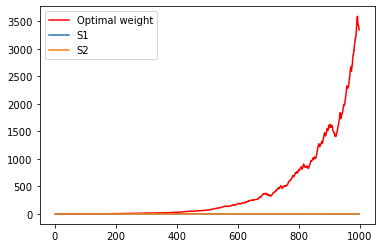

In [58]:
w_opt_delay2=exploit_optimal(true_qval_delay2, test_delay2,window=2)
ret_opt_delay2 = np.sum(w_opt_delay2 * test_delay2.iloc[:, 2:], axis=0)
plt.plot(np.cumprod(ret_opt_delay2),'red')
plt.plot(np.cumprod(test_delay2.iloc[0,1:]))
plt.plot(np.cumprod(test_delay2.iloc[1,:]))
plt.legend(['Optimal weight', 'S1','S2'])
plt.show()

In [59]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(train_del2, np.array(test_delay2),  window=2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_delay2)])
            
    jobs = pool.map(multi_train_QLearning, params)


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


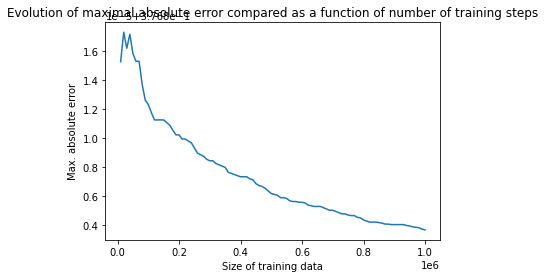

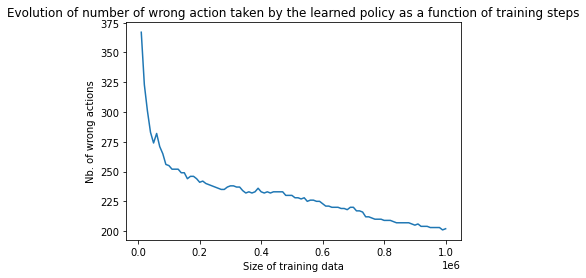


 Wrong actions : 
There are a lot of wrong actions :  202


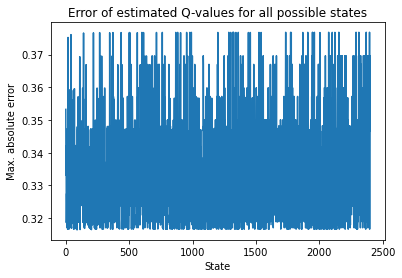


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


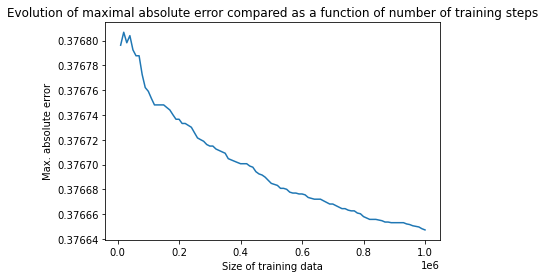

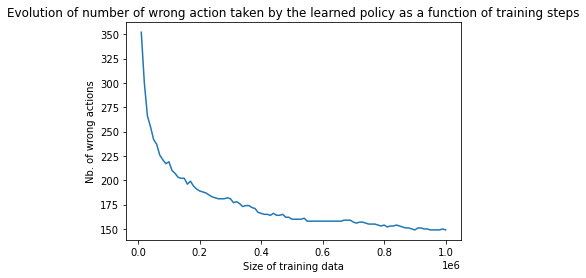


 Wrong actions : 
There are a lot of wrong actions :  149


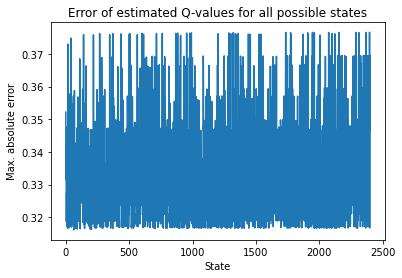


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


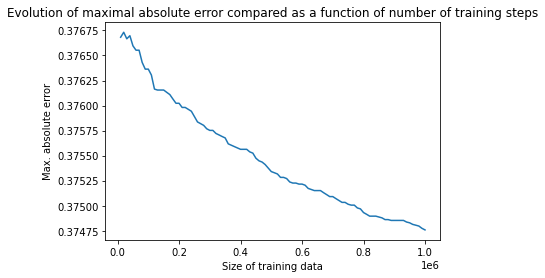

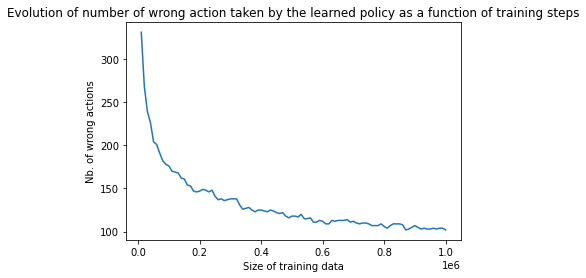


 Wrong actions : 
There are a lot of wrong actions :  102


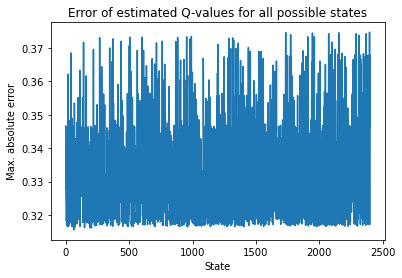


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


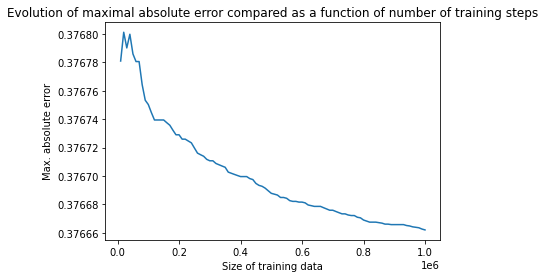

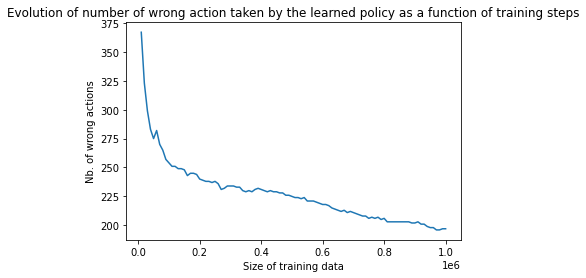


 Wrong actions : 
There are a lot of wrong actions :  197


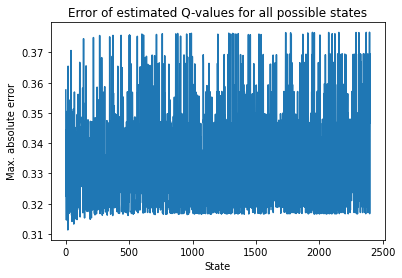


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


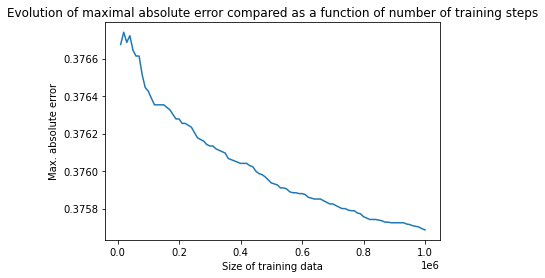

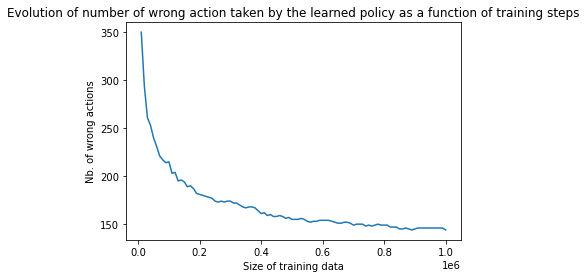


 Wrong actions : 
There are a lot of wrong actions :  144


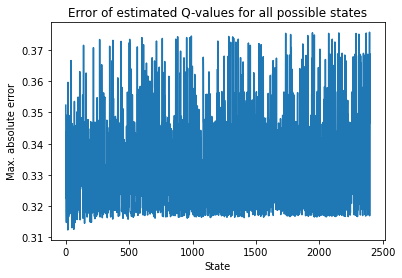


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


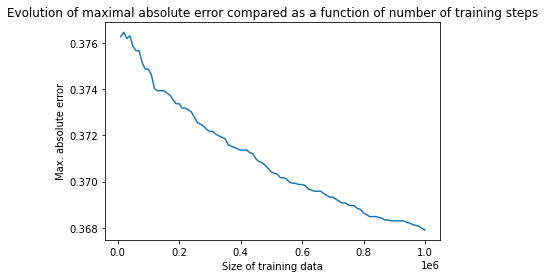

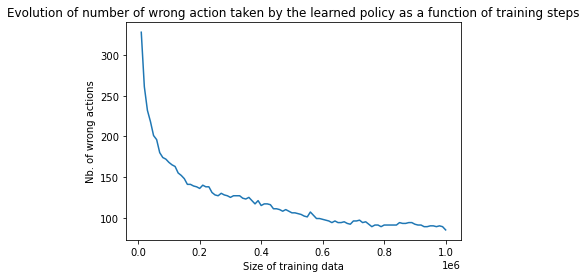


 Wrong actions : 
There are a lot of wrong actions :  85


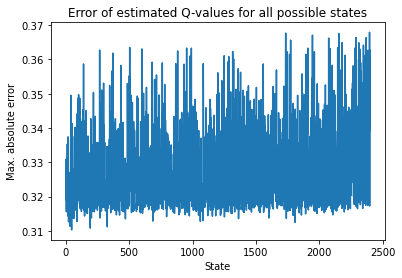


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


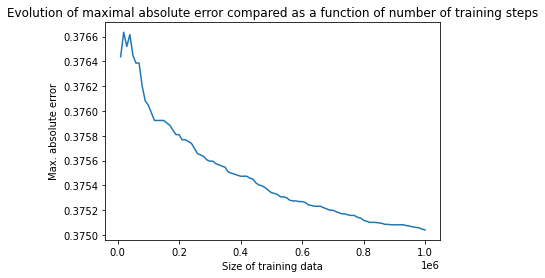

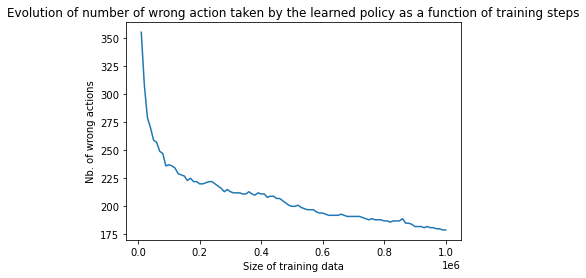


 Wrong actions : 
There are a lot of wrong actions :  179


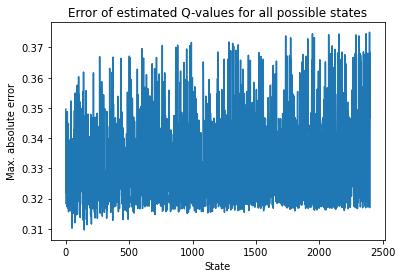


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


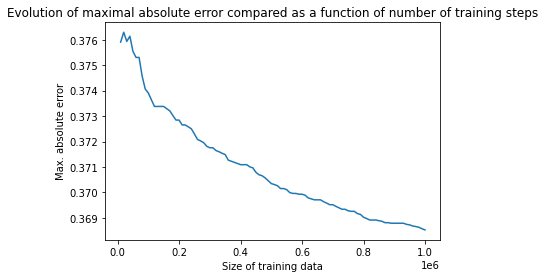

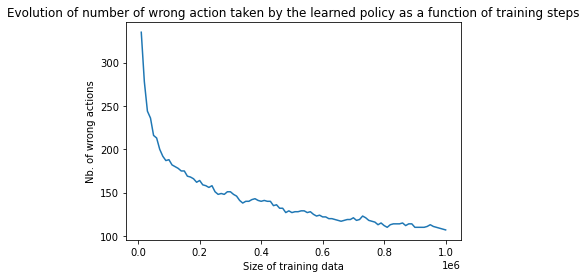


 Wrong actions : 
There are a lot of wrong actions :  107


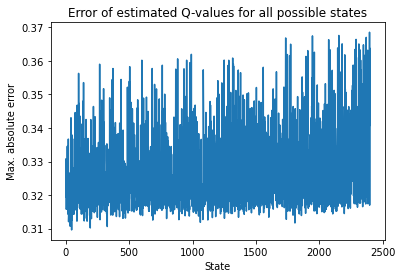


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


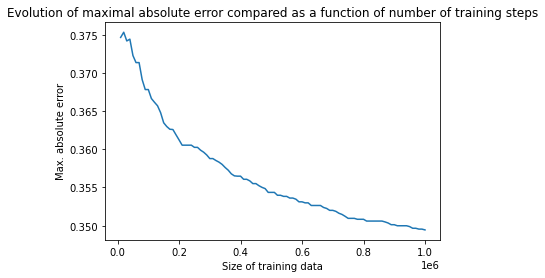

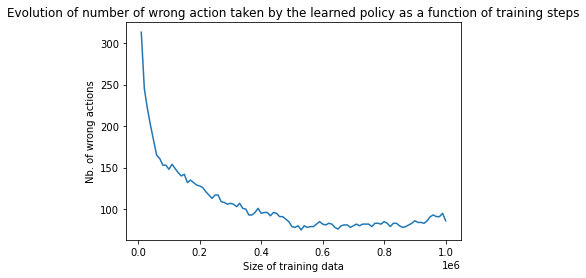


 Wrong actions : 
There are a lot of wrong actions :  86


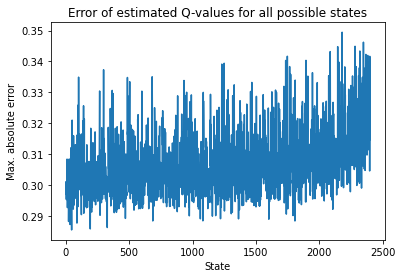


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


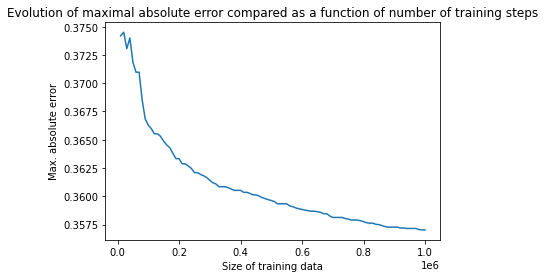

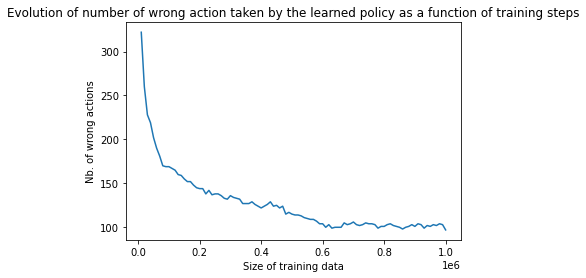


 Wrong actions : 
There are a lot of wrong actions :  97


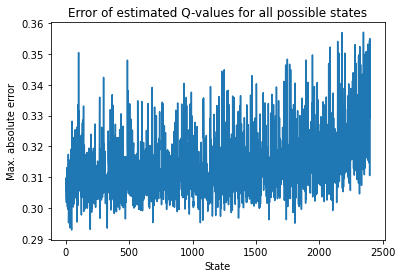


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


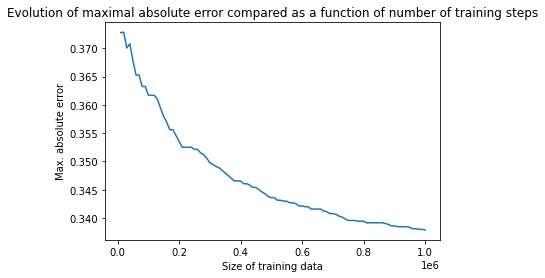

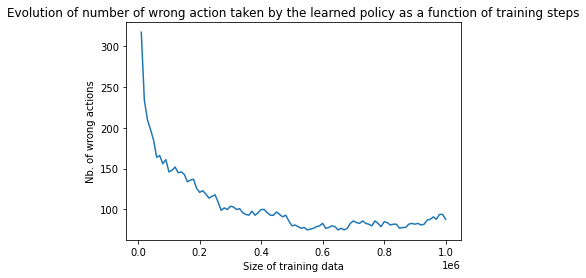


 Wrong actions : 
There are a lot of wrong actions :  88


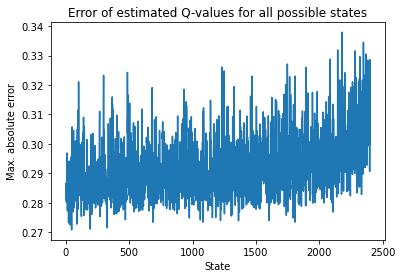


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


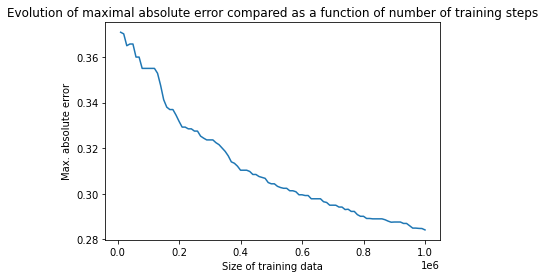

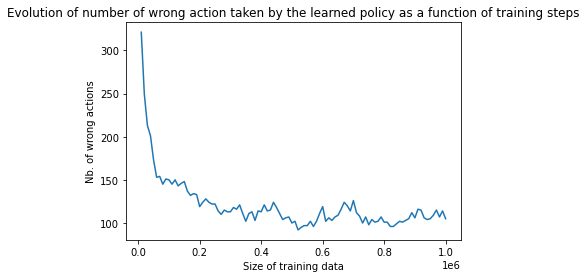


 Wrong actions : 
There are a lot of wrong actions :  105


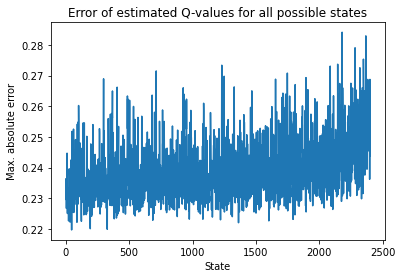

In [60]:
for x in jobs:
    plot_res_multi_QLearning(x,true_qval_delay2)

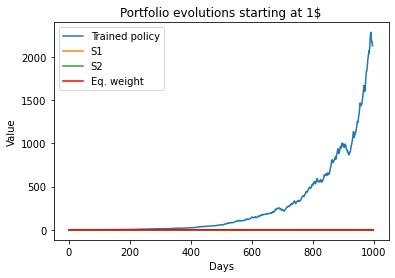

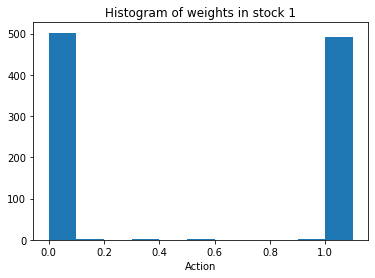

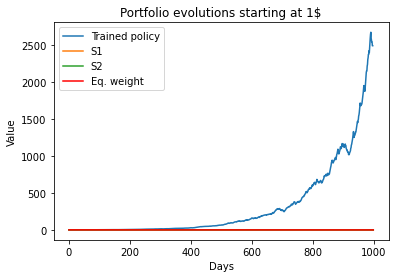

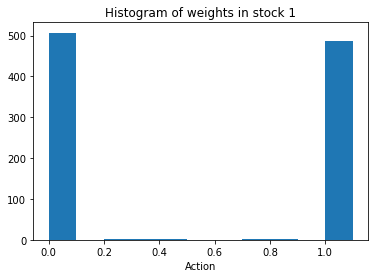

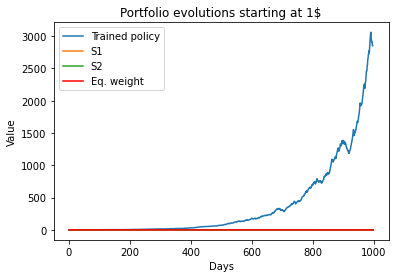

...

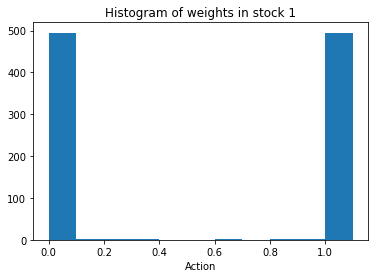

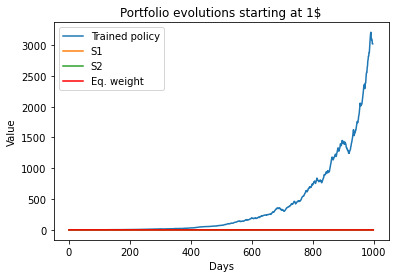

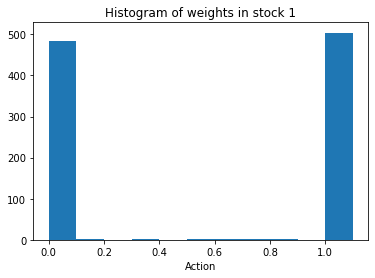

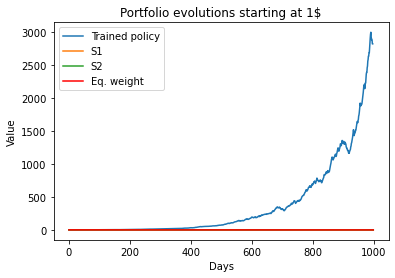

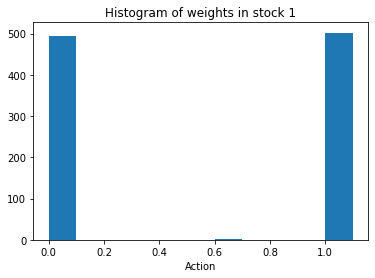

In [75]:
for x in jobs:
    plot_result(x['exploit_test'])

In [61]:

PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [100,10,1,0.1]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(train_del2, np.array(test_delay2),  window=2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_delay2,adaptive_lr=True)])
            
    jobs_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 100, Beta : 0, Tau : 1


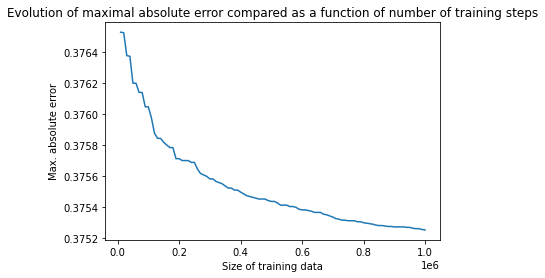

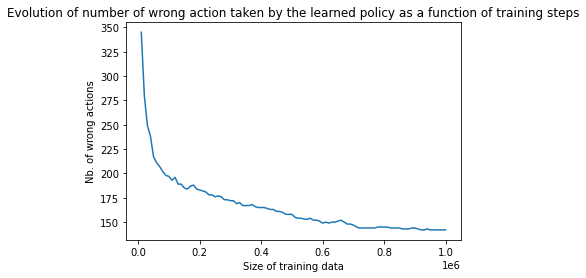


 Wrong actions : 
There are a lot of wrong actions :  142


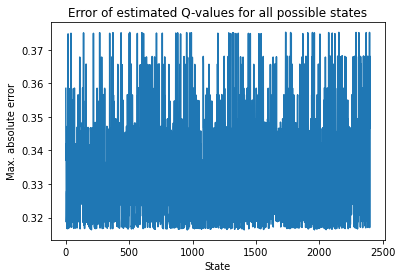


 

Learning rate dependent on states: Decay rate : 100, Beta : 0, Tau : 0.8


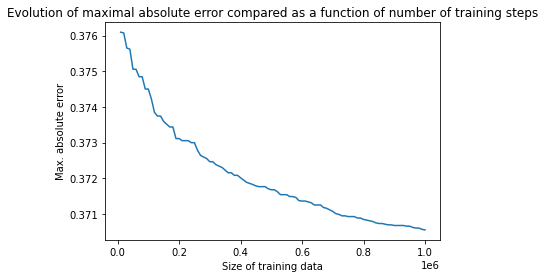

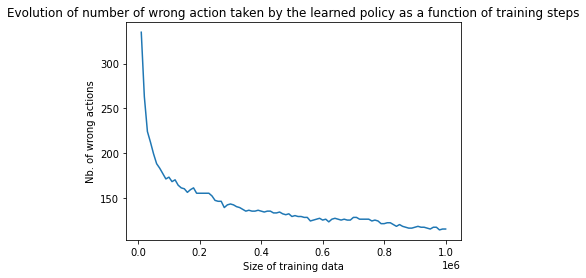


 Wrong actions : 
There are a lot of wrong actions :  115


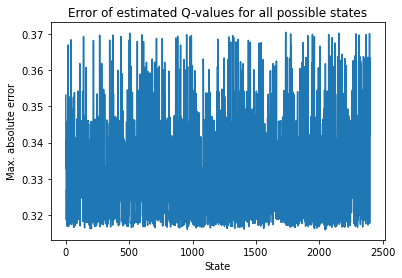


 

Learning rate dependent on states: Decay rate : 100, Beta : 0, Tau : 0.6


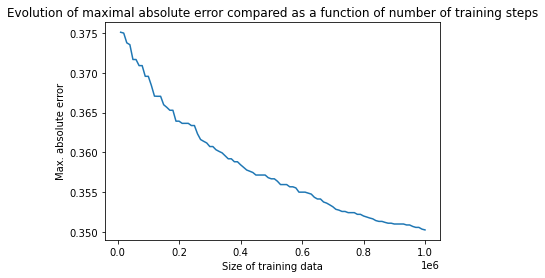

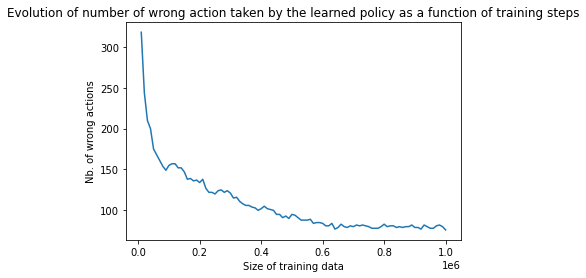


 Wrong actions : 
There are a lot of wrong actions :  76


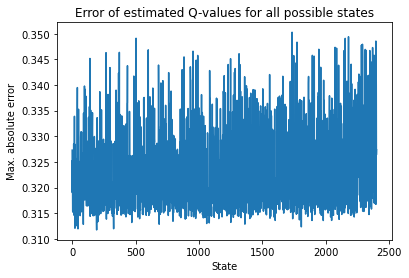


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 1


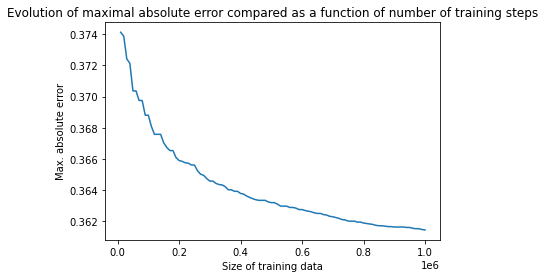

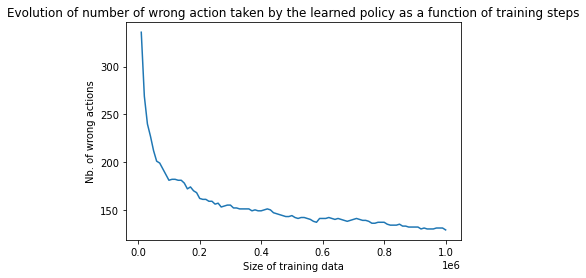


 Wrong actions : 
There are a lot of wrong actions :  129


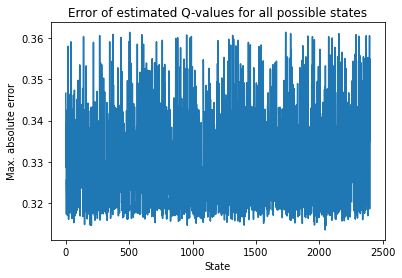


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.8


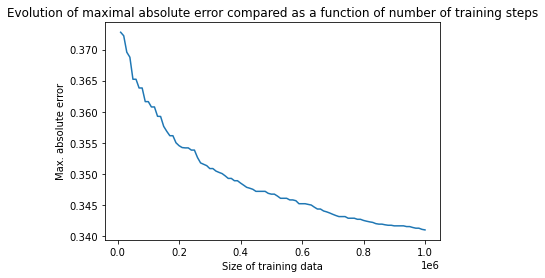

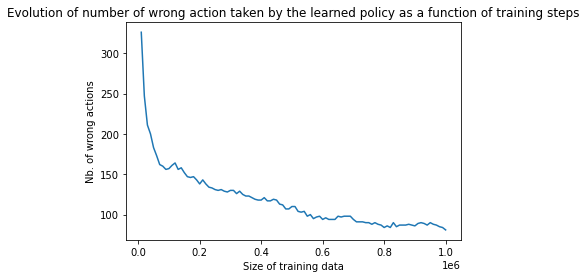


 Wrong actions : 
There are a lot of wrong actions :  81


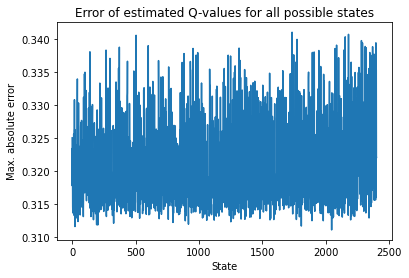


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.6


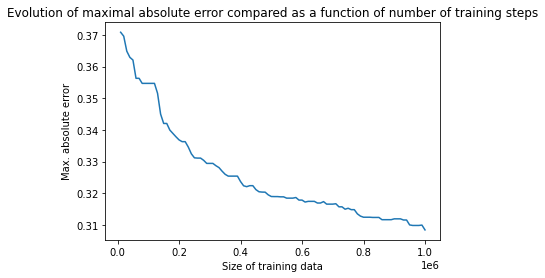

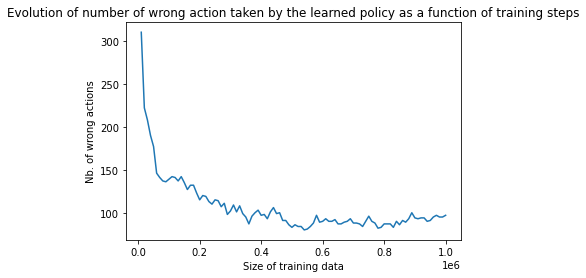


 Wrong actions : 
There are a lot of wrong actions :  97


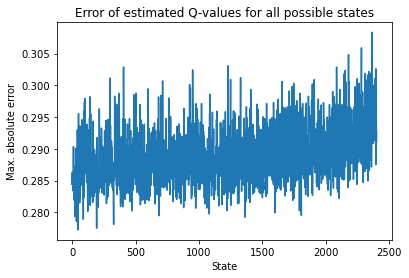


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


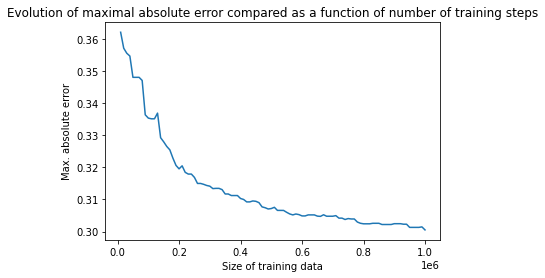

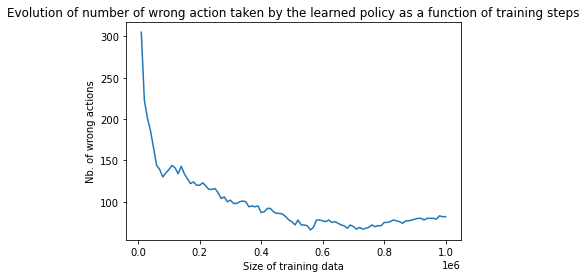


 Wrong actions : 
There are a lot of wrong actions :  82


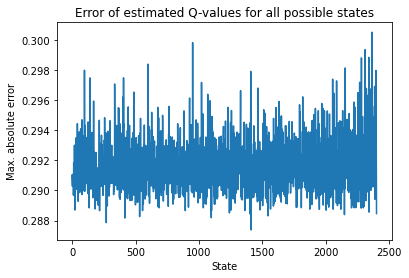


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


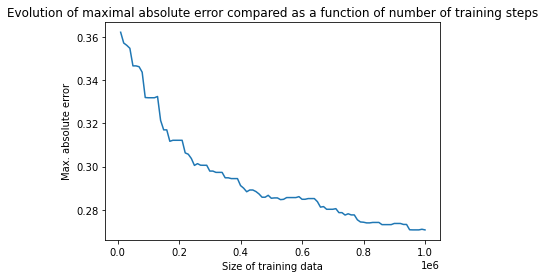

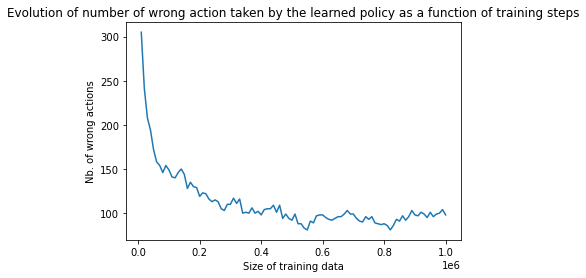


 Wrong actions : 
There are a lot of wrong actions :  98


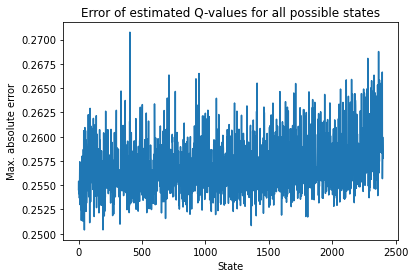


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


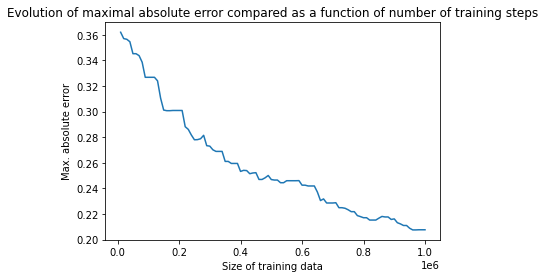

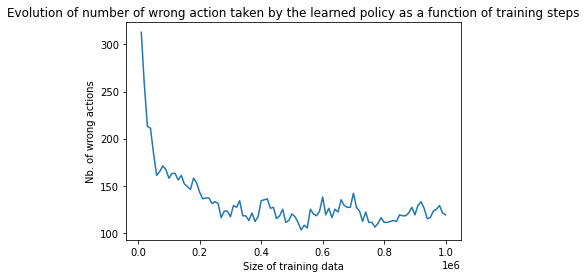


 Wrong actions : 
There are a lot of wrong actions :  119


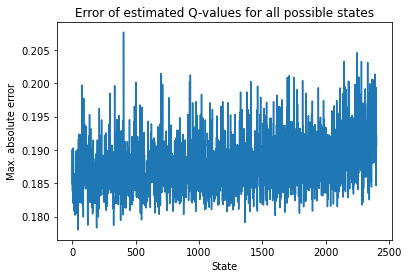


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


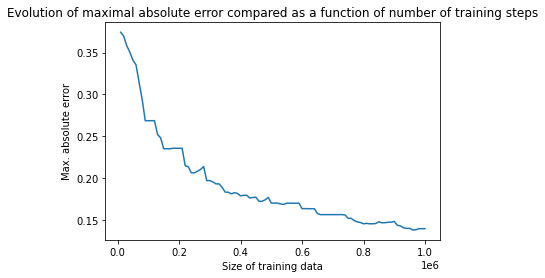

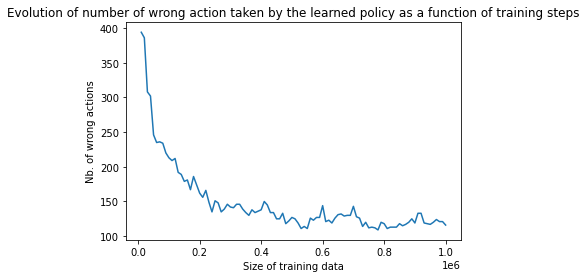


 Wrong actions : 
There are a lot of wrong actions :  116


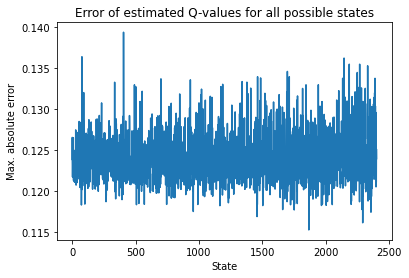


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


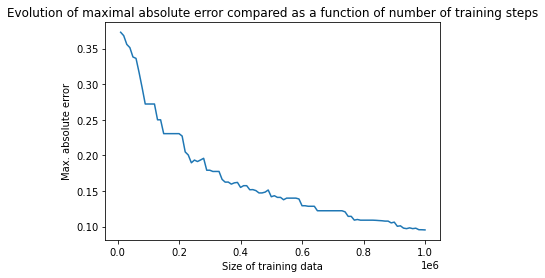

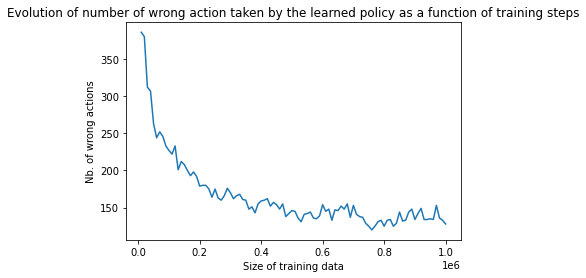


 Wrong actions : 
There are a lot of wrong actions :  128


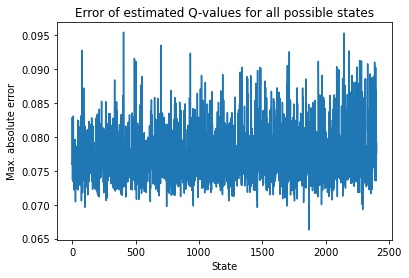


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


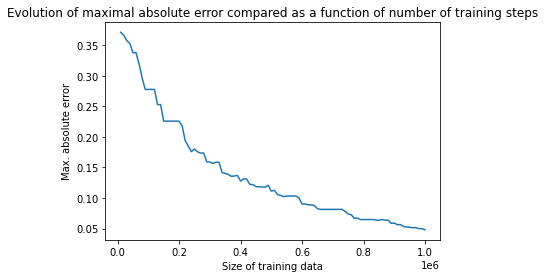

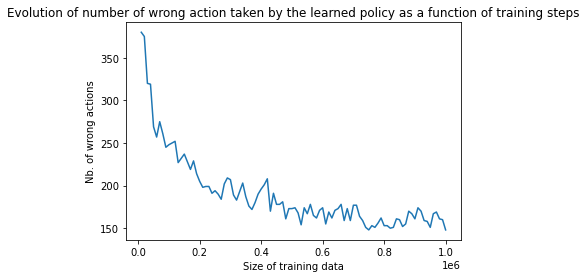


 Wrong actions : 
There are a lot of wrong actions :  148


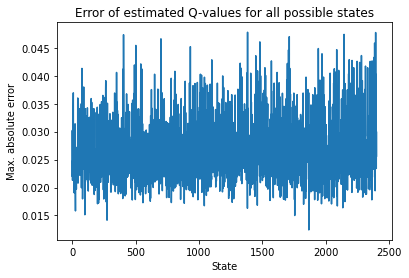

In [62]:
for x in jobs_adaptlr:
    plot_res_multi_QLearning(x,true_qval_delay2)

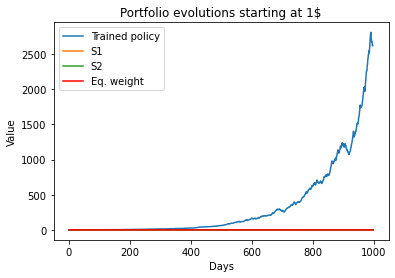

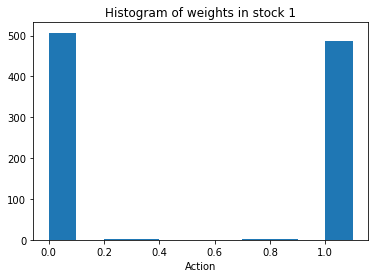

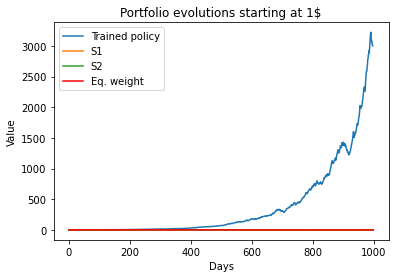

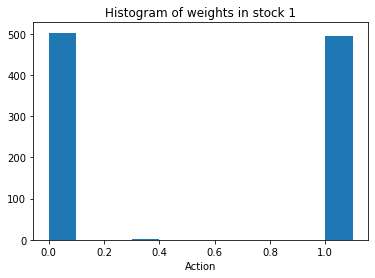

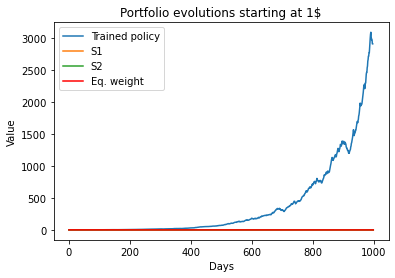

...

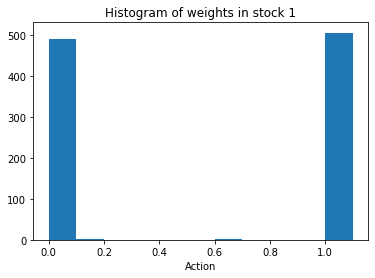

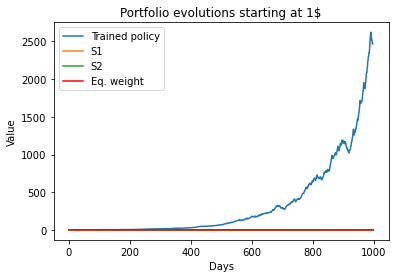

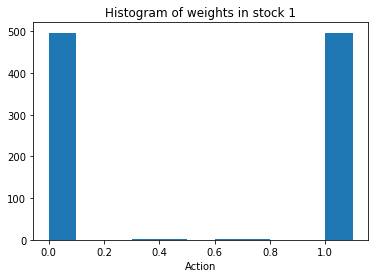

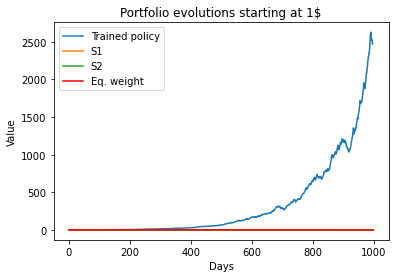

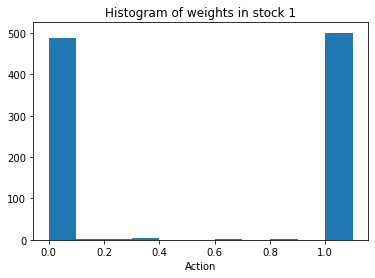

In [76]:
for x in jobs_adaptlr:
    plot_result(x['exploit_test'])

In [63]:

PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [0.0001,0.00001]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(train_del2, np.array(test_delay2),  window=w2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_delay2)])
            
    jobs_del2 = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 1


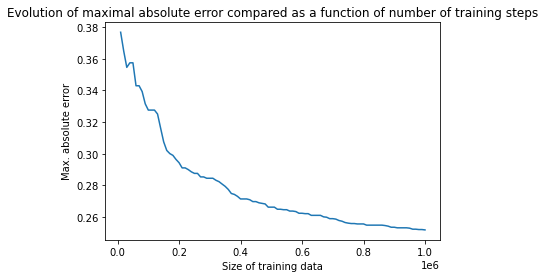

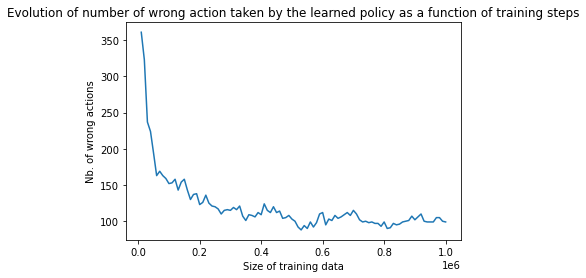


 Wrong actions : 
There are a lot of wrong actions :  99


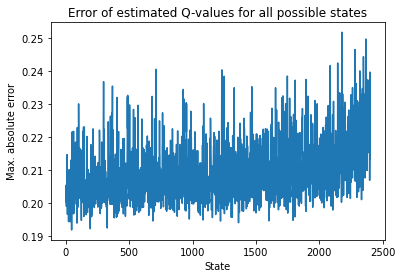


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 0.8


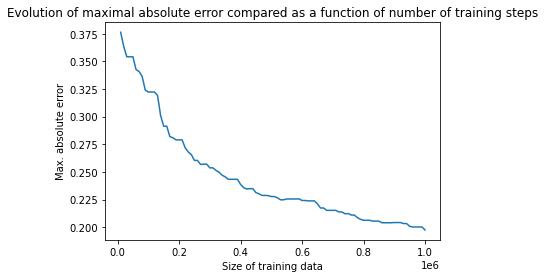

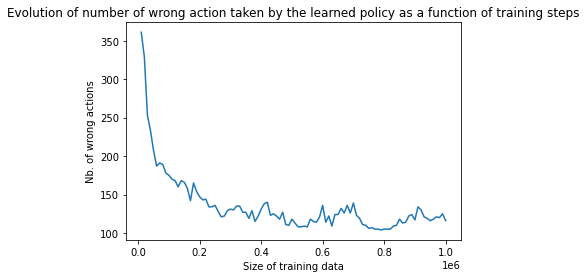


 Wrong actions : 
There are a lot of wrong actions :  116


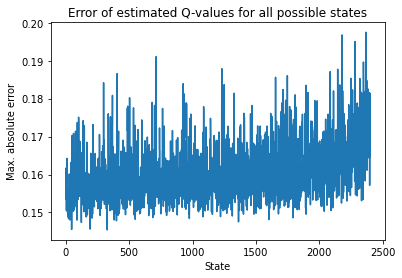


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 0.6


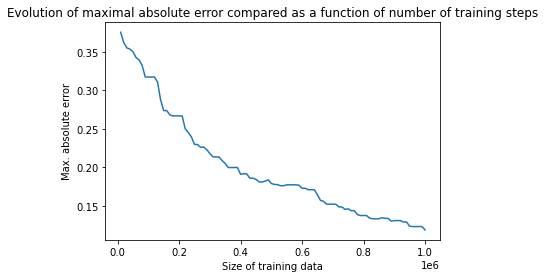

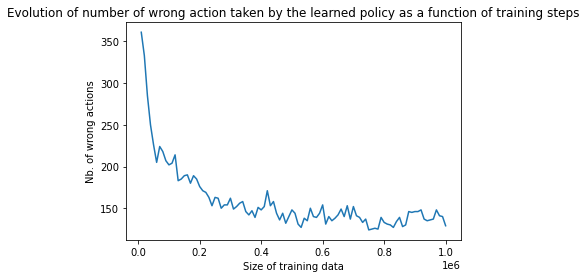


 Wrong actions : 
There are a lot of wrong actions :  129


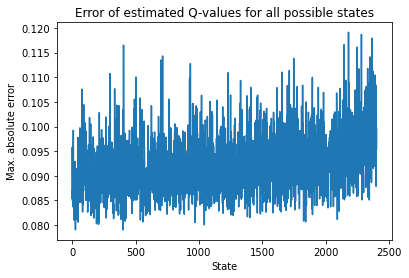


 

Simple learning rate: Decay rate : 1e-05, Beta : 0, Tau : 1


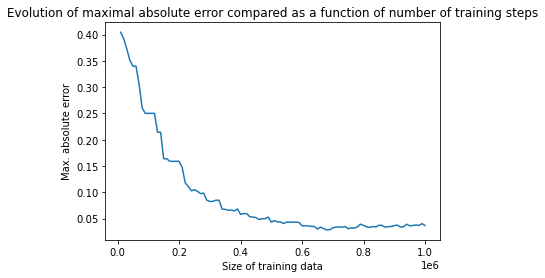

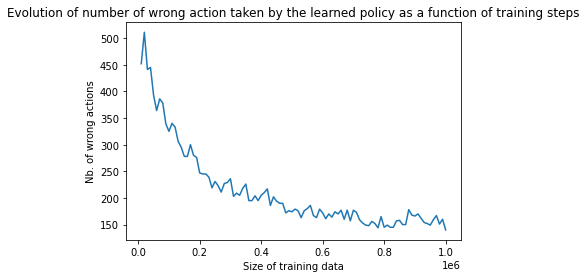


 Wrong actions : 
There are a lot of wrong actions :  140


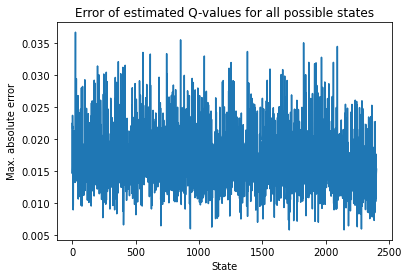


 

Simple learning rate: Decay rate : 1e-05, Beta : 0, Tau : 0.8


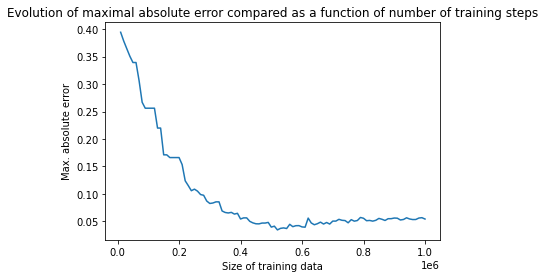

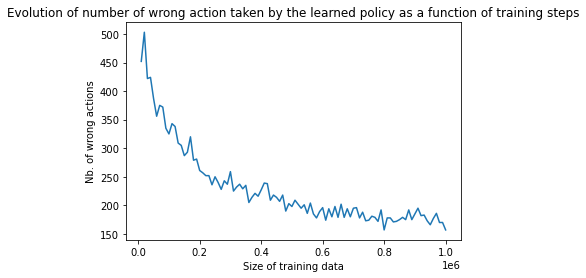


 Wrong actions : 
There are a lot of wrong actions :  157


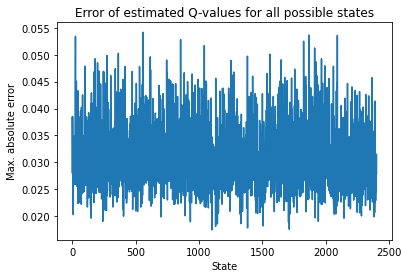


 

Simple learning rate: Decay rate : 1e-05, Beta : 0, Tau : 0.6


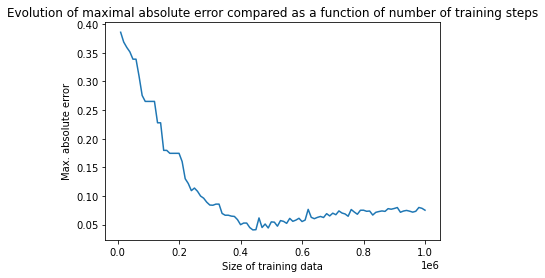

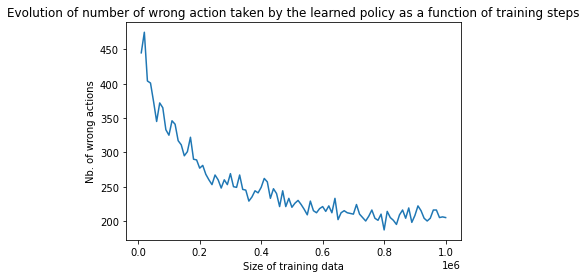


 Wrong actions : 
There are a lot of wrong actions :  205


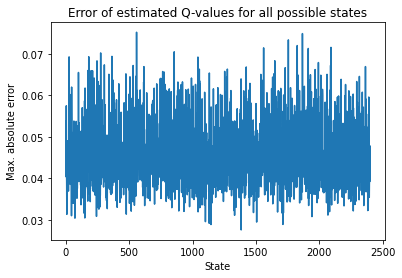

In [64]:
for x in jobs_del2:
    plot_res_multi_QLearning(x,true_qval_delay2)

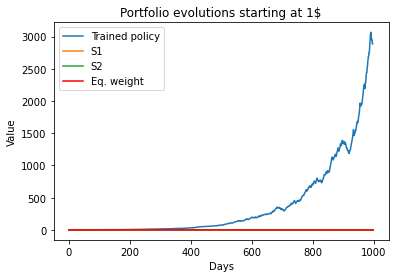

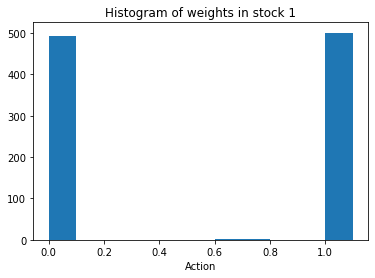

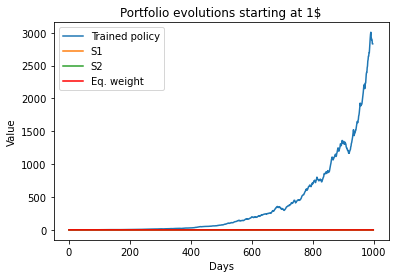

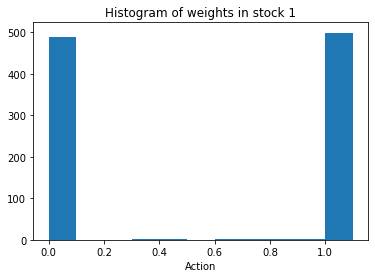

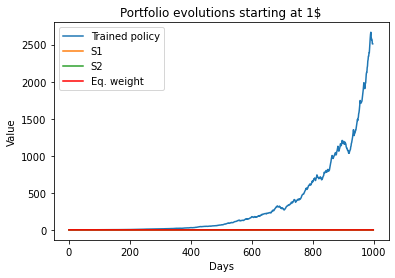

...

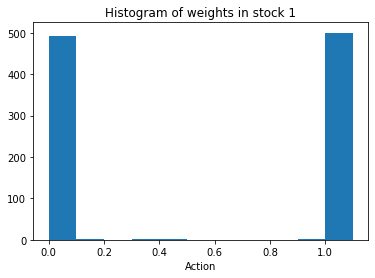

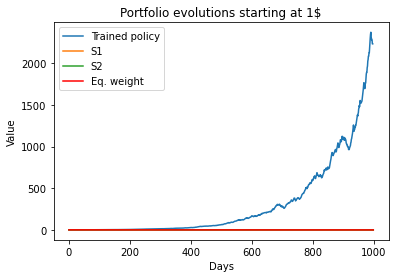

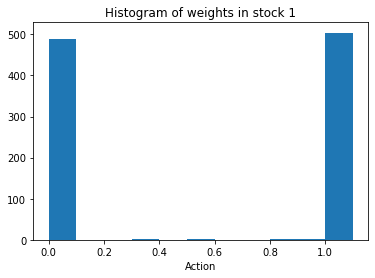

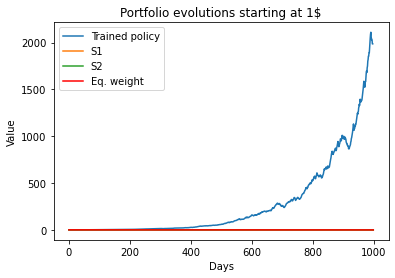

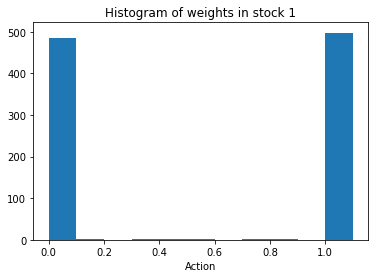

In [77]:
for x in jobs_del2:
    plot_result(x['exploit_test'])

In [66]:
for k in true_qval_delay2.keys():
    if np.argmax(true_qval_delay2[k]) != np.argmax(jobs_del2[0]['q_val'][k]):
        print(k, '; Action derived by optimal policy: ', np.argmax(true_qval_delay2[k]), '; Action from QLearning algorithm : ',
              np.argmax(jobs_del2[0]['q_val'][k]))


[0.97, 0.97, 1.0, 0.97] ; Action derived by optimal policy:  0 ; Action from QLearning algorithm :  10
[0.97, 0.98, 1.0, 0.97] ; Action derived by optimal policy:  0 ; Action from QLearning algorithm :  10
[0.97, 0.98, 1.0, 1.03] ; Action derived by optimal policy:  10 ; Action from QLearning algorithm :  0
[0.97, 0.99, 1.0, 1.0] ; Action derived by optimal policy:  0 ; Action from QLearning algorithm :  3
[0.97, 1.01, 1.0, 0.97] ; Action derived by optimal policy:  0 ; Action from QLearning algorithm :  10
[0.97, 1.01, 1.0, 0.99] ; Action derived by optimal policy:  10 ; Action from QLearning algorithm :  0
[0.97, 1.02, 1.0, 0.97] ; Action derived by optimal policy:  0 ; Action from QLearning algorithm :  10
[0.97, 1.02, 1.0, 0.98] ; Action derived by optimal policy:  10 ; Action from QLearning algorithm :  0
[0.97, 1.02, 1.0, 1.02] ; Action derived by optimal policy:  0 ; Action from QLearning algorithm :  10
[0.97, 1.03, 1.0, 0.98] ; Action derived by optimal policy:  10 ; Action fr

In [67]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for tau in [0.8]:
        for beta in [1e-3,1e-4,1e-5,1e-6]:
            params.extend([create_param_QLearning(train_del2, np.array(test_delay2),  window=w2, decay_rate=0.001,tau=tau,beta=beta,true_qval = true_qval_delay2)])
            
    jobs_del2_001 = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 0.001, Beta : 0.001, Tau : 0.8


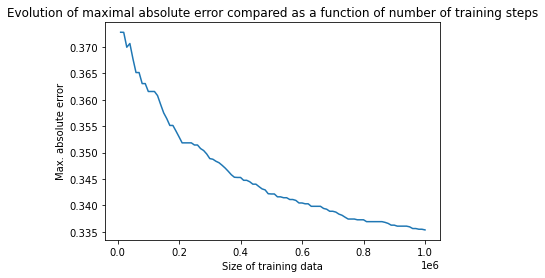

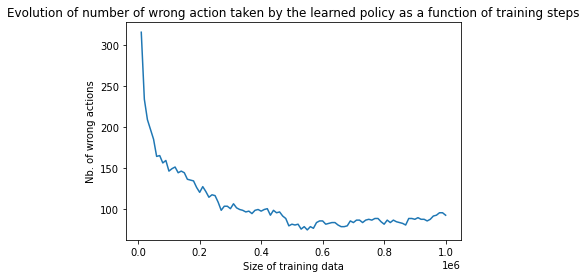


 Wrong actions : 
There are a lot of wrong actions :  92


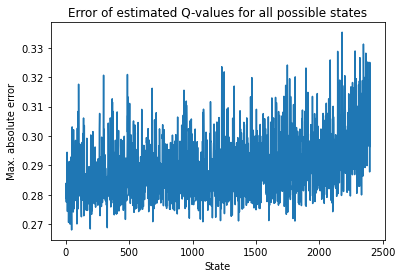


 

Simple learning rate: Decay rate : 0.001, Beta : 0.0001, Tau : 0.8


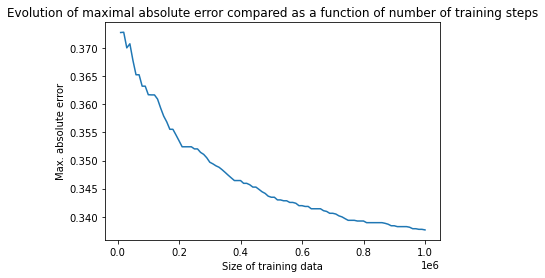

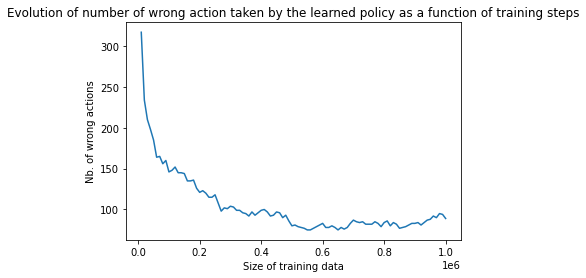


 Wrong actions : 
There are a lot of wrong actions :  89


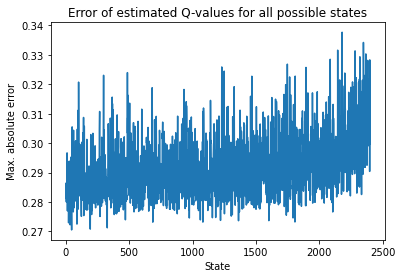


 

Simple learning rate: Decay rate : 0.001, Beta : 1e-05, Tau : 0.8


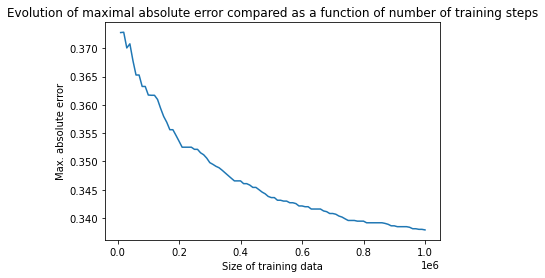

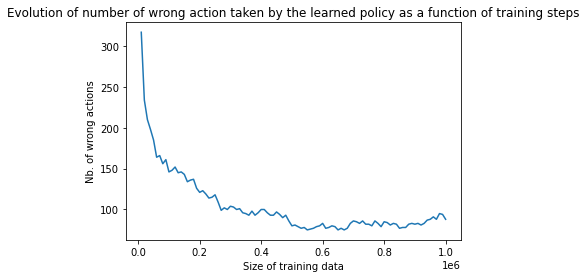


 Wrong actions : 
There are a lot of wrong actions :  88


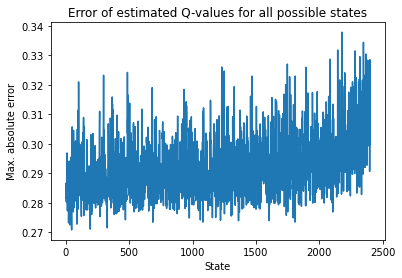


 

Simple learning rate: Decay rate : 0.001, Beta : 1e-06, Tau : 0.8


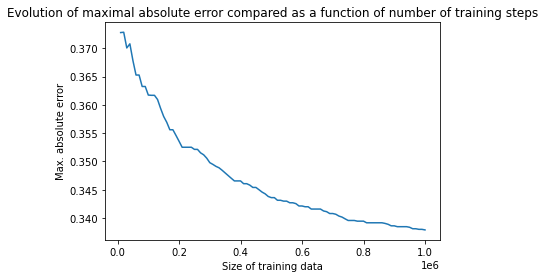

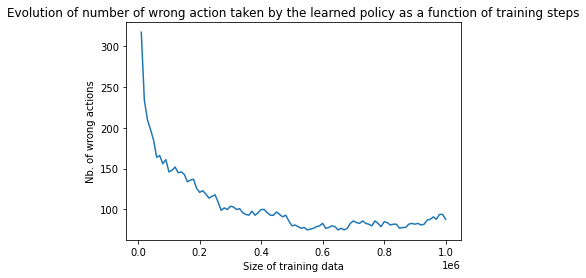


 Wrong actions : 
There are a lot of wrong actions :  88


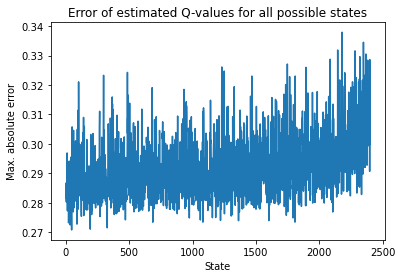

In [68]:
for x in jobs_del2_001:
    plot_res_multi_QLearning(x,true_qval_delay2)

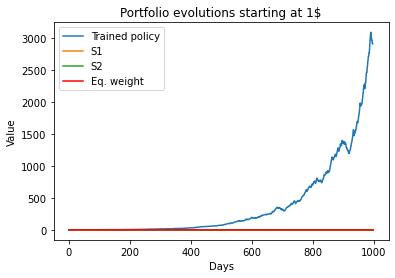

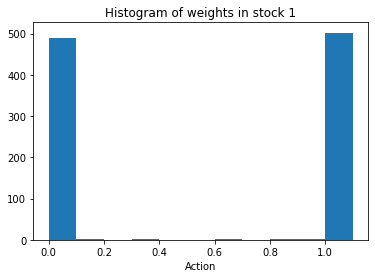

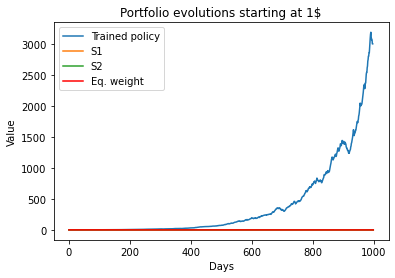

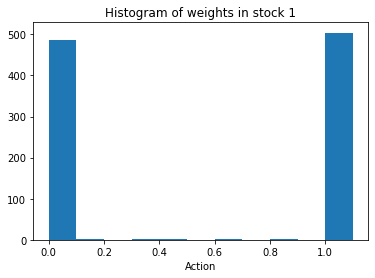

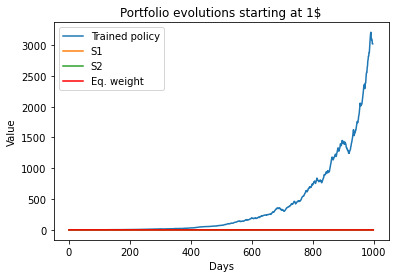

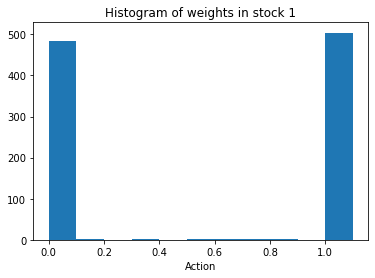

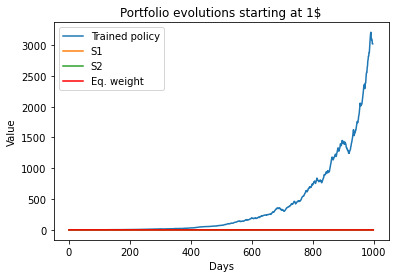

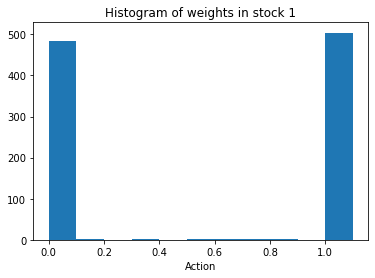

In [78]:
for x in jobs_del2_001:
    plot_result(x['exploit_test'])

In [69]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [0.001,0.0008,0.0001]:
        for tau in [0.9,0.52]:
            params.extend([create_param_QLearning(train_del2, np.array(test_delay2),  window=w2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_delay2)])
            
    jobs_del2_001_other = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


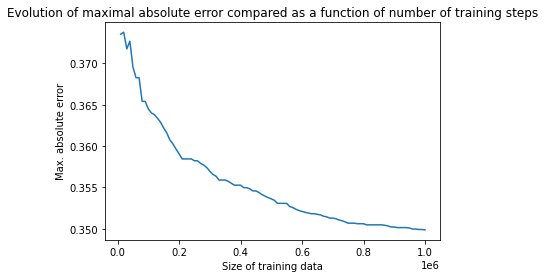

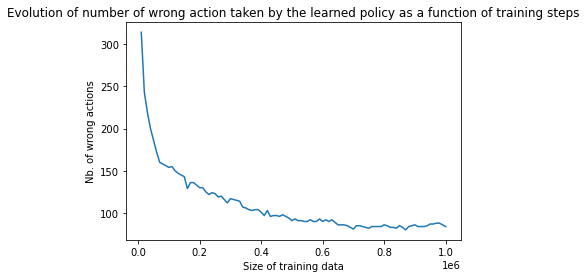


 Wrong actions : 
There are a lot of wrong actions :  84


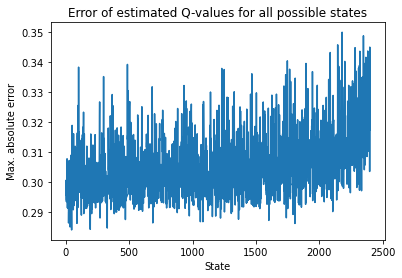


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.52


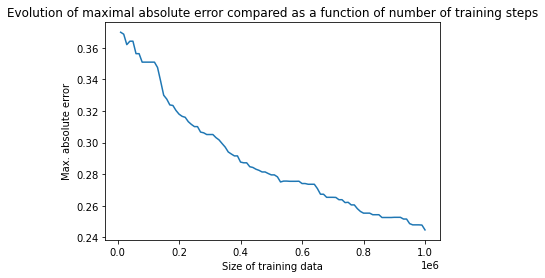

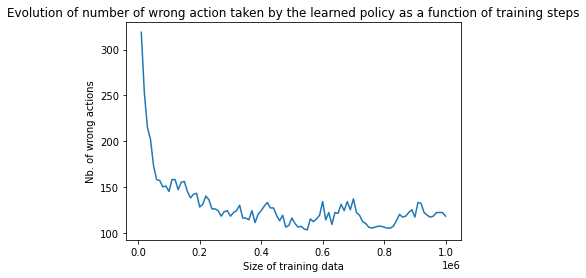


 Wrong actions : 
There are a lot of wrong actions :  118


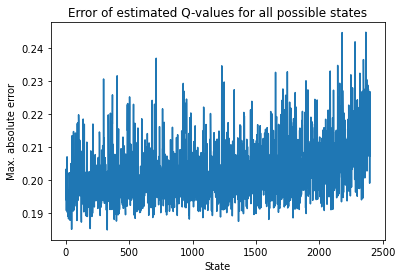


 

Simple learning rate: Decay rate : 0.0008, Beta : 0, Tau : 0.9


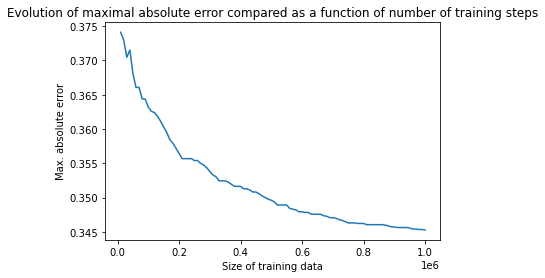

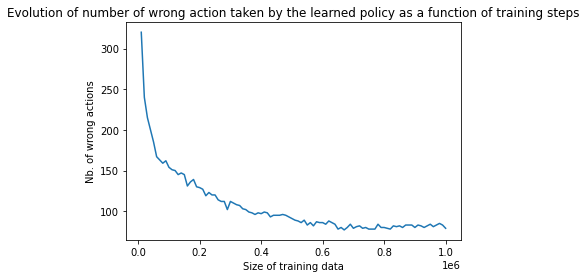


 Wrong actions : 
There are a lot of wrong actions :  79


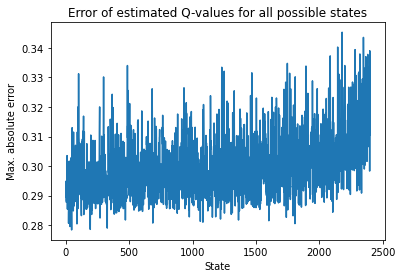


 

Simple learning rate: Decay rate : 0.0008, Beta : 0, Tau : 0.52


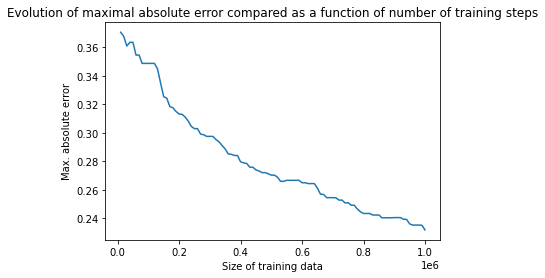

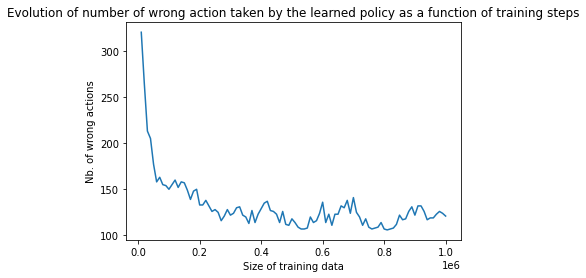


 Wrong actions : 
There are a lot of wrong actions :  121


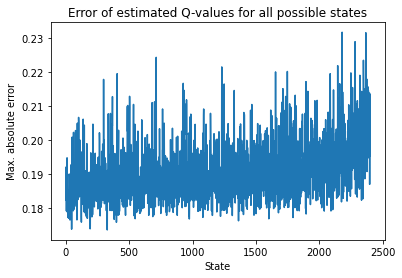


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 0.9


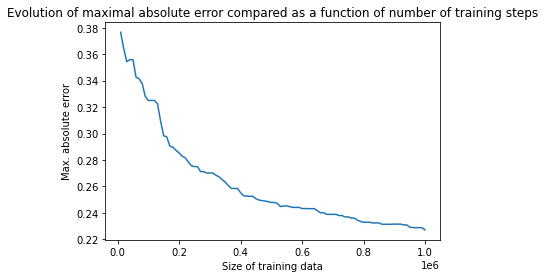

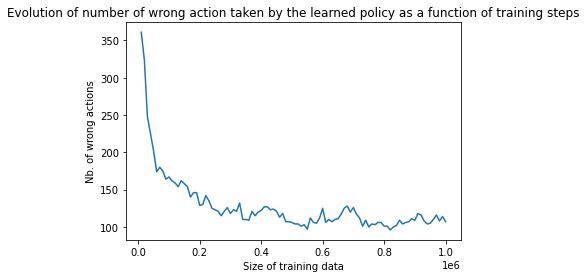


 Wrong actions : 
There are a lot of wrong actions :  107


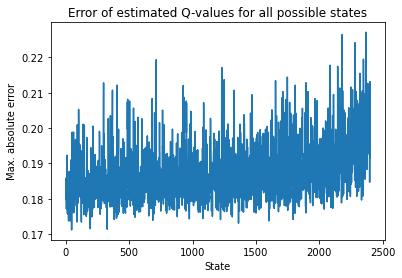


 

Simple learning rate: Decay rate : 0.0001, Beta : 0, Tau : 0.52


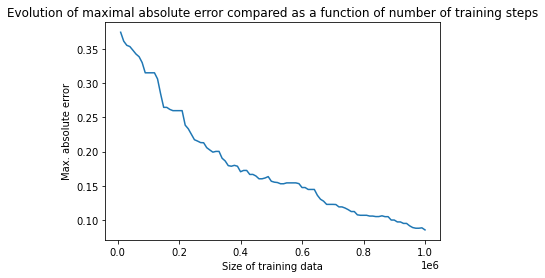

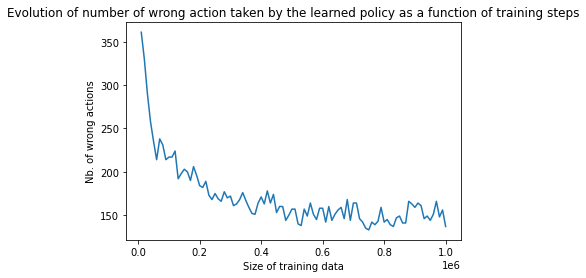


 Wrong actions : 
There are a lot of wrong actions :  137


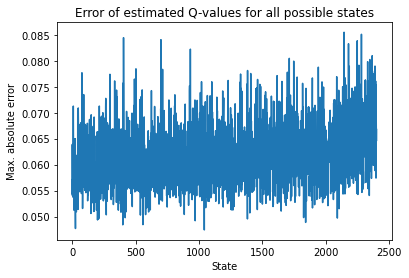

In [70]:
for x in jobs_del2_001_other:
    plot_res_multi_QLearning(x,true_qval_delay2)

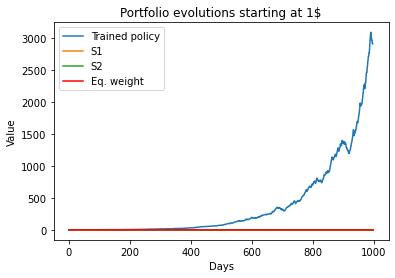

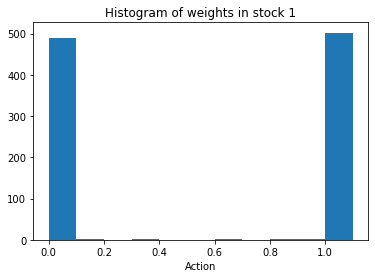

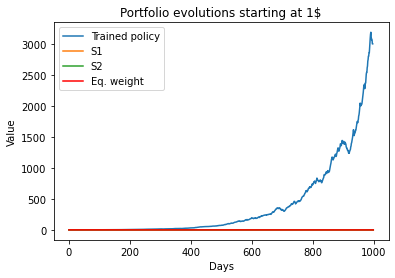

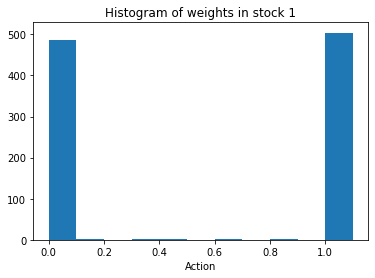

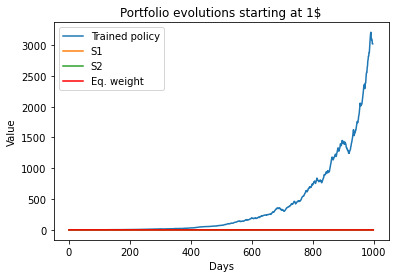

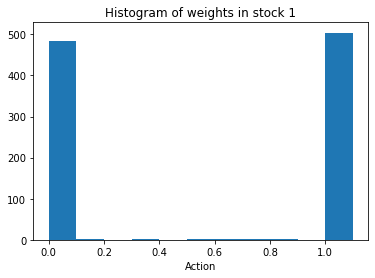

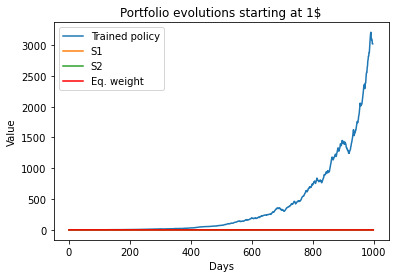

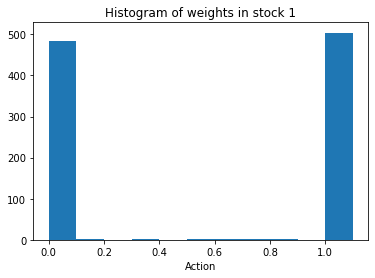

In [79]:
for x in jobs_del2_001:
    plot_result(x['exploit_test'])

In [72]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [10,1,0.1]:
        for tau in [0.9,0.55]:
            params.extend([create_param_QLearning(train_del2, np.array(test_delay2),  window=w2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_delay2,adaptive_lr=True)])
            
    jobs_del2_001_other_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.9


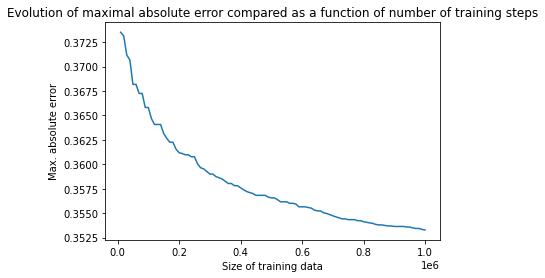

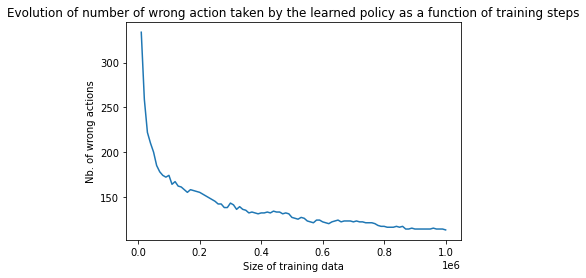


 Wrong actions : 
There are a lot of wrong actions :  113


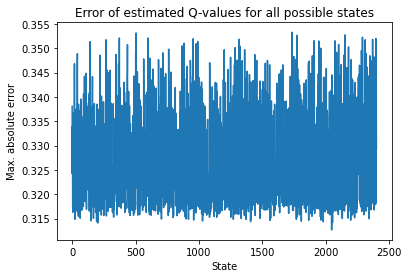


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.55


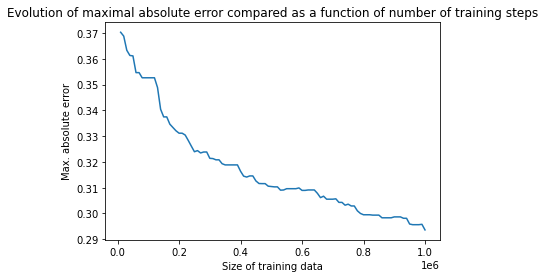

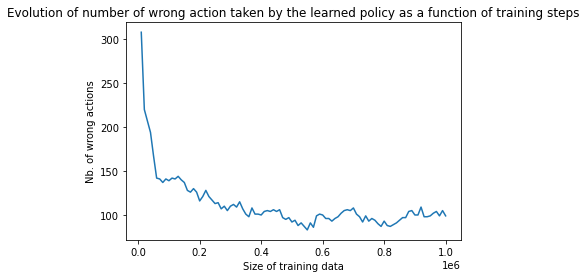


 Wrong actions : 
There are a lot of wrong actions :  99


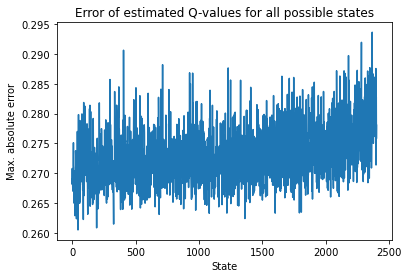


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


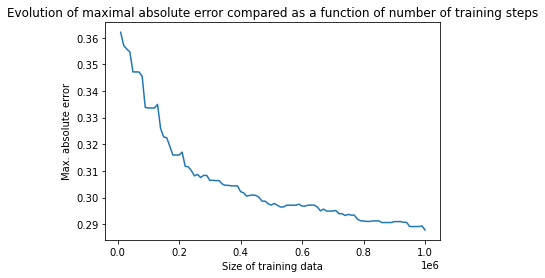

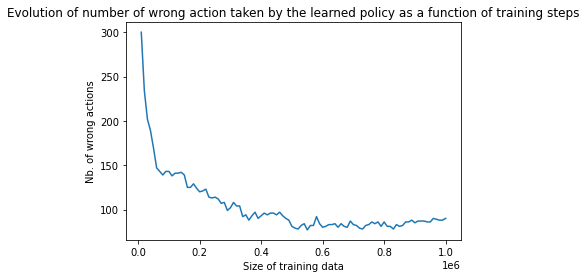


 Wrong actions : 
There are a lot of wrong actions :  90


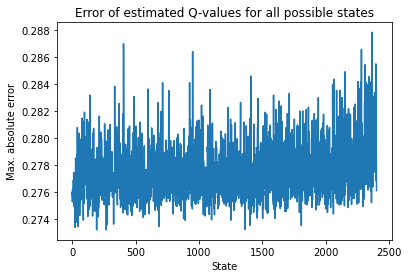


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.55


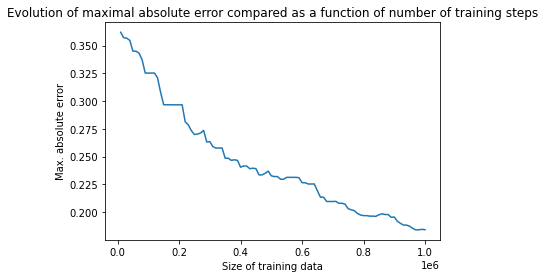

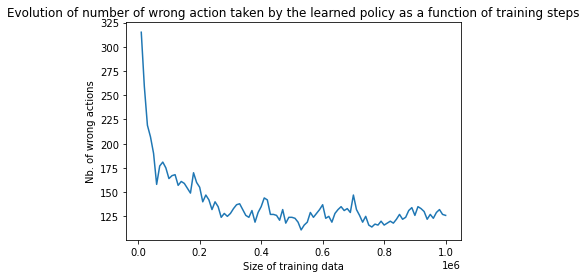


 Wrong actions : 
There are a lot of wrong actions :  126


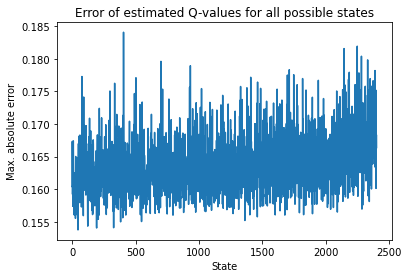


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.9


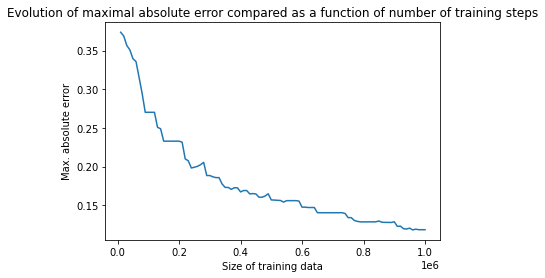

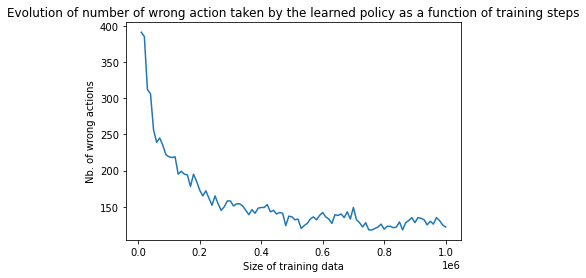


 Wrong actions : 
There are a lot of wrong actions :  122


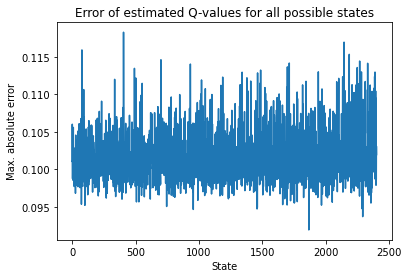


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.55


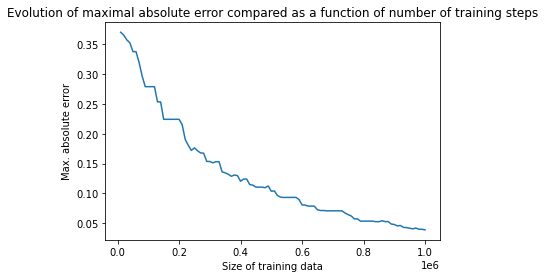

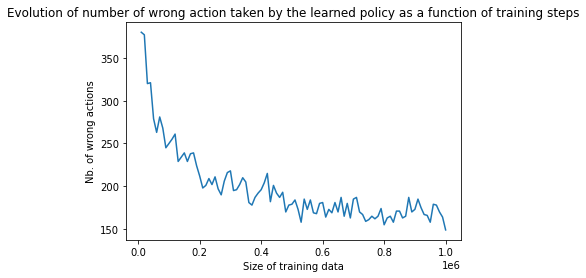


 Wrong actions : 
There are a lot of wrong actions :  149


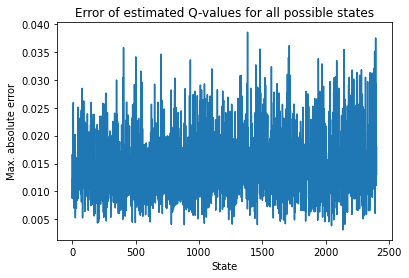

In [73]:
for x in jobs_del2_001_other_adaptlr:
    plot_res_multi_QLearning(x,true_qval_delay2)

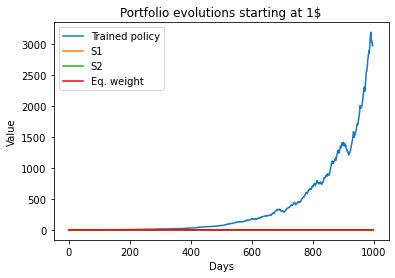

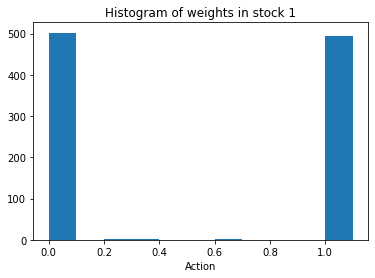

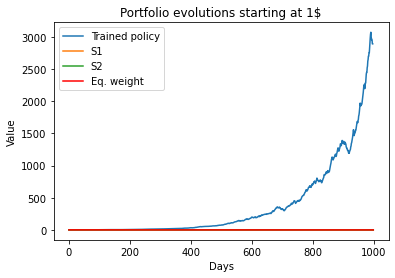

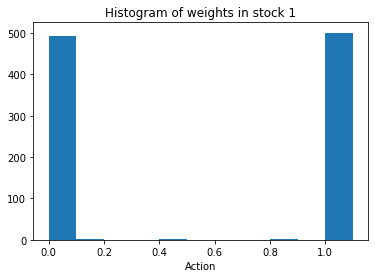

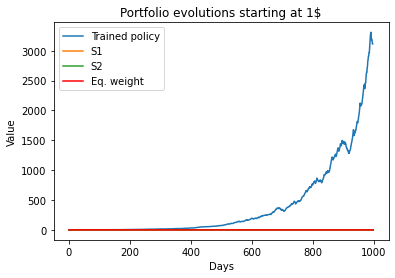

...

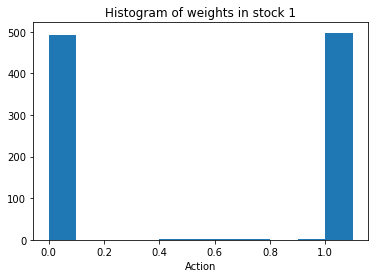

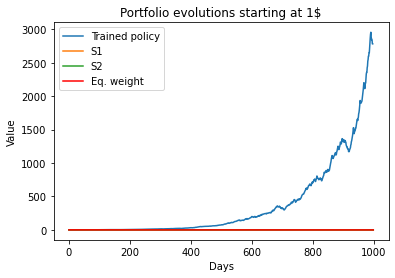

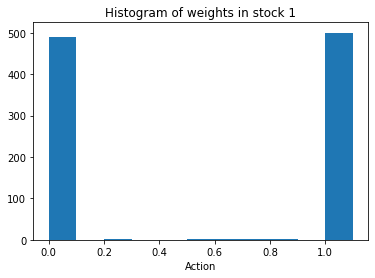

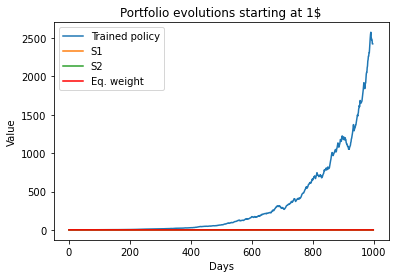

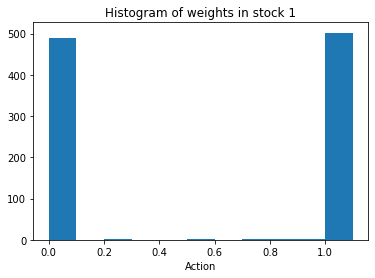

In [80]:
for x in jobs_del2_001_other_adaptlr:
    plot_result(x['exploit_test'])

In [81]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [0.01,0.5]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(train_del2, np.array(test_delay2),  window=w2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_delay2,adaptive_lr=True)])
            
    jobs_del2_decay01_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


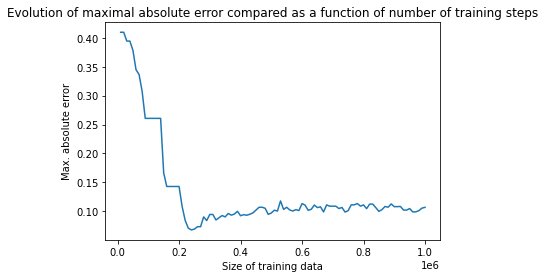

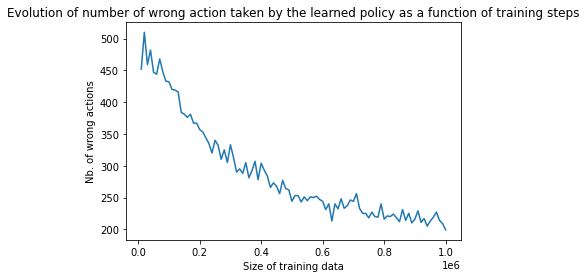


 Wrong actions : 
There are a lot of wrong actions :  199


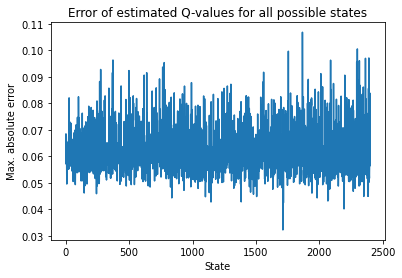


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


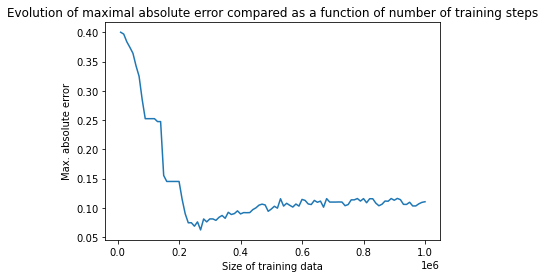

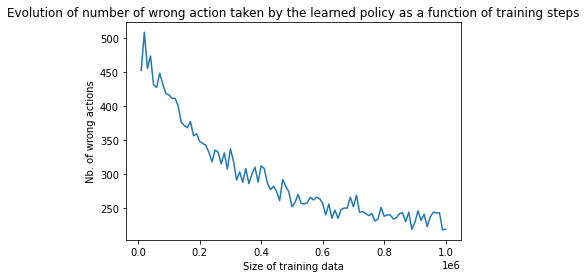


 Wrong actions : 
There are a lot of wrong actions :  219


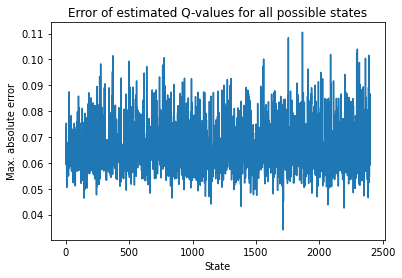


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


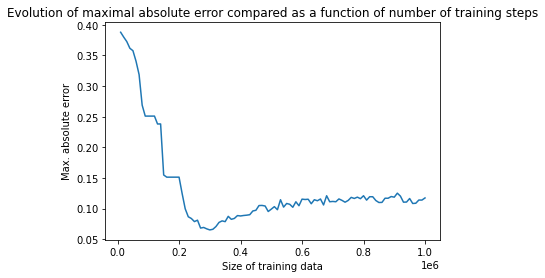

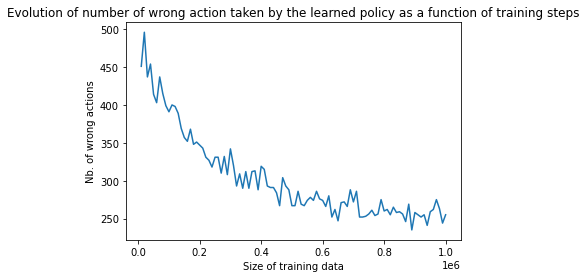


 Wrong actions : 
There are a lot of wrong actions :  255


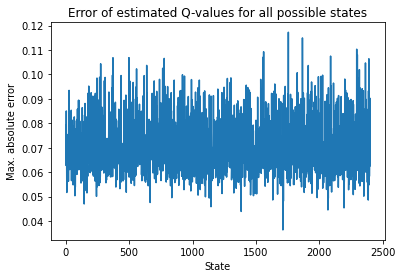


 

Learning rate dependent on states: Decay rate : 0.5, Beta : 0, Tau : 1


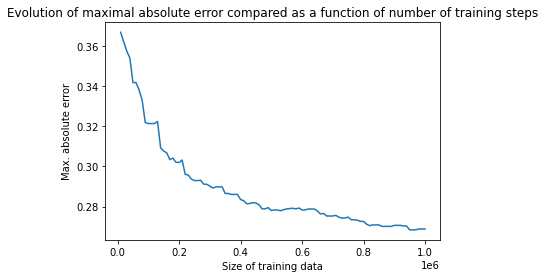

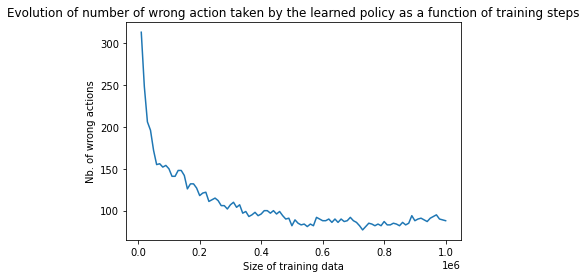


 Wrong actions : 
There are a lot of wrong actions :  88


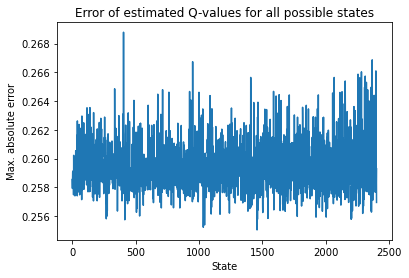


 

Learning rate dependent on states: Decay rate : 0.5, Beta : 0, Tau : 0.8


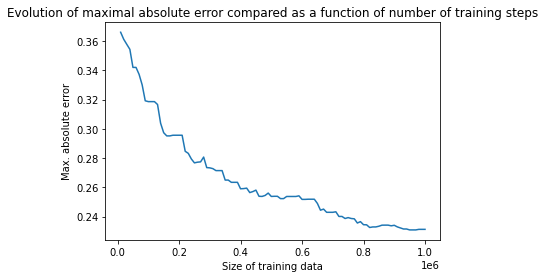

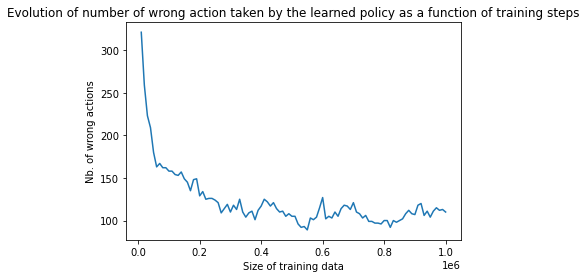


 Wrong actions : 
There are a lot of wrong actions :  110


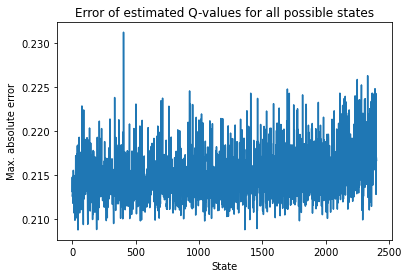


 

Learning rate dependent on states: Decay rate : 0.5, Beta : 0, Tau : 0.6


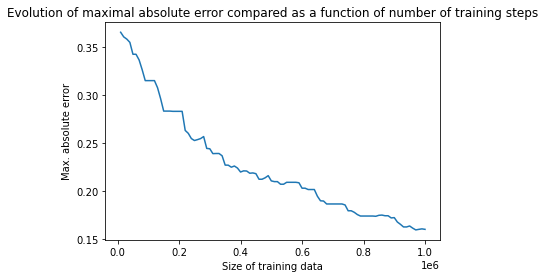

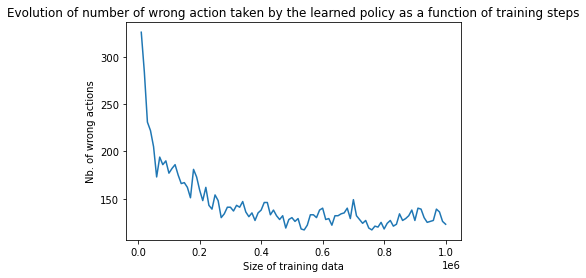


 Wrong actions : 
There are a lot of wrong actions :  123


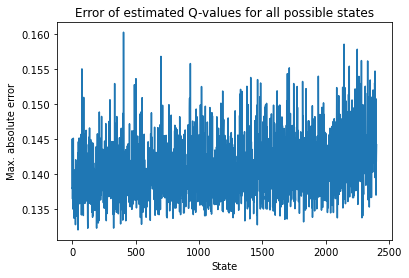

In [82]:
for x in jobs_del2_decay01_adaptlr:
    plot_res_multi_QLearning(x,true_qval_delay2)

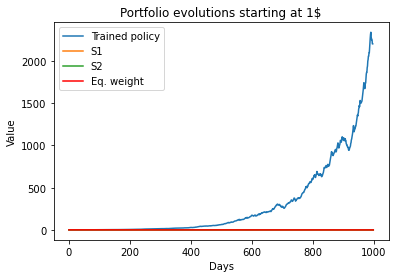

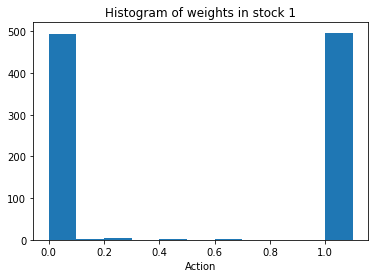

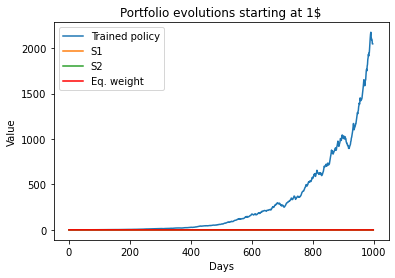

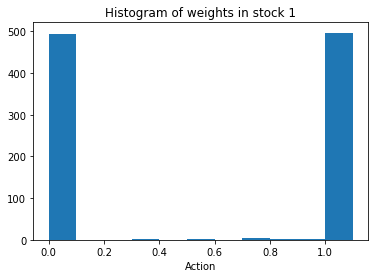

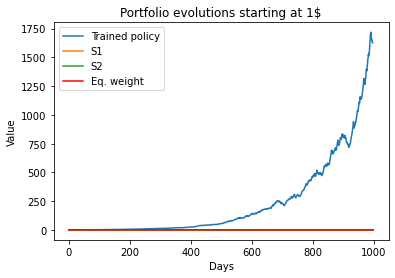

...

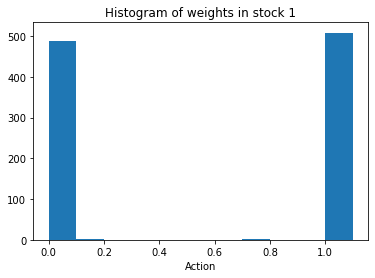

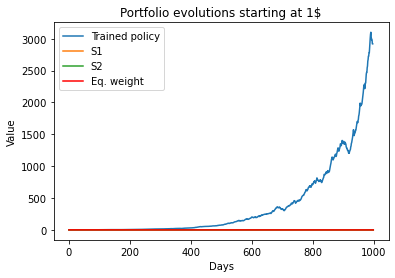

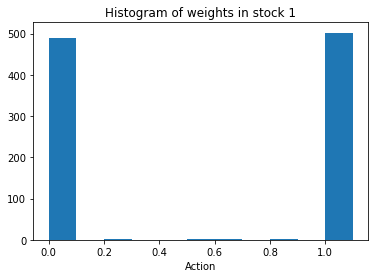

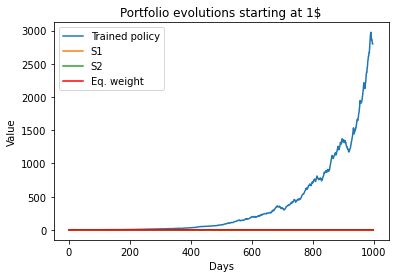

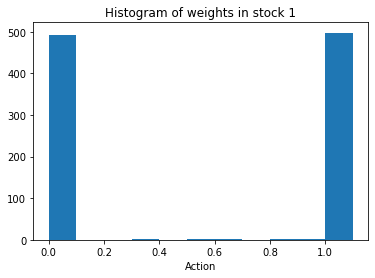

In [83]:
for x in jobs_del2_decay01_adaptlr:
    plot_result(x['exploit_test'])

# Adaptive learning rate: Best learned policy

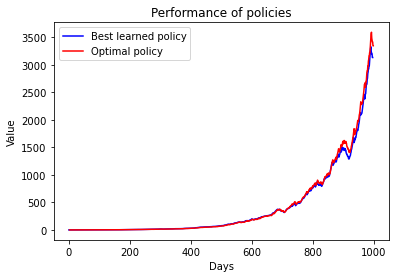

In [134]:
plt.plot(np.cumprod(jobs_adaptlr[6]['exploit_test']['ret']),'blue')
plt.plot(np.cumprod(ret_opt_delay2),'red')
plt.title('Performance of policies')
plt.xlabel('Days')
plt.ylabel('Value')
plt.legend(['Best learned policy','Optimal policy' ])

plt.show()

# Simple learning rate: Best learned policy

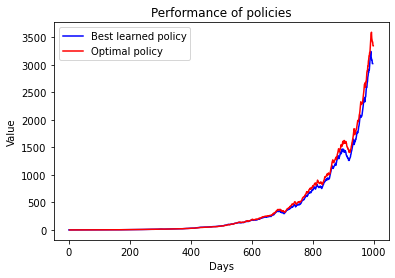

In [123]:
plt.plot(np.cumprod(jobs[5]['exploit_test']['ret']),'blue')
plt.plot(np.cumprod(ret_opt_delay2),'red')
plt.title('Performance of policies')
plt.xlabel('Days')
plt.ylabel('Value')
plt.legend(['Best learned policy','Optimal policy' ])

plt.show()


In [108]:
true_qval_delay2

{'[0.97, 0.97, 0.97, 0.97]': array([0.31896469, 0.31595353, 0.31292992, 0.30989373, 0.30684485,
        0.30378316, 0.30070854, 0.29762088, 0.29452004, 0.29140592,
        0.28827837]),
 '[0.97, 0.97, 0.97, 0.98]': array([0.31666107, 0.31386851, 0.31106445, 0.30824879, 0.30542142,
        0.30258223, 0.2997311 , 0.29686793, 0.2939926 , 0.291105  ,
        0.288205  ]),
 '[0.97, 0.97, 0.97, 0.99]': array([0.31708044, 0.31417404, 0.31125591, 0.30832595, 0.30538403,
        0.30243006, 0.29946392, 0.29648548, 0.29349464, 0.29049127,
        0.28747526]),
 '[0.97, 0.97, 0.97, 1.0]': array([0.3209769 , 0.31794972, 0.31490939, 0.31185578, 0.30878877,
        0.30570822, 0.30261399, 0.29950595, 0.29638395, 0.29324786,
        0.29009752]),
 '[0.97, 0.97, 0.97, 1.01]': array([0.32364914, 0.32101377, 0.31836807, 0.31571192, 0.31304525,
        0.31036796, 0.30767995, 0.30498112, 0.30227137, 0.29955061,
        0.29681872]),
 '[0.97, 0.97, 0.97, 1.02]': array([0.34183583, 0.33868061, 0.33551158,

In [131]:
jobs_adaptlr[6]['q_val']

{'[0.99, 0.98, 1.02, 1.02]': array([0.05113978, 0.05294703, 0.05474735, 0.05654078, 0.05832739,
        0.06010721, 0.0618803 , 0.06364672, 0.06540651, 0.06715972,
        0.06890639]),
 '[0.98, 1.02, 1.02, 0.98]': array([0.02598198, 0.02827442, 0.03055775, 0.03283205, 0.03509739,
        0.03735384, 0.03960148, 0.04184038, 0.04407061, 0.04629224,
        0.04850534]),
 '[1.02, 1.02, 0.98, 1.02]': array([0.05236014, 0.05012816, 0.04788712, 0.04563696, 0.04337759,
        0.04110895, 0.03883096, 0.03654353, 0.03424659, 0.03194006,
        0.02962385]),
 '[1.02, 0.98, 1.02, 1.0]': array([0.03055819, 0.03246621, 0.03436643, 0.0362589 , 0.03814369,
        0.04002086, 0.04189046, 0.04375256, 0.0456072 , 0.04745445,
        0.04929436]),
 '[0.98, 1.02, 1.0, 0.98]': array([0.02602595, 0.02626014, 0.02649035, 0.02671659, 0.02693887,
        0.02715719, 0.02737156, 0.02758198, 0.02778845, 0.02799099,
        0.02818959]),
 '[1.02, 1.0, 0.98, 1.0]': array([0.03071987, 0.02864427, 0.02656038, 0.

In [132]:
for k in jobs_adaptlr[6]['q_val'].keys():
    if np.argmax(jobs_adaptlr[6]['q_val'][k]) != np.argmax(true_qval_delay2[k]):
        print( k, ' Optimal action : ', np.argmax(true_qval_delay2[k]), '; Learned action : ',np.argmax(jobs_adaptlr[6]['q_val'][k]))

[0.98, 0.98, 1.0, 1.03]  Optimal action :  10 ; Learned action :  0
[0.99, 0.98, 1.0, 1.0]  Optimal action :  0 ; Learned action :  10
[0.98, 1.02, 1.0, 1.02]  Optimal action :  0 ; Learned action :  2
[1.0, 0.98, 1.0, 1.0]  Optimal action :  0 ; Learned action :  10
[0.98, 1.0, 1.0, 0.97]  Optimal action :  0 ; Learned action :  6
[0.98, 1.02, 1.0, 0.99]  Optimal action :  10 ; Learned action :  8
[1.0, 1.02, 1.0, 1.0]  Optimal action :  0 ; Learned action :  10
[1.0, 1.01, 1.0, 1.03]  Optimal action :  10 ; Learned action :  0
[0.97, 1.0, 1.0, 0.97]  Optimal action :  0 ; Learned action :  2
[0.98, 0.99, 1.0, 0.97]  Optimal action :  0 ; Learned action :  10
[1.01, 0.97, 1.0, 0.97]  Optimal action :  0 ; Learned action :  10
[1.03, 1.02, 1.0, 1.0]  Optimal action :  0 ; Learned action :  10
[1.03, 1.03, 1.0, 1.03]  Optimal action :  10 ; Learned action :  0
[1.03, 0.99, 1.0, 1.03]  Optimal action :  10 ; Learned action :  2
[1.01, 1.02, 1.0, 1.0]  Optimal action :  0 ; Learned action

# Convergence is quite difficult

Q-Learning leads to around $80$ wrong actions for the best choice of learning parameters for $1764$ possible states, however the performance on testing data is almost as good as for the true optimal policy.

Another remark comes from the fact that errors are too large, all around $0.3$. This could be due to the initialization of the Q-table in the Q-Learning algorithm at zero. In the following, we try another initial value of $0.3$ instead of $0.0$ as true optimal q-values lie near $0.3$.

## Test with a different initial value for Q-Learning: $Q_0=0.3$

In [121]:
jobs_adaptlr[6]['string_param']

'Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1'

2


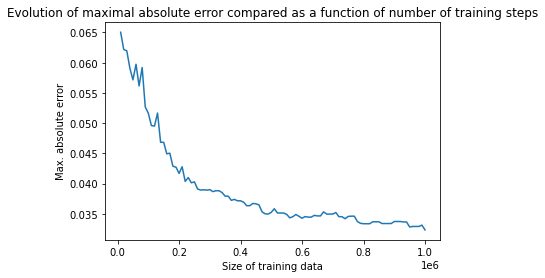

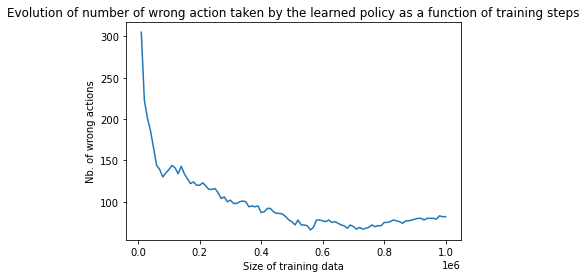

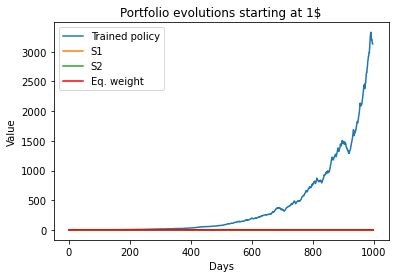

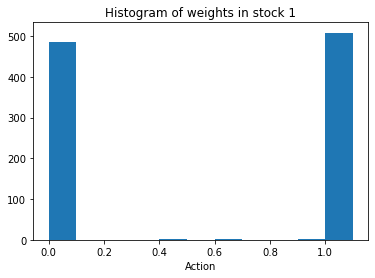

In [122]:
w2=2
gamma=0.98
pol_init=Policy_init_val(w2,gamma,Q0=0.3)
pol_init.train(pd.DataFrame(train_del2,index=['S1','S2']),decay_rate=1,tau=1,true_qval=true_qval_delay2,adaptive_lr=True)

res_delay2=analysis_result(pol_init,np.array(test_delay2))
plot_result(res_delay2)

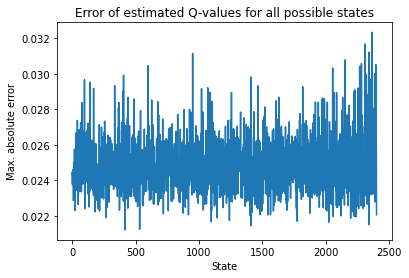

In [128]:
plot_error_per_state(conv_qtables(true_qval_delay2,pol_init.q_val))

In [130]:
conv_qtables(true_qval_delay2,pol_init.q_val)['nb_wrong']

82

### Same number of wrong actions, however errors are really small. Hence, initialization of q-values in Q-Learning seems to be important to derive good estimate of q-values in training, nevertheless the learned policy isn't impacted which remains the most important.